# By: MUSKAN GUPTA , SUMMER INTERNSHIP PROJECT 

# Covid 19 Tweets Data Exploration and Sentiment analysis
 # Task

# Text Preprocessing
   

#     Sentiment Analysis
    


# Keyword Extraction

# Entity Extraction


In [5]:
### EDA Pkgs
import pandas as pd

In [7]:

# Data Viz Pkg
import matplotlib.pyplot as plt
import seaborn as sns



In [8]:


# Hide warnings
import warnings
warnings.filterwarnings('ignore')



In [11]:
# Load Dataset
df = pd.read_csv("/home/muskangupta/Downloads/covid19_tweets.csv")

In [12]:
# Preview
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False


# Text preprocessing

In [13]:


# Check Columns
df.columns



Index(['user_name', 'user_location', 'user_description', 'user_created',
       'user_followers', 'user_friends', 'user_favourites', 'user_verified',
       'date', 'text', 'hashtags', 'source', 'is_retweet'],
      dtype='object')

In [14]:


# Datatype
df.dtypes



user_name           object
user_location       object
user_description    object
user_created        object
user_followers       int64
user_friends         int64
user_favourites      int64
user_verified         bool
date                object
text                object
hashtags            object
source              object
is_retweet            bool
dtype: object

In [15]:


# Source/ Value Count/Distribution of the Sources
df['source'].unique()



array(['Twitter for iPhone', 'Twitter for Android', 'Twitter Web App',
       'Buffer', 'TweetDeck', 'Twitter for iPad', 'Africa Newsroom',
       'Blood Donors India', 'TweetCaster for Android',
       'Alexander Higgins', 'IFTTT', 'Hootsuite Inc.', 'Sprout Social',
       'Sprinklr', 'assarofficial', 'IAMBLOG2TWITTER', 'CrowdControlHQ',
       'COVID19-Updates', 'EveryoneSocial', 'Dynamic Signal', 'Instagram',
       'TweetCaster for iOS', 'GlobalPandemic.NET', 'Venrap Radio',
       'HeyOrca', 'Twitter for Advertisers', 'Paper.li',
       'Twitter Media Studio', 'Twitter for Mac', 'dlvr.it',
       'Cheap Bots, Done Quick!', 'Prof. Shanku', 'LaterMedia',
       'SEMrush Social Media Tool', 'Twitterrific for iOS',
       "Sebastian's Twitter Bot", 'Threader_client', 'COVID19FactoidBot',
       'PwC UK SMART', 'tweet pro stiff', 'UK COVID-19 Alerts',
       'Resistbot Open Letters', 'preprint-alert', 'ContentStudio.io',
       'Peeping Moon', 'TweetAutomaticos', 'Orlo', 'AgoraPulse Ma

In [22]:


# Source/ Value Count/Distribution of the Sources
df['source'].value_counts()



Twitter Web App             56891
Twitter for Android         40179
Twitter for iPhone          35472
TweetDeck                    8543
Hootsuite Inc.               7321
                            ...  
TtwTimes Top News               1
PRNewswire                      1
CIO Tech Asia Twitter           1
whatSaoCarlos                   1
InfoBlaze Southeast Asia        1
Name: source, Length: 610, dtype: int64

In [23]:


# Plot the top value_counts
df['source'].value_counts().nlargest(30)



Twitter Web App            56891
Twitter for Android        40179
Twitter for iPhone         35472
TweetDeck                   8543
Hootsuite Inc.              7321
Twitter for iPad            4336
Buffer                      2728
Sprout Social               1833
Instagram                   1759
IFTTT                       1545
dlvr.it                      681
GlobalPandemic.NET           679
LinkedIn                     628
COVID19-Updates              625
Twitter Media Studio         596
WordPress.com                537
HubSpot                      513
Sprinklr                     497
FS Poster                    414
Dynamic Signal               391
Resistbot Open Letters       390
Cheap Bots, Done Quick!      335
Paper.li                     322
Twitter for Advertisers      317
Blood Donors India           281
IAMBLOG2TWITTER              266
Alexander Higgins            225
Zoho Social                  224
The Social Jukebox           216
Fabrik.fm                    209
Name: sour

<AxesSubplot:>

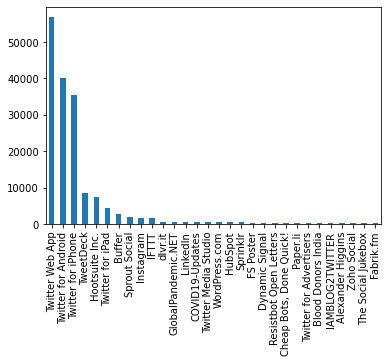

In [24]:


# Plot the top value_counts
df['source'].value_counts().nlargest(30).plot(kind='bar')



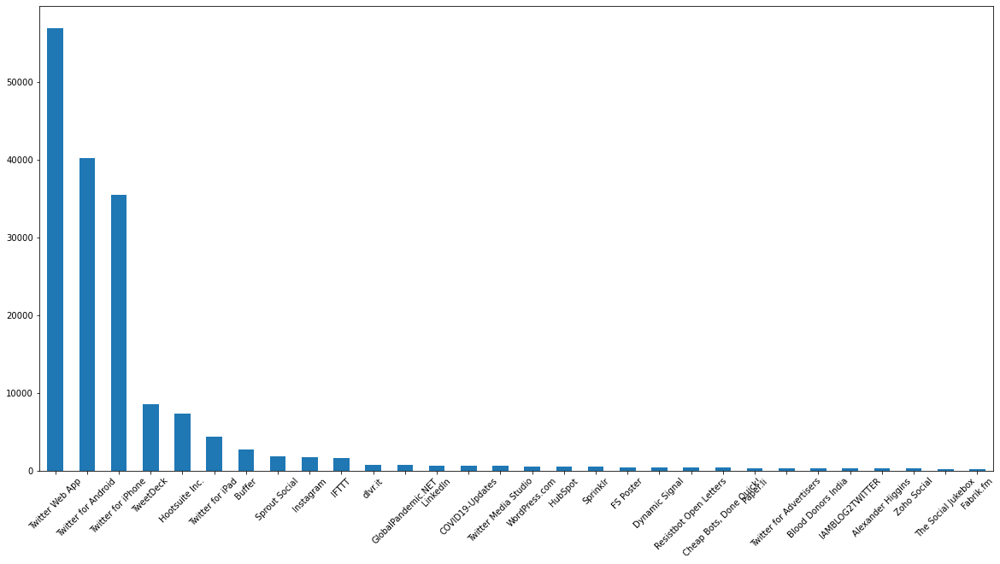

In [25]:


# Plot the top value_counts
plt.figure(figsize=(20,10))
df['source'].value_counts().nlargest(30).plot(kind='bar')
plt.xticks(rotation=45)
plt.show()



# Text Analysis of tweet

In [26]:
pip install neattext

     |████████████████████████████████| 114 kB 1.2 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [27]:


# Load Text Cleaning Package
import neattext.functions as nfx



In [28]:


# Methods/Attrib
dir(nfx)



['BTC_ADDRESS_REGEX',
 'CURRENCY_REGEX',
 'CURRENCY_SYMB_REGEX',
 'Counter',
 'DATE_REGEX',
 'EMAIL_REGEX',
 'EMOJI_REGEX',
 'HASTAG_REGEX',
 'MASTERCard_REGEX',
 'MD5_SHA_REGEX',
 'MOST_COMMON_PUNCT_REGEX',
 'NUMBERS_REGEX',
 'PHONE_REGEX',
 'PoBOX_REGEX',
 'SPECIAL_CHARACTERS_REGEX',
 'STOPWORDS',
 'STOPWORDS_de',
 'STOPWORDS_en',
 'STOPWORDS_es',
 'STOPWORDS_fr',
 'STOPWORDS_ru',
 'STOPWORDS_yo',
 'STREET_ADDRESS_REGEX',
 'TextFrame',
 'URL_PATTERN',
 'USER_HANDLES_REGEX',
 'VISACard_REGEX',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__generate_text',
 '__loader__',
 '__name__',
 '__numbers_dict',
 '__package__',
 '__spec__',
 '_lex_richness_herdan',
 '_lex_richness_maas_ttr',
 'clean_text',
 'defaultdict',
 'digit2words',
 'extract_btc_address',
 'extract_currencies',
 'extract_currency_symbols',
 'extract_dates',
 'extract_emails',
 'extract_emojis',
 'extract_hashtags',
 'extract_html_tags',
 'extract_mastercard_addr',
 'extract_md5sha',
 'extract_numbers',
 'extr

In [29]:
df['text'].iloc[2]

'@diane3443 @wdunlap @realDonaldTrump Trump never once claimed #COVID19 was a hoax. We all claim that this effort to… https://t.co/Jkk8vHWHb3'

# Noise

    remove mentions/userhandles
    remove hashtags
    urls
    emojis
    special char



In [30]:
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False


In [31]:
df['text'].apply(nfx.extract_hashtags)

0                                      []
1                                      []
2                              [#COVID19]
3                              [#COVID19]
4         [#CoronaVirusUpdates, #COVID19]
                       ...               
179103                       [#WearAMask]
179104                         [#COVID19]
179105                                 []
179106                         [#COVID19]
179107                                 []
Name: text, Length: 179108, dtype: object

In [32]:


df['extracted_hashtags'] = df['text'].apply(nfx.extract_hashtags)



In [33]:


df[['extracted_hashtags','hashtags']]



,extracted_hashtags,hashtags
0,[],NaN
1,[],NaN
2,[#COVID19],['COVID19']
3,[#COVID19],['COVID19']
4,"[#CoronaVirusUpdates, #COVID19]","['CoronaVirusUpdates', 'COVID19']"
...,...,...
179103,[#WearAMask],['WearAMask']
179104,[#COVID19],['COVID19']
179105,[],NaN
179106,[#COVID19],['COVID19']


In [34]:
# Cleaning Text
df['clean_tweet'] = df['text'].apply(nfx.remove_hashtags)

In [35]:
df[['text','clean_tweet']]

,text,clean_tweet
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey @Yankees @YankeesPR and @MLB - wouldn't it...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,@diane3443 @wdunlap @realDonaldTrump Trump nev...
3,@brookbanktv The one gift #COVID19 has give me...,@brookbanktv The one gift has give me is an ...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July : Media Bulletin on Novel \n@kansa...
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks @IamOhmai for nominating me for the @WH...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020! The year of insanity! Lol! https://t.c...
179105,@CTVNews A powerful painting by Juan Lucena. I...,@CTVNews A powerful painting by Juan Lucena. I...
179106,"More than 1,200 students test positive for #CO...","More than 1,200 students test positive for a..."


In [36]:


df['clean_tweet'] = df['clean_tweet'].apply(lambda x: nfx.remove_userhandles(x))



In [37]:


df[['text','clean_tweet']]



,text,clean_tweet
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey and - wouldn't it have made more sen...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,Trump never once claimed was a hoax. W...
3,@brookbanktv The one gift #COVID19 has give me...,The one gift has give me is an appreciatio...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July : Media Bulletin on Novel \n ...
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks for nominating me for the challen...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020! The year of insanity! Lol! https://t.c...
179105,@CTVNews A powerful painting by Juan Lucena. I...,A powerful painting by Juan Lucena. It's a t...
179106,"More than 1,200 students test positive for #CO...","More than 1,200 students test positive for a..."


In [38]:
df['clean_tweet'].iloc[10]

'49K+ Covid19 cases still no response from \n      cancel the compartment exa… https://t.co/kV2ZKmumu1'

In [39]:
# Cleaning Text: Multiple WhiteSpaces
df['clean_tweet'] = df['clean_tweet'].apply(nfx.remove_multiple_spaces)

In [40]:
df['clean_tweet'].iloc[10]

'49K+ Covid19 cases still no response from cancel the compartment exa… https://t.co/kV2ZKmumu1'

In [41]:
# Cleaning Text : Remove urls
df['clean_tweet'] = df['clean_tweet'].apply(nfx.remove_urls)

In [42]:


# Cleaning Text: Punctuations
df['clean_tweet'] = df['clean_tweet'].apply(nfx.remove_puncts)



In [43]:


df[['text','clean_tweet']]



,text,clean_tweet
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey and wouldnt it have made more sense to ha...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,Trump never once claimed was a hoax We all cl...
3,@brookbanktv The one gift #COVID19 has give me...,The one gift has give me is an appreciation f...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July : Media Bulletin on Novel
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks for nominating me for the challenge I n...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020 The year of insanity Lol
179105,@CTVNews A powerful painting by Juan Lucena. I...,A powerful painting by Juan Lucena Its a trib...
179106,"More than 1,200 students test positive for #CO...",More than 1200 students test positive for at m...


# SENTIMENT ANALYSIS

In [45]:
pip install textblob

     |████████████████████████████████| 636 kB 355 kB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [46]:
from textblob import TextBlob

In [47]:
def get_sentiment(text):
    blob = TextBlob(text)
    sentiment_polarity = blob.sentiment.polarity
    sentiment_subjectivity = blob.sentiment.subjectivity
    if sentiment_polarity > 0:
        sentiment_label = 'Positive'
    elif sentiment_polarity < 0:
        sentiment_label = 'Negative'
    else:
        sentiment_label = 'Neutral'
    result = {'polarity':sentiment_polarity,
              'subjectivity':sentiment_subjectivity,
              'sentiment':sentiment_label}
    return result

In [48]:
# Text
ex1 = df['clean_tweet'].iloc[0]

In [51]:
get_sentiment(ex1)

{'polarity': -0.25, 'subjectivity': 0.25, 'sentiment': 'Negative'}

In [52]:
df['sentiment_results'] = df['clean_tweet'].apply(get_sentiment)

In [53]:
df['sentiment_results']

0         {'polarity': -0.25, 'subjectivity': 0.25, 'sen...
1         {'polarity': 0.5, 'subjectivity': 0.5, 'sentim...
2         {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
3         {'polarity': 0.0, 'subjectivity': 0.3571428571...
4         {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
                                ...                        
179103    {'polarity': 0.2, 'subjectivity': 0.2, 'sentim...
179104    {'polarity': 0.8, 'subjectivity': 0.7, 'sentim...
179105    {'polarity': 0.3, 'subjectivity': 1.0, 'sentim...
179106    {'polarity': 0.26325757575757575, 'subjectivit...
179107    {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
Name: sentiment_results, Length: 179108, dtype: object

In [54]:
df['sentiment_results'].iloc[0]

{'polarity': -0.25, 'subjectivity': 0.25, 'sentiment': 'Negative'}

In [55]:


pd.json_normalize(df['sentiment_results'].iloc[0])



,polarity,subjectivity,sentiment
0,-0.25,0.25,Negative


In [59]:
df = df.join(pd.json_normalize(df['sentiment_results']))

ValueError: columns overlap but no suffix specified: Index(['polarity', 'subjectivity', 'sentiment'], dtype='object')

In [60]:
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,extracted_hashtags,clean_tweet,sentiment_results,polarity,subjectivity,sentiment
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False,[],If I smelled the scent of hand sanitizers toda...,"{'polarity': -0.25, 'subjectivity': 0.25, 'sen...",-0.25,0.250000,Negative
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False,[],Hey and wouldnt it have made more sense to ha...,"{'polarity': 0.5, 'subjectivity': 0.5, 'sentim...",0.50,0.500000,Positive
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False,[#COVID19],Trump never once claimed was a hoax We all cl...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False,[#COVID19],The one gift has give me is an appreciation f...,"{'polarity': 0.0, 'subjectivity': 0.3571428571...",0.00,0.357143,Neutral
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False,"[#CoronaVirusUpdates, #COVID19]",25 July : Media Bulletin on Novel,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral


In [61]:


df['sentiment'].value_counts()



Neutral     75490
Positive    74154
Negative    29464
Name: sentiment, dtype: int64

<AxesSubplot:>

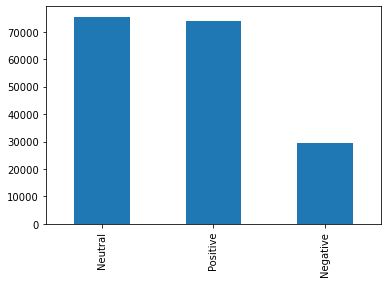

In [62]:
df['sentiment'].value_counts().plot(kind='bar')

<AxesSubplot:xlabel='sentiment', ylabel='count'>

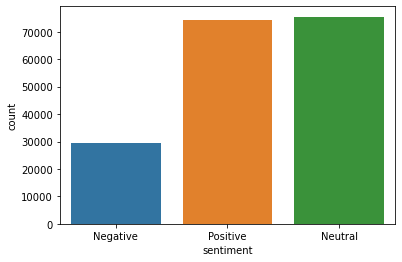

In [63]:
# Plot with seaborn
sns.countplot(df['sentiment'])

In [70]:
### Keyword Extraction
+ For Positive and Negative Sentiment
+  General

SyntaxError: invalid syntax (<ipython-input-70-fb86073ddf45>, line 2)

In [71]:
positive_tweet = df[df['sentiment'] == 'Positive']['clean_tweet']

In [72]:
neutral_tweet = df[df['sentiment'] == 'Neutral']['clean_tweet']
negative_tweet = df[df['sentiment'] == 'Negative']['clean_tweet']

In [73]:


positive_tweet



1         Hey and  wouldnt it have made more sense to ha...
6         How Will Change Work in General (and recruitin...
8                 Praying for good health and recovery of  
12        👋🏻 — no one will be safe from until everyone i...
13        Lets all protect ourselves from Its real and t...
                                ...                        
179096    We were really bummed we couldn’t cop one of t...
179103    Thanks for nominating me for the challenge I n...
179104                       2020 The year of insanity Lol 
179105     A powerful painting by Juan Lucena Its a trib...
179106    More than 1200 students test positive for at m...
Name: clean_tweet, Length: 74154, dtype: object

In [74]:
# Remove Stopwords and Convert to Tokens
positive_tweet_list = positive_tweet.apply(nfx.remove_stopwords).tolist()

In [75]:
negative_tweet_list = negative_tweet.apply(nfx.remove_stopwords).tolist()
neutral_tweet_list = neutral_tweet.apply(nfx.remove_stopwords).tolist()

In [76]:


positive_tweet_list



['Hey wouldnt sense players pay respects A…',
 'Change Work General (and recruiting specifically) via/',
 'Praying good health recovery',
 '👋🏻 — safe safe commit ensure…',
 'Lets protect real numbers climbing fast Continent Lets n…',
 'Second wave Flandersback',
 'COVID Update: infection rate Florida following natural curve experts predicted initial cu…',
 'Good Patriots Volunteer Election Judge Polls open without…',
 'comprehensive review amp Analysis: key ways WASH help reduce transmission…',
 'crosses 2 lakh mark 150055 ppp recovered far positive today 6988/total…',
 'Actor father MrGKReddy tested positive 15/20 days s…',
 'safe place visit guests said hotel meticulous applying hand sanitation als…',
 'CEO live WSU talking “The effects Covid19 students”…',
 'Actionables healthy recovery',
 'understood hadnt missed meeting In…',
 'released new podcast episodes week: Technology Platforms Conduct Telehealth Visits C…',
 'reports 1142 positive cases 29 deaths Saturday Death toll rises 3

# TOKENIZATION

In [77]:
for line in positive_tweet_list:
#     print(line)
    for token in line.split():
        print(token)

Hey
wouldnt
sense
players
pay
respects
A…
Change
Work
General
(and
recruiting
specifically)
via/
Praying
good
health
recovery
👋🏻
—
safe
safe
commit
ensure…
Lets
protect
real
numbers
climbing
fast
Continent
Lets
n…
Second
wave
Flandersback
COVID
Update:
infection
rate
Florida
following
natural
curve
experts
predicted
initial
cu…
Good
Patriots
Volunteer
Election
Judge
Polls
open
without…
comprehensive
review
amp
Analysis:
key
ways
WASH
help
reduce
transmission…
crosses
2
lakh
mark
150055
ppp
recovered
far
positive
today
6988/total…
Actor
father
MrGKReddy
tested
positive
15/20
days
s…
safe
place
visit
guests
said
hotel
meticulous
applying
hand
sanitation
als…
CEO
live
WSU
talking
“The
effects
Covid19
students”…
Actionables
healthy
recovery
understood
hadnt
missed
meeting
In…
released
new
podcast
episodes
week:
Technology
Platforms
Conduct
Telehealth
Visits
C…
reports
1142
positive
cases
29
deaths
Saturday
Death
toll
rises
3806
reports
ANI
quot…
Venezuelas
Economy/Budget
tied
Oil
like
Loui

ha…
Dogs
sniff
saliva
1000
people
healthy
infected
youre
going
let
denial
old
man
run
country
fing
ground
hope
vet…
Surprised
need
thought
virus
disappeari…
14
day%
New
Cases
Florida
648%
growth
new
cases
14
days
Texas
545%
growth
new
cases
14…
Properly
stated:
Ladies
gentlemen
live
clown
planet
Tata
New
preprint:
Country
distancing
reveals
effectiveness
travel
restrictions
COVID19
According
data
Pakistan
successfully
flattened
curve
81%
Coronavirus
patients
hav…
New
preprint:
Anxiety
perceived
risk
COVID19
outbreak
Bangladesh
records
38
new
COVID19
deaths
Yesterday
conference
met
referees
gave
plan
safe
spec…
New
Study
Highlights
Impact
Pandemic
Families’
Mental
Health
–
NBC
Chicago
New
preprint:
analysis
mortality
Ontario
cremation
data:
Rise
cremations
COVI…
Nearly
16
crore
samples
tested
India
far
country
registered
13
lakh
positive
c…
Canadian
driver
stop
locations
tested
free
New
preprint:
Epidemiological
cohort
study
finds
association
COVID19
GuillainBarre
sy…
Evidence
airborne


going
straight
Orkney
t…
experience
March
bothered
look
like
the…
party
going
man
like
medical
colleagues
hero
Exactly
Kate
difficult
concept
board
suffer
with…
HEY
Shut
start
right
~
precisely
supposed
buy
facemask
let
shop
buy
facemask…
cant
believe
photos
real
school
😱
look
cut
scifi
film
a…
Tokyo
reports
260
cases
day
record
high
※7/24/2020
2020
look
like
pull
bankjob
straight
clown
Selling
babies
R200
colours
available
DM
information
Durban
based
thought
Lets
reduce
social
distancing
1metre
youre
lucky
Light
blue
touch
paper
a…
ALERT:
Newsom
economic
task
force
starstudded
cast
cant
solve
reopening
Global
Pandemic
News
|…
Australia
welcomes
Vietnams
ban
wildlife
imports
markets
amid
new
health
fears
nails
coffin
need
randomized
study
looking
question
publish…
district
reports
1000+
positive
cases
24
hours
1204
positive
ca…
Meet
heroes
Elizabeth
head
childrens
nursing
Barnet
Royal
Free
Hosp…
Despite
differences
we’re
way
beat
🇵🇰
amp
played
great
role
combating…
mild
obesity
raises


clean
hands
help
aerosols
aren’t
discussing
ocular
transmission
Pink
eye
isn’t
novel…
Vert
good
interview
Denise
Brown
DSRSG
MarcAndre
Franche
new
ways
of…
Major
Ruling
Freedom…
“The
outbreak
meant
access
essential
Read
how…
Tales:
Temporary
Quarantine
Longterm
Segregation
|
Seriously
Sensitive
Pollution
healthy
coping
isolation:
Stay
contact
family
amp
friends
reach
regularly
those…
control
risk
infection:
▶️
safe
distance
▶️
Wash
hands
moment
home…
lies
preventable
deaths
UK
citizens
criminal
negligence
…
urgent
need
global
stakeholders
cooperate
simultaneously
managing
direct
consequences
of…
humanitarian
services
crucial
lifeline
amp
means
access
food
amp
health
Dag…
148
new
cases
Switzerland
[12:19
GMT]
patients
tested
positive
died
Saturday
deaths
death
to…
73400
New
Cases
Nearing
SingleDay
Record
73400
New
Cases
Nearing
SingleDay
Record
73400
New
Cases
Nearing
SingleDay
Record
Production
Disposable
Nitrile
Gloves
Demanding
Profitable
Business
Ideas
Saturday
July
25:
Latest
devel

allowing
propaganda
credible
person
challenging
Johnsons
dissembling
w…
Update
day
➡️
1021
New
cases
reported
far
24th
July
1782
cases
23r…
Filmmaker
elite
marathon
runner
Alexi
Pappas
wants
sure
‘the
complete
person
happening’…
adopted
exact
policy
hope
itll
away
w…
Despite
Amazon
getting
precise
Prime
deliveries
forecasts
time
man
way
power
shadowy
unelected
puppet
master
hes
good
hes
at…
article
focuses
specifics
it’s
relevant
countries
important
read…
People
discounting
impacting
young
need
start
paying
attention
China
Uses
Inquiry
Tout
Coronavirus
Response
READ
MORE:
Tammy
Ceann
Children’s
Division
Hannibal
Got
quick
dropping…
Amit
said
hair
stylists
paid
ventures
finally
got
the…
14
new
cases
Uganda
[11:46
GMT]
India
conducted
420
lakh
tests
day
highest
far
tests
million
rises
11485:
Health
Ministry
decision
influence
left
meeting
directly
council
deci…
Cultural
institutions
Boston
continue
scramble
money
reopen
via…
recovery
weeks
young
adults:
study
CM
expressed
happiness
encou

situation😜😜😜
BTW
better
proposition
induction
mean
th…
undiluted
perfume
oil
long
body
directly
dubai
6ml
N1200
12ml
N2500
Chat
call…
special
shoutout
instructor
welding
fabrication
Mr
Kyesman
Bigwan
amazing
imp…
RealTime
Charts
Signs
Economic
Recovery
Faltering
MOPH
announced
398
new
COVID19
cases
330
recoveries
active
cases
Qatar
fell
3122
nu…
cm
test
positive
man
blamed
Introducing
Hafeles
Stay
Healthy
Compact
FloorStanding
Sanitising
Station
Wipe
Dispenser
B…
bold
journalist
asked
getting
high
numbers
stopped
mass
Highest
Scores
290/300
TAP
Spelling
Bee
(Written)
Mubi
1
Primary
School
coronavirus
cases
peak
It’s
getting
harder
experts
predict
READ
MORE:
Lets
help
best
fragrance
completes
dressing
makes
stand
makes
head
turn…
interesting
read
pandemic
affected
patterns
protests
political
violence
conf…
Here’s
irrefutable
evidence
government
completely
lost:
masks
mandatory
24/07
a…
Watch
episode
sixteenth
week
initiative
live
Instagram
channel
with…
cop
masturbates
women
NEW
COUNTRY

water
touching
surfaces
critical
protecting
o…
CPT
members
find
latest
member
bulletins
operational
updates
CPT
statements
resources
page
Gartner
says
worldwide
spending
decline
73%
2020
Read
interested
role
🇨🇳
amid
the…
know
people
worried
parents
amp
relatives
suffer
crisis…
📢
|
Episode
5
podcasts
live
focuses
physical
activity
walkin…
supporting
15000
families
hit
pandemic
hard
reach
areas
i…
Significant
uncertainty
surrounds
“new
normal”
look
like
firms
crisis
parti…
Starting
BRAVE
CF
36
Romania
strongest
Covid19
policies
safety
precautions
ready…
Family
gay
officer
died
COVID19
denied
insurance
benefits
doesnt
need
capitalism
killer
today’s
shoot
home
Ekdum
‘good
boy’
look
“It
mixing
humanities
writ
large
practical
artisanal
skills—and
society
ready
use
them—that
F…
MR
PRESIDENT
…
biggest
indicators
complications
—
age
—
general
term
us…
Proud
supporting
campaign
pandemic
helping
k…
High
risk
Starr
County
model
country
containing
masks
stayathom…
Ex
Barca
player
current
coach
test

unequal
Scotland’s
labour
market
impact
o…
shift
agile
responsive
resilient
begins
keeping
employees
informed
motiv…
great
opportunity
recovery
🙌Your
safety
hands
literally
➡️Visit
stay…
India
favorable
investment
destination
magazine
takes
deep
look
i…
running
Thursday
30th
July
700PM
Live
Streaming
Facebook
page…
Forced
Labor
worlds
surgical
glove
maker
Dru
happy
work
amid
coronavirus
Major
breakthrough
Covid19
drug
makes
UK
professors
millionaires
wonder
girls
got
braces
didnt
need
gottem
look
cute
right
now…
positive
coming
truth
government
approaches
world
clear
Rich
lists
r…
fascinating
interview
Paul
Reid
HSE
now…
huge
movement
Whats
evidence
sad
deaths
with/from
mind
the…
tried
early
convert
obscure
statistics
widerpublic
friendly
re…
🦠
New
COVID19
cases:
20
Total
cases:
3757
New
deaths:
0
Total
deaths:
118
Active
cases:
380
Hosp…
Update
newly
detected
amp
cured
cases
24
hrs
BMC
area
25th
July
2020(till
9am)…
kid
know
traitor
Trump
cheated…
Israel’s
court
rejects
petition
deman

2020
tourism
facing
unprecedented
challenges
caused
predicted
78%
decline
compared
2…
government
governed
sinks
deeper
denial
‘
ridiculed
largely
ignored
‘
virus
transmission
easily
blocked
covering
respiratory
areas
suitable
material
know
meets
tested
right
148492
Deaths
WATCH‼️‼️
31/2
years
able
define
reality…
Highly
recommend
book
Ground
breaking
research
empathetic
reading
story
Spanis…
lost
jobs
start
lost
hope
depressed
had…
80%
cases
changes
chemosensation
loss
amp
best
predictor
of…
USJobless
Claims
Rise
Housing
Market
Rebounding
Initial
jobless
claims
rose
14
million
we…
Loss
smell
earliest
commonly
reported
symptoms
new
study
ide…
happy’s
aura
everyday
Total
Look
NIKE
Wait
training
client
Huge
implications
“In
contrast
90%
outpatients
influe…
PTINews:
Arunachal
Pradeshs
tally
crosses
1000
mark
65
new
cases
active
cases
661:
Health
Dept
dark
circumstances
positive
effect
upping
willingness
seriousl…
Weekend
started
early
Hospital
quarantine
facilities
fast
reaching
capacity
B

reported
24
hours
Info
Ministry
He…
Things
slipping
little
people’s
minds
seeing
normality
letting…
reducing
obesity
frankly
doesnt
care
People…
Tiger
Force
wins
appreciation
International
level:
Report
Cuz
nearly
80K
new
cases
day
nearly
150K
dead
Americans
(and
counting)
millions
of…
Feast
St
James
July
25
witness
faith
Jesus
thousands
Camino
de
Santiag…
nearing
80k
cases
😢
Let
continue
vigilant
maintain
social
distancing
wash
hands
regularly
w…
DONT
FOOTBALL
FAN
BENEFIT
GREAT
OPPORTUNITY
YOU…
DUTY
WWII
|
MONTAGE
|
COD
PLAYS
check
use
face
shields
masks
increase
cases
COVID19
TRUE
✔
explains
how…
Hey
America
ready
cases
deaths
Thanks
to…
Arunachal
Pradeshs
tally
crosses
1000
mark
65
new
cases
active
cases
661:
Health
Dept
New
personal
view
⁦
Need
sustainable
biobanking
networks
diseases
o…
Madhya
Pradesh
CM
Shivraj
Singh
Chouhan
says
tested
positive
LIVE
BLOG:
Humanizing
hotel
brands
COVID19
encourage
tourists
return
via…
😷This
summer
leave
healthy
come
healthy
won’t
tanned
sick
bed


girls
Afghanistan
built
ventilator
old
car
parts
help
country’s
fight
a…
Inaugurated
Covid
Kiosk
Automatic
Vending
Machine
Patna
JN
railway
station
passengers
trave…
away
week
long
break
Freeview
TV
Ive
watched
BBC
Sky
years
standard…
1106
new
cases
19
new
deaths
Ukraine
[8:55
GMT]
Madhya
Pradesh
Chief
Minister
Shivraj
Singh
Chouhan
tests
positive
COVID19
goes
quarantine
Mumbai:
18
cops
including
senior
inspector
Naya
Nagar
police
station
Mira
Road
test
positive
don’t
forget
Boris
initially
told
70
risk
‘most
r…
“The
shock
necessitates
significant
extension
time
horizon
fiscal
policy”
says
Heikki
Oksane…
PTINews:
139
new
cases
tally
2654
active
cases
1055
toll
rises
38
3
deat…
Pure
Computer
generated
hands
maya
PTINews:
Madhya
Pradesh
CM
Shivraj
Singh
Chouhan
says
tested
positive
PTINews:
CM
Uddhav
Thackeray
says
favour
complete
lifting
Maharashtra
says
there…
offer
selfpaced
COVID19
contact
tracing
course
absolutely
FREE
opportunit…
Funny
cretins
masks
started
piping
theyve
mute
month

tests
administered
thousand
Australians
Hopefully
th…
Slept
20
hours
yesterday
Im
wide
awake
thinking
valued
community
information
stay
tuned
Visit
🔵
German
airports
offer
free
COVID19
tests
returning
holidaymakers
Hello
friends
colleagues
happy
share
new
paper
impact
pandemic
market…
major
grand
tours
rescheduled
canceled
times
it’s
reliving
know
that…
talks
good
It’s
result
obesity
amp
resulting
experience
As…
Couldnt
agree
early
pandemic
federal
government
added
$600
weekly
unemployment
checks
states
se…
prevent
overwhelming
shielding
vulnerable
individuals
implemented
ri…
important
work
Independent
SAGE
ignored
others…
kind
–
easy
free
–
use
little
kindness
especially
challenging
times…
Shivraaj
singh
chauhan
effected
corona
test
report
positive
pray
shivraaj
ji
t…
classy
belief
amp
takes
real
beating
heart
sport
practitioners
says…
Vipers
offseason
report
general
manager
head
coach
Jason
McKee
👤
|
Brieann
Knorr
(
📰
|…
I’m
fan
government
know
they’ve
long
time
right
credit
cr…
Unio

contributions
It’s
funny
break
social
distancing
rules
way
people
shit
New
COVID19
Data
20200725
03:31:01
EDT
positive
time
areas
life
begin
reopen
MP
Chief
Minister
Shivraj
Singh
Chouhan
tests
COVID19
positive
Madhya
Pradesh
Chie…
Public
Health
Emergency
Operation
Centre
live
24/7
mobile
team
guard
responding
health…
lot
support
available
government
businesses
struggling
coronaviru…
Good
morning
support
Longrich
business
sponsoring
5
interested
people…
Researchers
identify
predisposes
elderly
patients
severe
Inviting
current
relevant
scop…
Colorado
teacher
shares
emotional
warning
socially
distanced
learning
👈
click
li…
Wishing
safe
happy
🙏🏻🐈
Presence
Genetic
Variants
Young
Men
Severe
|
Allergy
Clinical
Immunology
|
JAMA
|
JAMA
N…
Shivraj
Singh
Chouhan
Madhya
Pradesh
Chief
Minister
Tests
Positive
COVID19
Excellent
job
team
Gym
protocol
nice
safe
cleaning
point…
Focus
bright
New
TShirt
Prints
available
book
soon
Sink
swim:
challenger
brand
mentality
keeping
afloat
Read
F…
Patient
318
🤗

new
deaths
5
days
Daily
New
Deaths
Worldwide
Multiple
Gaussians
Extrapolation
thank
great
leadership
allowed
meaningful
dialogue
clea…
Madhya
Pradesh
chief
minister
tests
positive
Nasdaq:
Nasdaq
smoothly
transition
remote
workforce
Nasdaq’s
Brenda
Hoffman
discusses
importanc…
cool
album
Boomplay
Disinfect
clinic
office
schools
homes
commercial
properties
vehicle
shops
safe
pa…
Nasdaq:
future
businesses
succeed
need
pay
attention
ground
workers
mcuban
shares
learni…
Canada
stands
best
performers
category
handling
wave
coronavirus
patients
feel
symptoms
weeks
CDC
says
👈
click
li…
Live
–
joins
discuss
latest
developments
return
to…
chances
risks
facing
current
economic
crisis
Dean
Baker
Thoughts…
|
Madhya
Pradesh
CM
Tests
COVID19
Positive
Children
hugely
affected
prevailing
pandemic
Online
school
module
include
Massaging
ones
egos
art
form
practiced
sanctimonious
selfrighteous
elitist
liberals
(“luxury
communis…
July
23
update:
6472
new
cases
reported
Tamil
Nadu
today
highest
Chennai
case

Indias
COVID19
vaccine
trial
Good
Morning
gym
buddies
Remember
train
safe
💪🏾
Good
news
good
work
youre
responsible
responsible
t…
39
new
cases
detected
24
hours
Total
positive
cases:
353
Recovered:
213
Total
Activ…
Good
raising
Dáil
Children/young
adults
disabilities
most…
15
crore
Covid19
samples
tested
far:
Govt
24
hours
352801
samples
tested
for…
he’s
moron
Tighter
mask
rules
tests
warns
Europe
spike
Singleday
spike
48916
positive
cases
amp
757
deaths
India
24
hours
Total
positive
cas…
China
new
level👍
China
spawned
twodozen
billionaires
118
new
listings
booming
ind…
Official
Low
Bastard
gone
far
Condemnable
Action
amp
Shamef…
Uganda
imports
clothes
second
hand
clothes
China
number
challenges
t…
Prime
Minister
announces
new
Cabinet
—
livetweeting
thread
team
lead
Sin…
reports
recorded
1000
deaths
fourth
straight
day…
Maharashtra
Police
reports
total
positive
cases
Maharashtra
Police
stand
8232
including
1825
activ…
Info
Graphic
Zone
wise
growth
rate
new
cases
Namaste
🙏
Rakhi
corner


update:
Mouth
lesions
found
new
warning
sign
COVID19
|
FreeFlix
wishes
dashing
Happy
Birthday
surprised
hear
logic
condu…
💠
POLICE
UPDATE:
⏩Total
positive:
8232
⏩Total
discharges:
6314
⏩Total
deaths:
93…
10
patients
die
Covid
death
toll
rises
130
1320
test
positive
total
posit…
Regret
inform
demise
2
positive
patients
district
1
60year
old
female
who…
Know
FSWP
popular
stream
WhatsApp
Nearly
49000
fresh
Covid19
India’s
tally
1336
lakh
death
toll
31358
Statewise
details
Total
Confirmed
cases
(till
25
July
2020
8
AM)
➡️States
w…
best
look
less🌸
home
workplace
public
place
adequate
measures
surroundings
safe
for…
perfect
option
stay
Indira
Gandhi
International
Airport
Transit
Inside
Delhi…
Young
Canadian
filmmakers
extraordinary
short
life
quarantine
Better
stay
home
end
Don’t
know
situation
cases
rising
like
this…
Instagram
Social
Media
Growth|Marketing
Agency
Sevices
wise
learn
nature
adapt
human
thoughts
attitudes
relationships
integra…
557
new
positive
cases
6
deaths
reported
Rajastha

ABC
News
https:
Portfolio
Expands
280%
Q2
2020
Amid
Pandemic
institutions
struggled
r…
trying
support
cope
grieving
death
beloved
congr…
Good
morning
government
mismanages
economy
hardest
hit
poor
Easy
blame
fa…
15
crore
samples
tested
far
said
adding
420
lakh
samples
tested
Fr…
UPDATE
•
total
cases
cross
13lakh
mark
•
Total
positive
cases
stand
1336861
•
456071
ac…
July
24
2020
4PM
Department
Health
reported
2103
new
COVID19
cases
bringing
total
number
c…
Hydroxychloroquine
works
best
treat
cure
virus
conjunction
Azithro…
➡️
right
answer
➡️
Rs
5
Lakh
➡️
Thank
participation
10
die
death
toll
rises
130
LMAO
WAKE
Pencil
Ick
wonder
pay
Sex
wonder
Pussy…
joke
infectious
laugh
true
wonder
high
number
covid
patients
visionary
leaders…
need
net
worth
republican
wants
cut
unemployment
they’re
broke
we…
Hopefully
recovers
reflects
errors
strong
voice
fi…
New
look
Dre
Spray
premium
hand
sanitizer
Stay
Clean
Streets
Available
at…
good
day
connoisseursbarberclub
think
OK
gave
trim
for…
Decided
eas

tally
soars
1336861
48916
fresh
cases
death
toll
31358
Continue
social
distancing
wearing
washing
hands
frequently
help
protect
and…
“Were
concerned
longrange
implications
going
care
chronic
health…
gov
wants
stop
preventive
kit
American
lot
cheaper
t…
1320
fresh
cases
local
contacts433
174
Odisha
Saturday
reported
1320
new
COVID19
cases
taking
total
tally
state
24013
downtown
Wellington
NZ
right
People
walking
masks
need
going
completely
forget
came
got
shut
told
be…
new
guidelines
announced
Chief
Minister
Singh
patients
violating
hom…
LIVE
BLOG:
Travelers
cautious
virus
Japan
fourday
weekend
starts
better
loose
money
instead
life
People
like
dont
feel
p…
July
24
2020
New
Case
Confirmed
Fourteen
Cases
Discharged
Kwara
State…
“Florida
virus
deaths
hit
new
high”
continues
Nearly
1000
new
cases
confirmed
July
24
2020
972
cases
confirmed
to…
🔵
COVID19
Update:
New
Symptom
Test
Guide
Steroid
Treatment
coronavirus
stories
ne…
strictly
social
distanced
shops
use
public
transport
went
outside


Total
positive
cas…
|
10
developments
morning
Singleday
spike
48916
positive
cases
amp
757
deaths
India
24
ho…
Im
tired
2
weeks
turning
weeks
studies
placing
the…
strong
making
changes
lifestyle
amp
diet
suggestions
wont
prevent…
quarantine
sudden
got
feeling
HAPPY
HAPPY
HAPPY
HAPPY
HAPPY
😊
📺
🔊
Thread
nation
forward
fighting
(or
taking
important
issues)
ex…
“cells
line
nose
significantly
likely
infected
shed
virus
compared
throat
o…
Estimation
percentage
positive
cases
lead
death
world
Fascinating
roller
coaster
ride
Singleday
spike
48916
positive
cases
amp
757
deaths
India
24
hours
Total
positive
cas…
352
new
cases
5
new
deaths
Belgium
[5:19
GMT]
reports
5493
new
cases
105
new
deaths
total
153520
cases
2807
deaths
Cabinet
Secretary
reviews
management
States
high
active
case
load
Union
Govt
advise…
latest
Fowlers
Final
Word
Masks
family
ready
bike
ride
(not
wear
ride
itself)
Defini…
ELPL
moving
forward
reopening
library
excited
announce
P…
reports
singleday
spike
48916
positive
cases
a

b…
talked
staying
online
teachers
ready
class
instruction
soon…
123
new
cases
(REVISED
total:
2373)
1
new
DEATH
(REVISED
total:
16):
hashtag
(July
25
2020
11:00
HKT)
golfing
New
Jersey
Americans
die
8
minutes
Fl…
direct
link
podcast
discussing
return
Social
distancing
Quarantine
Flatten
curve
READ
(not
paywalled)
Job
Guarantee
better
cheaper
option
reset
Australian
economy
from…
Ep
184
Remote
Learning
Looms
Large
amp
discuss
fans
action
notch
Chris
Taylor
collides
baseman
Pablo
Sandoval
a…
Crickets
barely
level
2
EME…
882
followers
OK
going
post
TREATMENT
PREVENTION
10k
new
follow…
“Teachers
strong
resilient
amp
creative
situation
don’t
think
‘Donors
Choose’
wa…
regular
schools
closed
Strict
measures
better
nonmeasures…
losing
beautiful
people
feel
like
Maureen
friends
busy
dr…
County
reported
490
new
cases
Friday
7%
6974
tests
coming
positive
12
mor…
studies
kids
actually
stoppers
disease
don’t
and…
Saint
Simons
Island
southeast
coast
Georgia
jam
packed
people/tourist
crowds
tonight
O

Victoria
5
deaths
July
24
2020:
Coronavirus
Live
Infections
Deaths
Updates
Total…
Population
divided
number
deaths
appropriate
assessment
risk
kind
statement
is…
New
stimulus
package
coming
Monday
including
second
stimulus
checks
Like
living
real
nightmare
dad
hospital
talks
week
todaybe
sure
tune
Stampede
cancelled
time
102
year
history
promised
better
healthcare
option
4
y…
affected
aspects
lives
including
training
sure
complete
followin…
Nearly
150K
people
dead
4M
infected
double
digit
poll
deficits
got
Trump
take…
True
obvious
February:
credible
source
in…
Interesting
⁦
suggesting
origin
bats
conferre…
COVID
demises
recorded
Ghana
deaths
691
new
cases
surge
tally
Ghana…
advanced
week
New
schedule
Sep
19
Nov
8
51day
window
allow
60
mat…
American
inadequate
response
related
leadership’s
right
wing
ideology
“Small”
this…
friend
great
going
ER
fighting
Covid19
th…
reminder
amazing
community
patients
learn
gain
support
helped
m…
July
24
2020
9:33
PM
EDT
Realtime
mapping
(2019nCoV)
Globa

passing
game
good
know
America
isnt
leading
cases
saddening
numbers
worldwide
vas…
10
Presidential
communications
office
personnel
positive
Andanar
24hour
Update
Ending
7/24/2020
9
pm
USA
32
50
states
(64%
COUNTRY))
gt400
new
ca…
lives
Risking
lives
children
families
week
9
year
old
girl
died
f…
doesnt
send
strong
message
address
severity
ad
weak
out…
20s
want
virus
thing
It’s
Wise
friends
have…
beautiful
Friday
surreal
looking
times
pregnant
anytime
stressful
coronavirus
pandemic
5
tips
momsto…
Indians
Ordered
Lockdown
Theres
says
cant
family
members
Protect
people
love
limit
lar…
Cool
articles
putative
mechanism
Nonneuronal
expression
SARSCoV2
entry
genes
olfaory
s…
decent
thing
Resign
leadership
running
ditch…
world
record
new
cases
289028
24/7/20
Staying
Healthy
Stuck
Home
(
)
virus
spots
societal
inequalities
blows
tenfold
tells
weaknes…
24hour
Update
Ending
7/24/2020
9
pm
USA
17
states
(34%
country)with
gt1000
new
cases
the…
saw
headline
July
24th
2020
listened
pretty
carefully
b

new
site
active
commu…
“I’m
Fighting
Love”
💕a
little
snippet
wrote
music
Sheep
spend
life
fearing
wolf
eaten
shepherd
explain
student
test
positive
CoViD
19
come
school
24
hours
l…
Genevieve
Martinez
62yo
School
Nurse
Barron
Elementary
El
Paso
Texas
died
7/22
woman…
study
shows
huge
benefit
high
dose
steroids
cytokines
storm
(⬆️CRP
⬆️ddimer
⬆️ferri…
Hey
thanks
performing
Wednesdays
rally
absolutely
performed…
Ive
interviewed
number
epidemiologists
w…
you’ve
lived
major
earthquakes
you’re
mentally
prepared
EARTHQUAKES
actuall…
love
tell
truth
Coronavirus
update
San
Antonio
July
22:
City
releases
new
COVID19
hospitalization
projection
model
READ
MORE:…
wish
ill
child
interesting
sends
son
protest…
Sresakthimayeil
Institute
Nursing
proudly
hosts
Series
17
…
Standardized
data
collection
critical
improve
health
outcomes
particularly
faced
pandemic
as…
woman
tests
positive
attending
funeral
undertakes…
Hey
thanks
speaking
Wednesdays
rally
absolutely
proud…
10
new
cases
Jamaica
[2:17
GMT]
Sou

ads
2/3
total
ad
industry
spending…
goal
current
admission
sure
we’ve
done…
Dr
Birx
says
looking
3
New
Yorks
(TX
FL)
White
House
have…
problem
w/projection:
people
wise
pathology
boomerang
throw
op…
bullshit
(I’m
Donald
J
Trump
approve
message)
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
love
Download
app
listen
on…
NEED
DONATIONS
currently
low
stock
menstrual
products
period
care
kits
high
demand
b/…
Today
Check
ideas
⬇️
staying
busy
healthy
connected
today
eve…
think
we’re
going
need
caskets
better
drink
place
stay
away
bars
enjoy
new
Taylor
Swift
album
mask
mandate
good
thing
prefer
punishment
week
work
requirement
paper
outlines
Orchitis
caused
original
SARS
coronavirus
virus
basically…
segment
emotional
dual
reminder
love
Vince
necessity…
allowed
houses
worship
comtaminated
tearing
defense
a…
Representing
immunocompromised
Keeping
safe
New
masks
arrived
today
fun
Feminist
AF
(and
fun)
Great
summary
latest
Thank
Way
people
comply
wearing
mask
acknowledged
people
suffering
f…
Recent

busy
healthy
connected
today
ever…
line
“call
friend
hold
closer”
mood
song
starting
to…
girl
hs
mt
FB
said
like
Im
stealing
posting
Funny
schools
cant
pp…
24
July
2020
CoVid19
Québec
Update
Quebec
reported
163
new
cases
COVID19
an…
responsible
surge
stops
children
heading
school
responsible
t…
fantastic
setlist
song
dedications
Thank
E
Street
Nation
listening
great
w…
United
States
hit
150000
confirmed
deaths
weekend
Absolutely
important
point
focused
getting
vaccine
havent
thought
about…
going
interesting
Georgia
Gov
suing
way
TRANSLATED
RESOURCES
|
know
English
isn’t
language
created
a…
nation
continues
reopen
parts
experiencing
new
surges
cases
Experts…
new
cases
Interior
officials
report
27
new
cases
today
new
outbreak
Haida…
amp
Challenges
Associated
Rapidly
Onboarding
New
Preparation
Crisis
|
FYI:
THOUSANDS
grandparents
provide
FREE
grandchildren
b/c…
OPINION
mask
works
best
researchers
filmed
people
coughing
sneezing
different
scena…
Staffer
congressman
dies
nearly
400000
confi

contact
trac…
RIP
Phil
Westfall
frequent
guest
mentor
2018
amp
dad
(member
our…
National
Geographic
photographer
George
Steinmetz
photographed
mass
burials
Hart
Island
New
York…
Follow
Appropriate
Behaviours
prevent
spread
Savitribai
Phule
Women’s
Empowerment
Centre
Utkarsh
making
designer
super
efficient
comfort…
Governments
extended
free
water
relief
July
August
September
1492
new
cases
67
new
deaths
Indonesia
[10:16
GMT]
socalled
professor
spred
disinformation
13
year
old
niece
died
of…
contrary
hitting
harder
rich
an…
religion
youre
bible
wrote
new
chapter
I…
Real
Awesome
gesture
lucky
know
travelling
Barcelona
evening
wed
gone
minute
ma…
reported
128
new
cases
Sunday
marking
fifth
consecutive
day
reporting
100
n…
1075
new
cases
detected
Saturday
Delhi
1807
recovered
virus
21
fatalities
11K
plus…
Dont
want
wear
face
mask
sure
know
size
endotracheal
tube
youll
need…
impact
set
wipe
years
income
gains
subSaharan
Africa
Real
capita
GDP
in…
Death
Reported
74YearOld
Man
Succumbs
Disease

talk
things
matter
th…
Power
people
💫
Thank
Baker(s)
BEST
COME
[re:
MSM]
facts…
they’re
rationing
healthcare
high
numbers
amp
pounding
TX…
3676
new
cases
32
new
deaths
India
[9:38
GMT]
claims
3
lives
Jammu
amp
Kashmir
Death
toll
reaches
311
Prime
Minister
launch
High
Throughput
testing
facilities
27
July…
Misfortune
seldom
comes
Stay
strong
fellow
human
beings
affected
PHILIPPINES
UPDATE
•HELLO
UNREPORTED
RECOVERIES
WAITING
OKAY
HAHAHA
4TH
STRAIGHT
TIME…
Australia
entered
crisis
position
economic
strengthexcept
e…
UK
government
mishandled
crisis
notably
slow
act
bemused
crit…
distinct
types
COVID19
identified
Analysis
data
COVID
Symptom
Study
app
led
researchers
f…
54
die
2275
new
cases
24hrs
Congratson
happy
day
declare
PURUSHARTHAM
fundamental
aim
life
Ind…
letting
events
like
Indie
Beach
St
Tropez
happen
willing
risk
pu…
8
confirmed
cases
35
active
cases
isolation
facility
POM
current…
WW2
German
V2
rockets
Peenemunde
effective
weapons
psychological
terror
destruct…
wake
watch
news


COVID19
26
July
2020
👌
Confirmed
total
3291
cases
(9
new
cases)
Ad…
way
God
sees
careful
kind
mirror
look
person
holds
m…
editing
wedding
looking
forward
amazing
weddings
we’re
booked
year
b…
latest
batch
2246
homebound
OFWs
tested
negative
took
rides
respect…
Adhering
government
prescribed
timings
maweshi
mandis
important
Let’s
help
ensure
work
toget…
Health
authorities
reported
691
new
cases
Saturday
bringing
total
number
known…
26
July
1385522
Total
cases
48661
new
cases
24
hrs
705
deaths
24
hrs…
government
governed
sinks
deeper
denial
‘
ridiculed
largely
ignored
‘
Imagine
huge
numbers
people
survived
diagnosis
amp
the…
|
pay
cost
hospitalization…
Singleday
spike
48661
positive
cases
amp
705
deaths
India
24
hours
Total
positive
case…
25
jawans
19th
Battalion
tested
positive
days
July
23
7
te…
new
upcoming
“The
Economic
Consequences
Pandemic”…
think
article
good
focus
scientific
facts
1)
Durchseuchung
an…
federal
health
ministry
reported
Sunday
morning
705
deaths
48661
cases
pa…
mean

total
6
655
312
new
deaths
bring
total
6
655
●
NEWS
●
☞
Love
Death
Revolution
time
312
new
deaths
bring
total
6
655
312
new
deaths
bring
total
6
655
312
new
deaths
bring
total
6
655
New
Caledonia
active
cases
novel
coronavirus
disease/COVID19
312
new
deaths
bring
total
6
655
312
new
deaths
bring
total
6
655
312
new
deaths
bring
total
6
655
312
new
deaths
bring
total
6
655
312
new
deaths
bring
total
6
655
312
new
deaths
bring
total
6
655
312
new
deaths
bring
total
6
655
Finally
day
gym
loved
😍🥰
spot
🤣💪
keeping
social
distancing
👌…
312
new
deaths
bring
total
6
655
312
new
deaths
bring
total
6
655
312
new
deaths
bring
total
6
655
312
new
deaths
bring
total
6
655
district
reports
5
local
contact
cases
10
new
positive
cases
today
Total
Positive
522
T…
312
new
deaths
bring
total
6
655
|
Odishas
COVID19
case
count
crosses
25000mark
1376
new
infections
toll
rises
140
with…
312
new
deaths
bring
total
6
655
312
new
deaths
bring
total
6
655
312
new
deaths
bring
total
6
655
312
new
deaths
bring
to

active
cases
6471
recoveries
a…
Trial
run
Dronebased
Aerial
sanitization
system
amp
water
mist
systembased
Quick
Response
Mini
Fire
Tender
indi…
Singleday
spike
48661
positive
cases
amp
705
deaths
India
24
hours
Total
positive
case…
toilet
paper
disinfectant
spray
baking
powder
consumer
reactions
COV…
Happy
26
July
Liberian
colleagues
friends
celebrate
important
day
let
remem…
Morning
serfs
OK
putting
pants
guidance
government
like
them…
Lowest
total
confirmed
cases
290
cases
followed
significantly
disrupted
lives
worlds
children
result
pandemic
hav…
toilet
paper
disinfectant
spray
baking
powder
consumer
reactions
COVI…
industry
flies
higher
fuels
demand
remote
services
HT
daily
report:
Worldwide
infections
reached
new
high
160M
250k
new
pas…
816
new
cases
VIC
okay
guys
that’s
unacceptable
Honestly
drawing
board
Stay
home…
UPGRADE
HIGHER
EARNINGS
Fast
Track
Earnings
Lions
Share
🚀🚀🚀
VV
positive
preliminary
results
single
center
experience
including
24
pts
with…
Odisha
Covid19
Report
25t

GMT]
India
Tracker
(As
26
July
2020
08:00
AM)
Confirmed
cases:
1385522
Active
ca…
🇲🇾
constitutes
effective
here:
Covid19
Daily
Statistics
Confirmed
Cases:
4178021
Total
Deaths:
146460
Total
Recoveries:
1279414
New
Conf…
COVID19:
1000
patients
discharged
72
hours
recoveries
near
17000
way
effective
COVID19:
1000
patients
discharged
72
hours
recoveries
near
17000
|
TheCable
journalists
executives
employees
Financial
Express
(
paid
rich
tributes
collea…
Patients
high
blood
pandemic
Germany
si…
Media
Bulletin
status
positive
cases
Telangana
(Dated
26072020)
answer
What’s
fine
breaching
quarantine
tested
for…
Supreme
Court
says
50
people
cant
meet
church
Nevada
Thank
God
Dr
Fauci
good
guys
need
drastic
measures
today
good
read
Thought
Respiratory
Virus
North
Korea
better
response
Boris
Johnson
Hey
Paddy030750
thread
ready
compiled
sure
mention
the…
16
million+
positive
cases
640000+
deaths
99
million+
recovered
/
cured
mode
transmission
respiratory
droplets
masks
effectively
limit
don’t
exp

elite
contact
tracers
stop
spread
construction
projects
slowing
impact
COVID19
team
help
mitigate
risks
Reach…
kids
problems
catching
amp
spreading
8
month
pregnant
lady
found
abandoned
Sakhi
OSC
team
Khammam
handed
Sakhi
Yadadri
B…
Details
10
new
deaths
1
63year
old
male
Gajapati
district
suffering
from…
Happy
pick
morning
(as
mom
amp
2
yo
nep…
payback
looted
Osaka
emerging
new
🔥
🔥spot
Agreed
America
value
education
clean
classrooms
buy
supplies
wa…
LATEST
COVID19
News:
Singapore
Researchers
Discover
Evidence
SARSCoV2
TCell
Immunity
Present
Ge…
Odisha
detects
1376
new
positive
cases
taking
total
number
cases
25389
including
15928
recov…
Odisha
detects
1376
new
positive
cases
taking
total
number
cases
25389
including
15928
recov…
detects
1376
new
positive
cases
taking
total
number
cases
25389
including…
Odishas
case
tally
crosses
25000
mark
@
25389
cases
1376
new
cases
Local
cases:
459
Ganjam
cases…
wear
masks
County:
3
deaths
64
positives
Non
event
Hope
asked
leave
Bunnings😡
right
end

6471
⏩Total
deaths:
93
Josh
Frydenberg
contribution
Coronavirus
crisis
Reduces
support
payments
Tells
people
childr…
believe
lies
grandparents
die
COVID19
twits…
Total
positive
cases
Maharashtra
Police
stand
8483
including
1919
active
cases
6471
recoveries
a…
Morning
⁦
Happy
Sunday
debacle
demonstrates
y…
COVID19
survivor
stories
haunt
years
come
coherent
national
plan
coordination
resources…
✳️
POLICE
UPDATE:
⏩Total
positive:
8483
⏩Total
discharges:
6471
⏩Total
deaths:
93…
TMC
cancels
registration
major
hospital
reports
SecondHighest
Number
Infections
adding
12180
New
cases
bring…
Coronavirus
update:
New
York
Total
test
results:
5516311
411200
tested
positive
5105111
tested…
Coronavirus
update
US:
Total
test
results:
50635683
4158341
tested
positive
46477342
tested
negati…
Todays
chennai
edition
p2
gives
account
major
clusters
widespread
of…
amazing
thinks
info
contained
thought
wonderful
working
data
Mexico
similar
idea
related
It…
reports
48661
fresh
positive
cases
amp
705
deaths
24

1000
day
guy
right
wins
Coronavirus
live
update
Thank
health
care
heroes
Stay
Safe
🙏🏻
interested
7
day
average
confirmed
deaths
1k
pop…
feeling
good
hell
distance
Stay
Safe
🙏🏻
🙄Fauci
deserves
better
sciencedenying
MAGAts
need
private
island
amp
not…
Wash
hands
regularly
Stay
Safe
🙏🏻
2572020
khan
ZMC
labah
sample
251
test
niin
positive
thar
awm
lo
Sample
test
dan:
➡️Aizawl
161
➡️K…
Todays
Triggers
➡One
new
community
setting
outbreak
reported
July
24
business
➡In
past…
Todays
update:
➡San
Diego
County
resident
total
cases
26701
603
yesterday
➡9
addi…
new
study
based
data
symptom
tracker
app
determined
distinct
types
o…
Stay
Safe
🙏🏻
promising
Chinese
vaccine
currently
human
trials
CoronaVac
Beijingb…
new
technology
detect
viral
genomic
RNA
ultralowcost
portable
enclosure
alternative
t…
Supporting
Sir
address
issue
Govt
hiding
facts
numbers
high
time
Great
private
companies
follow
⁦
“VERY
FINE
PEOPLE”
seen
shopping
TODAY
WALMART
MINNES…
reads
choose
Great
pod
myths
new
149398
State
(Source

Notice
ignore
willful
economic
damage
Florida
Evolution
new
cases
country
Evolution
new
deaths
country
Evolution
deaths
confirmed
cases
country
happen
major
companies
requires
vaccinations
continue
working
Evolution
confirmed
cases
country
mother
son
examine
newly
received
birth
certificate
Ghana
face
we’re
comm…
Todays
new
Total
New
COVID19
Data
20200725
11:00:01
pm
EDT
reported
22
new
confirmed
cases
38
new
asymptomatic
COVID19
patients
July
25
[Weekend
Recap]
epic
rivalry
Gojek
amp
Grab
era
pandemic
Southeas…
Western
New
Yorks
largest
commercial
real
estate
firms
dip
like
nearly
business
b…
Online
prayer
meetings
easy
started
GroupCall
prayer
meeting
platform
LIVE:
latest
numbers
coronavirus
Alabama
interactive
map
trying
estimate
extent
New
Zealand’s
economic
losses
crisis
fixing
bo…
Thanks
fruitful
discussion
ways
companies
drive
r…
Isnt
N95
mask
best
doesnt
guarantee
100%
protection
believe
Geo…
Grace
Thank
important
interview
cas…
Hundreds
skilled
👨🏻‍⚕️👩🏼‍⚕️
deployed
🏥
amp
testi

betting
credit
card
customer
service
working
atm
thanks
t…
half
demonstration
events
involved
labor
groups…
Victoria
records
459
new
COVID
cases
10
deaths
horror
weekend
continues
Im
thinking
people
discount
reality
amp
severity
virus
dont
commute
crowded
subw…
Costa
Rica’s
Health
Ministry
reported
record
931
new
cases
11
deaths
Saturday
singleda…
666
new
cases
4
new
deaths
Venezuela
[3:14
GMT]
Skilled
looking
work
remind
Linkedin:…
1000000
(
Friday
1000
deaths
recorded
fourth
day
row
time
happened…
🇨🇦
Thoughts
340
Canada
newly
tested
positive
families
loved
ones
5…
joke
Wear
mask
social
distance
change
clothes
shower
coming
home
w…
case
missed
Special
World
Report
tonight
Friend
Medjugorje
talks
masks
Yes
thats
right…
American
state
record
400000
cases
covid19
Nationally
tally
p…
Trained
dogs
sniffed
Covid19
infections
high
accuracy:
study
That’s
surprising
places
trying
away
cash
method
payment
time…
result
Latest
Updates
Positive:
3332
|
Active:
1663
|
Recovered:
1627
|…
result
Late

recovery
rate
88%
migrants
return
says
CM
aim
efficient
equitable
system
enter
postpandemic
world
country
need
robust
system
army
weapons
safety
uncertain
times
like…
know
E
common
letter
vowel
English
“During
times
people
aware
unexpected
happen
it’s
critical
insuranc…
Buy
Fresh
Meat
🛒
COVID19
PAKISTAN
(UPDATED:
09:28
27
JUL
2020)
SOCIAL
DISTANCING
STOP
Flatten
graph
new
cases
o…
Vietnam
evacuate
80000
people
Da
Nang
local
COVID19
cases
recorded
100
days…
interesting
send
letter
saying
tested
positive
Tune
latest
episode
discuss
parallels
amp
disconn…
32
people
including
ITBP
personnel
tested
positive
Arunachal
Pradesh
taking
no…
good
govts
value
life
money
stock
market
Good
govts
DONT
pandemic
“a
hoax”
(…
Taiwan
Excellence
Launches
Worlds
Portable
Disinfectant
Eliminates
Germs
Tap
Water
Read
here:…
theres
sector
that’s
clearly
beaten
odds
India
edtech
13M
schools
14000
colle…
precautions
needed
amp
good
choices
avoid
contracting
travelers:
ready
quarantine
youre
heading
NY
CT
NJ
Virg

half
2020
Despi…
LIVE
BLOG:
Ryanair
takes
loss
€185M
challenging
quarter
history
vi…
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
love
Download
app
listen
on…
heart
breaks
Melbourne
concerning
spike
cases
recorded
overnight
532
V…
Hope
Worldwide
Storm
video
gt
​
​
​
new
rules
effect
Wednesday
local
television
channels
Cable
TV
TV
said
authorities
w…
Cases
830054
took
123
days
case
of…
26July
perstate
chart
cumulative
deaths
capita
trends
24
52
higher
(worsenin…
Right
America
Approximately
30000
people
month
dying
Drowning
snot
Dont
be…
Important
genetic
discovery
partner
colleagues
in…
claims
hundreds
lives
Focus
good
news
found
vaccine
tracker
(thx
)
Ill
consulting
fre…
*were*
contacting
potentially
exposed
passengers
arent
Effective
March
27th
[airline]…
smile
hug
kind
word
change
trajectory
persons
day
lift
moods
fill
their…
covid
survivor
group
I’m
sad
funny
scary
happy
positive
includes
nurses/doctors
g…
||
8
deaths
amp
1473
new
cases
recorded
today
506
recorded
amp…
Professor
Pete

ways
L…
dont
know
involved
decision
makers
live
kids
dont
have…
Visible
results
Union
Govts
effective
intervention
managing
situ…
household
items
safe
germs
Silver
Stream®
UV
Steri
Box
kills
9999%
germs
like
bacteria
amp
virus
inc…
Karur😍
Dramatic
Skies
Shot
(
Galaxy
M30s
)
wide
angle
great
job😍
Love…
OK
Zimbabwe
closes
Norton
branch
staffer
tests
positive
confirmed
PCR
tests
interes…
🇹🇭
Thailand
situation
update
COVID19
27
July
2020
👌
Confirmed
total
3295
cases
(4
new
cases)
Ad…
sincerely
despise
people
celebrate
wearing
mask
shops
piece
shit
quickly
emerged
number
risk
global
activity
Join
webinar
anime
watching
meme
making
going
rn
Congress
debates
assistance
millions
losing
enhanced
unemployment
benefits
eviction…
Check
new
episode
win
Miami
Vice
Jersey
Loneliness
older
people:
video
calls
help
women
girls
threat
potentially
greater
widespread
preexisting
discrimination
an…
Motor
park
pastors
like
nursery
school
children
reciting
memorized
rhymes
exactly
same…
local
group
stepped
t

relief
district
administration
shares
details
25
new
cases
reported
24
hours
22
are…
beat
needs
access
accurate
reliable
information
Killing
Men
Women
New
Study
Says
20k
new
cases
Andhra
Tamil
Nadu
Karnataka
combined
real
jump
happening
21
existing
drugs
found
effective
$SPY
$QQQ
$DIA
Lots
people
days
stay
safe
willingly
*not*
stay
safe
expose
to…
nice
King
News
LIVE
Updates:
tally
surges
50000
fresh
cases
1435453
death…
virus
echelons
govts
know
worldwide
Dr
V…
APOLOGIES
…
Mitch
Malloy
recent
controversial
show:
“I
apologized
will…
$SAP
SAP
Resilient
Amid
COVID19
Crisis
Sharp
Increase
Operating
Free
Cash
Flow
time
year😞
Hopefully
pandemic
ends
soon
safely
enjoy
nights
like…
nice
King
Join
Aadhan
read
short
news
fingertips
earn
real
cash
Download
App
Now:…
days
history
country
road
100k
covid19
cases
rally
pa
labas
pa
more…
biotech
company
Moderna
launch
human
trials
patients
era
memorable
efforts
Check
latest
update
📌Increase
COVID19
cases
24
hrs:
49594
dist…
SC
hear
Today
Clutch
plea

recover
economically
1500
beds
available
4
govt
hospitals
Delhi:
Health
Ministry
Statewise
details
Total
Confirmed
cases
(till
27
July
2020
8
AM)
➡️States
w…
Pretty
sure
crush
doe
eyes
alas
sold
soul
👿
Coulda
shoulda
woulda
👁
worried
end
hospital
great
time
contro…
Agree
Sweden
closed
daycare/primary/middle
schools
pandemic
zero
true
today
choose
expert
PHD
fits
bias
Covid19
exception
wit…
epidemiology
joke
ie
able
model
dissemination
extinction…
wish
coop
best
season
Lockdown
Corona
disrupt
lifes
brought
creativity
importantly…
wear
mask
practice
social
distance
hand
clean
Stay
safe
knows
says
committed
Black
lives
repe…
pile
pin
150
pleated
mask
Going
ready
shop
week…
“Return
work
bonus”
PEOPLE
WORKING
THING
HAZARD
PAY
…
work
unit
ICU
dont
patients
POSITIVE
went…
I’m
10
miles
closest
(full
service)
grocery
store
week
refilled
tank
Guess
month
filled
missouri
usa
5
counties
missouri
highest
cases
3
5
voted
democrat
the…
Total
confirmed
cases
exceed
40000
mark
announcement
555
new
case

normal
Wednesday
early
week
square
expect
paranoia
erratic
behavior
Dont…
published
guidance
adjusting
public
health
social
measures
phase
respo…
Confirmed
cases:
California:
452869
cases
8452
deaths
Florida:
423855
cases
5972
death…
introduces
new
laws
making
tougher
Australians
50
borrow
buy
homes
lenders
likel…
COVID19
Testing
Update
details
visit:
Latest
update
figure:
won’t
stream
New
York
Yankees
games
season
all⛔️🔥
COVIDshortened
season
meant
fewer
ga…
Definitely
worth
moment
listening
good
able
hear
sentences
words
chosen
conve…
wear
mask
face
covering
social
contract
work
Update
Sunday
July
26th:
total
224
new
confirmed
cases
cities
o…
proud
managed
care
organisations
Global
Health
Healthcare
IAG
CoFo…
new
paper
Jaime
de
Souza
Júnior
Brazil
published
Collaborative
Working
Paper
Series
on…
DeSantis
Gaetz
Yoho
damn
thing
making
sure
people
Florida
infected
die…
States
began
outbreaks
time
grouped
graphs
Clearly
PREVENTING
outbreaks
the…
major
reason
cap
markets
shite
rampant
whi

vitamin
insufficiency
linked
higher
susp…
Students
need
strong
foundation
science
amp
math
grow
background
unders…
change
industry
ways
crisis
Nice
propaganda
video
hire
Baghdad
Bob
Anybody
votes…
Portal
Wars
hot
Zoopla
claiming
surge
leads
agents
love
episode
Magic
Seed
want
Dan
Gutman
week
daily
live
read
aloud…
Great
story
ATUM
survived
adjusted
world
a…
good
look
corrupt
politicians
handling
pandemic
200k+
Americans
die
It’s…
refreshing
sense
normality
past
mass
hysteria
mask
wearing
Country
opened
fo…
24hour
Update
Ending
7/26/2020
9
pm
Globally
54
countries
greater
400
new
cases…
Saw
today
time
March
cried
Couldn’t
stop
talking
surprise
world
didn’t
stop…
Love
animation
talented
supporting
vulnera…
pandemic
related
containment
measures
given
strong
push
for…
World’s
Supply
Chain
Isn’t
Ready
Covid19
Vaccine
help
customers
navigate
worlds
new
normal
teams
created
businesscentric
executionfocuse…
3
Yankee
Stadiums
Americans
died
24hour
Update
Ending
7/26/2020
9
pm
Globally
3
countri

MAGA2020
4
y…
plasma
therapy
treatment
far
remained
successful
Punjab
authorities
st…
[READ]
measures
introduced
range
new
risk
areas
I…
Reasonable
criticism
doctor
worked
managing
hospital
think
7
days
delay
ref…
arise
temporary
loss
function
supporting
cells…
Published
prior
research
God
bless
students
ready
help
lead
country
past
companies
sure
need
t…
NSW
Info
Updated
incl
new
places
alert
Potts
Point
Banskstown
Mount
Pritchard
amp
Fairfiel…
Wild
government
tweet
self
awareness
Let
ask
mind
shit…
SIZZLE
EPISODE
55:
🔥THE
COVID
IMPACT:
sports
High
Schoolers
effect
Coll…
news:
1000
new
coronavirus
fatalities
Texas
6
days
states
death
count
rising
faster…
general
tips
help
protect
COVID19
essential
errands
news:
trial
coronavirus
vaccine
researchers:
Making
sure
black
Hispanic
communities
…
news:
White
House
official
suggest
breaking
new
coronavirus
relief
package
smaller
pieces…
Updated
handle
honor
son
amp
Brilliant
Podcast
link
bio
Thank
yo…
true
freedom
isnt
free
freedom
comes
grea

IT❤✅🌹*
*NO
STORY
GLORY
A…
Court
pulls
Delhi
government
rapid
antigen
tests
case
numbers
drop
RIP
Bryce
amazing
smile
flash
consciousness
kids
look
forward
ba…
India
better
fight
right
decisions
right
time:
PM
Shri
ji…
health
ministry
announced
105
new
cases
recorded
24
hours
taking
the…
Imagine
president
country
family
can’t
benefit
privilege
it’s
like
finally
le…
Covid19
Updates(INDIA)
updated
:
28/07/2020
11:35:38
Todays
Report:
New
Cases
:
2848
New
Recoveries:
80…
ready
flight
✈️
cabin
crew
wearing
Personal
Protective
Equipment
(PPE)…
complete
movement
live
animal
wet
hide
tannery
end
product
w…
4
CovTech
success
stories
probably
havent
heard
launches
new
rapid
testing
labs
says
fight
defeat
…
love
heads
sooner
later
metrics
reopening
county…
FYI
DAILY
REPORT
JULY
27
2020
CONFIRMED
CASES:
4303046
TOTAL
FATALITIES:
148213
p…
safe
air
travel
implement
strict
measures
meaning
real
business
Adam
Lallana
leaving
Premier
League
champions
Liverpool
free
transfer
Brighton
threeyear
deal…
Ca

normalweddings
doable
work
available
facing
hard
times
over…
Researchers
Israel
found
average
plasma
vitamin
level
significantly
lower
tested
positive…
Good
morning
☀️
Fancy
nice
read
morning
Thank
inter…
markets
human
Africa’s
leading
Finance
Minister
Ken
OforiAtta
build
the…
People
AGES
infected
new
coronavirus
Older
people
people
preexisting
medical
condi…
resort
Facebag
video
POWERFUL
TRUTH
reopening
school
good
danger
watch
st…
New
Research
low
pay
capital
uk
amp
trade
union
responses
highlights
work…
economy
minister
Monday
urged
contain
spread
coronavirus
record…
Indiana
reports
561
new
cases
3
new
deaths
deaths
TriState
Follow
latest
updates
Disorder
Tracker
tally
reached
92279
province
reported
206
new
infections
plea
Xi
Jinping
buy
Philippine
president
Dut…
growth
rate
148M
total
cases
extreme
concern
virus
thanks
saying
eloquently
believe
TRUE…
Happy
birthday
😊👍
Wishing
healthy
amp
happy
life
ran
month
audience
co…
salute
doggedness
frontline
Maam
Tell
Power
brokers
chose
po

Good
morning
Here’s
tonight’s
new
poem
check
single
friends
family
Hydroxychloroquine
treatment
Doctor
certainly
watching
censored
l…
Positive
cases
1610
(Dated28072020)
Click
read
more:
number
dead
high
reason
don’t
wear
mask
tell
need…
Dear
Rich
People
Unfortunately
poor
people
rich
Extend
$600
unemployment
benefit
Thanks
public
outcry
social
media
led
Sinclair
halt
plans
air
plandemic
number
social…
works
dirt
cheap
District
Admin
best
control
situation
distur…
re:
“My
point
relax
focus
matters
works”
“Masks…
Okay
retweets
sounds
good
new
liveries
phasing
th…
COVID19:
India
recorded
47704
new
cases
24
hours
Today’s
Central
Victoria
tally:
Macedon
Ranges
(12)
+2
Greater
Bendigo
(11)
+3
Campaspe
(1)
+1
Swan
Hill…
Singleday
spike
47704
positive
cases
amp
654
deaths
India
24
hours
Total
positive
case…
According
new
data
Latinos
nearly
twice
likely
infected
virus
white
people
While…
🇰🇿
allocated
130
million
tenge
fight
ℹ️Learn
more:
Masala
e
Magic
:
Swaad
ke
saath
suraksha
ka
bharosa😂🙏
t

letting
Jews
die
needs
die
from…
Super
interesting
video
Facebook
probably
thats
way
ar…
late
win
provide
patients
rural
areas
better
access
healthcare
Public
Works
Department
provid…
hypocrisy
Pretty
sure
loved
ones
going
cross
safely
amp
quarantine
th…
297
new
cases
1
new
death
Uzbekistan
[6:32
GMT]
Interesting
finds
times
dared
pick
lady
wants
kiss
sexy
position
picked
guardsmen
fulltime
military
insurance…
France
sending
high
quality
ventilators
testing
kits’
India
assist
fight
coronav…
Visuals
Kamfinsa
Pick
n
Pay
Yesterday
supermarket
shut
following
confirmed
+
results…
disrupts
lives
affordable
rental
accommodation
live
work
near
future…
Interesting
facts
Right
voting
hell
Vets
Cops
amp
Nurses
want
gone
that’s
America…
Vietnam
gold
prices
hit
alltime
high
amid
Covid19
resurgence
Dustin
Owens
talks
major
landscape
changes
including
lack
control
ov…
Security
amp
:
“Policymakers
ample
warning
posed
high
risk
patients
2003…
Surat
Municipal
Corporation
working
hard
stop
spread
amp
cit

85
yr
old
dad
improved
w/in
2
hrs…
📣
New
Podcast
Movie
Edition
Greyhound
NEW
ANALYSIS:
North
Korean
state
media
claims
conducting
clinical
trials
vaccine
u…
things
good
pandemic
cleaner
air
bluer
skies
area
spending
t…
Haha
funny
latest
interview
Indias
handling
Keralas
performance
role
Opposition
future
o…
Coronavirus
Disease
2019
(COVID19)
situation
Thailand
28
July
2020
1130
Hrs
+2
New
Cases…
data
rise
COMMUNST
States
vaccine
Officials
“da”
Im
sure
true
censoring
President
retweets
safe
donate
receive
blood
▶️Respiratory
viruses
generally
known
transmi…
important
issue
society
today
addiction
imperialism
M…
records
7
deaths
Total
fatalities
State
rise
154
po…
UK
India
join
forces
new
£8
Million
Research
collaboration
new
projects
tackle
antimicrobial
r…
latest
ORE12group
QUOTIDIANO
Thanks
Accurate
…
8
hours
ago
posted
video
hopeful
opportunity
watch
45
minute
press
confere…
Effective
🐂💩
effect
French
trials
effect
deaths
sideeffects…
know
properly
clean
kit
👉Here’s
lowdown
at…
good


I’ve
testing
gym
waters
lol
thoughts
gyms
open
Smaller
ju…
holds
Foreign
Ministers
meeting
Afghanistan
:
BRI
real
doctors
COVID19
frontlines…
Chinese
mainland
reports
68
new
confirmed
cases
main
stream
media
problem
things
happening
world
yet…
Media
Bulletin
status
positive
cases
Telangana
(Dated28072020)
Fighting
photons
input
output
experiment
Purely
arbitrary…
Amazing
humility
Her:
HampM
cute
plain
tops
Me:
oh
you’re
HampM
siteI
use
new
sweat
shorts
accuratel…
MEDIA
RELEASE:
Red
Cross
urging
vigilant
cases
continue…
Hey
twitter
Im
real
person
Lets
follow
😘
President
Impersonator
dump
small:
*
kill
people
b…
Masks
effects
ya
know
original
dedicated
children
bor…
Singleday
spike
47704
positive
cases
amp
654
deaths
India
24
hours
Total
positive
case…
God
deal
sure
systems
processes
robust
going
little
bit
sma…
Davis
County
1
new
hospitalization
lowest
July
23
growth
rate
Watch
live
webinar
Singapores
experience
28th
July
2020
@
1pm(SGT)
Wishes
Clappings
Grafitti
Condolences
things
goes

causes
+
Company’s
New
2Sentence
Policy
Best
I’ve
Heard
5
minors
died
31000
Children
positive
433K
Floridians
positive…
Plantation
museum
waits
right
time
reopen
Singleday
spike
47704
positive
cases
amp
654
deaths
India
24
hours
Total
positive
case…
Survey:
Help
HHI
analyze
sociobehavioral
aspects
Covid19
pandemic
economic
menta…
flew
18th
patient
Don’t
completely
bullshit
excuse
😂
Smile
day:
Finally
Found
Moment
Zoo
Shutdowns
–
Watch
the…
lie
awake
wondering
arrange
classroom
6
ft
distance
orchestrate
meaningful
activities
ma…
Zimbabwe
experiencing
higher
LOCAL
transmission
rates
imported
cases
Bulawayo
amp…
Shame
Robert
Assaf
Kardish
Health
Foods
Thanks
Jean
Cloutier
protecting
homeless…
Singleday
spike
47704
positive
cases
amp
654
deaths
India
24
hours
Total
positive
case…
:
patients
tested
positive
COVID19
died
Valley
Tuesday
t…
reports
61571
new
cases
596
new
deaths
Mandating
mask
wearing
policy
brilliant
idea
know
Wouldnt
loved…
Shea
Coulee
new
Gia
Gunn
🤦‍♂️
greatest
shortcoming


results
Young
professor
combines
breakthrough
robodogs
spotted
enforcing
social
distancing
Singapore
early
pandemic
found
new
job…
Cant
wait
exciting
event
Come
help
post
era
GLOBAL
🌎
🔝
Casos
🇺🇸
4433410
🇧🇷
2443480
🇮🇳
1482503
🇷🇺
818120
🇿🇦
452529
🇲🇽
390516
🇲🇽
🇵🇪…
government
money
family
farm
working
farm
China
great
example
USA
managing
pandemic
Couldnt
agree
need
prefect
small
bubbles
2
metres
apart
washing
hands
PPE
(aka
masks)
only…
Sea
Buckthorn
useful
protect
Anybody
need
product
Connect
+919756471094
Retweet
times
Thank
Jesus
Pope
Francis
appealed
young
people
reach
elderly
area
isolated…
lovely
reporting
deaths
number
times
higher
President
Trump
right
Hydroxychloroquine
works
COVID19
Emergency
management
says
combined
major
storm
big
problem
going
jail
catching
works
l…
PhD
student
helps
Nepal
amp
Concerned
Nepalis
limited
knowledge
of…
News
Flash
:
5
lakh
tests
conducted
single
day
consecutive
days
26th
July
Ind…
5
lakh
tests
conducted
single
day
consecutive
days
26
July
tested


hit
amid
lockdown
State
Government
amended
disposal
dead
body
suspect
confirmed
case
of…
UK
reports
1st
confirmed
case
COVID19
animal
fullservice
real
estate
brokerage
managing
properties
assist
procu…
policemen
arrested
alleged
torture
murder
tested
positive
for…
Brilliant
grants
20
million
pins
battle
pandemic
alarming
increasing
its…
Real
solutions
real
people
Oscar
goes
Oscar
Sudi
00113/00114
CSMTSHM
Daily
Special
Parcel
Train
extended
upto
31122020
Senate
GOP
proposal
includes
ZERO
funding
safe
elections
November
despite
pandemic
Zero…
saw
Prestige
Popular
Aluminium
Pressure
Cooker
75
Litres
Silver
…
Hadnt
shared
probably
hit
felt
like
plans
live
speaking
events
2020
fell…
thought
MLB
access
latest
medical
help
pandemic
plans
thousand
dollars
worth
t…
crossed
hurdle
path
potential
launch
vaccine
race
D…
deputy
medical
health
officer
warns
Sask’s
leaders
aren’t
taking
latest
surge
cases
se…
Plus
Zelenkosaid
daily
YouTube
videos
office
treated
500
patients
(mostly
Kiryas
Joel)
for…


amp
⁦…
pass
real
protections
workers
Trump
entire…
fun
bed
9
days
I’m
worse
like
bee…
Great
news
Pfizer
BioNTech’s
candidate
steps
clinical
development
Thank
yo…
sense
entitlement
amazing
arrests
job
losses
following
behavior…
📣
New
Podcast
Good
Bye
Sports
Sanitize
UA
hands
proper
kisha
valia
barakoa
Covid
real
pray
safe
recovery
world🌍🌐
waits
politicians
roll
dice
bet
o…
St
Lucia
active
cases
novel
coronavirus
disease/COVID19
Florida
better
needing
10k
vials
Remdesivir
help
treat
patients
Covid
vaccine
developed
rest
world
expect
pay
nose
itafter
e…
RIGHT
HERE😲
COVID19
Best
Practices
Shipowner
Best
video
Covid
hype
group
doctors
removed
sources
covered
my…
Live
Web
🌍
Pocket
Medical
Guide
Covers
1000+
Diseases
Available
@
Modi
claims
better
place
management
India
records
highest
number
deaths
i…
weekly
wrestling
podcast
dont
choice
haha
BTW
MLBs
prob…
aware
500
UK
staff
died
20
compensation
Not…
Thousands
compassionate
bright
entitled
days
lives
cu…
die
refuse
life
worth
antimasker…
Pe

emphasis
importance
gatherin…
“Many
BIPOC
students
risk
coronavirusrelated
trauma
schools
districts
already…
Dallas
Resources
Available
COVID19
Hotline
24
Hours
day
7
Days
week
info
call:
214670…
test
million
better
India
Pakistan
Srilanka
Despite
limited
resources
handling
of…
friendships
directly
tied
Here’s
extended
affect
company
cul…
irish
paying
odds
Im
sure
the…
launches
today
exclusively
Lady
tackle
array
sub…
Let
lesson
look
guy
thousands
lives
risk
im
likely
arent
ch…
Contact
protect
income
precious
things
lifeyour
family
Whats
store
Year
Rat
Wish
finds
Hong
Kongs
famous
fortune
teller
reveal
w…
caused
huge
surge
urban
rural
migration
fresh
air
wild
fruits
fish
plenty
land
farming
ICYMI:
2
New
Cases
Coronavirus
Confirmed
Whitman
County
Tuesday
males
Total
84:…
important
know
origin
virus
Glad
contributing…
4⃣How
USA
CommunityCentered
Population
Health
Heres
candid
critique
COVID19…
I’m
ready
patios
appreciate
safely
5919
people
tested
Wednesday
1308
tested
positive
city
845
c

+397
Active
Cases:
5948
+1…
today
hosting
Promoting
human
rights
access
safe
medicines
pandemics:
crit…
Key
beating
protect
workers
Keeping
essential
laborers
healthy
mean
expanding
safety
ne…
tested
positive
+
=
meaningful
wellpaying
jobs
🌱
⁦
amp
⁦
study
shows…
American
Congress
member
Rep
went
members
gym
found
tested
positive
Here…
Yesterday
voted
unanimously
support
County
Exec
request
appropriate
$20
million…
Russian
officials
claim
vaccine
ready
public
use
midAugust
National
update
Canada
7
pm
yesterday
Confirmed
Cases
114994
+397
Active
Cases:
5948
+1…
Im
pissed
hahaha
65
gang
😭😭😭😭
concerns
teachers
safety
light
work
progress
t…
National
update
Canada
7
pm
yesterday
Confirmed
Cases
114994
+397
Active
Cases:
5948
+1…
I’m
hearing
personally
physician
nurse
win
November
Republicans
cull
herd
😂
Americans
dying
COVID19
rate
17
times
higher
Europeans
Canadians
President
trump
Dr
Fauci:
‘He’s
got
high
approval
rating
don’t
high
approval
rating’
Nobod…
wear
mask
good
friend’s
mother
lyi

date
incubation
per…
Rep
Gohmert
tested
positive
today
means
AG
Barr
potentially
exposed
latest
paper
Implementation
rRTPCR
sample
pooling
vs
antibody
rapid
d…
👋🏻
—
safe
safe
commit
ensure…
📢
Applications
rental
relief
TOMORROW📢
Learn
program
apply
❗
Study
found
1
diner
infected
9
tho
6
time
AC/fans
viruses
aloft
complex…
lasted
longer
weve
lost
150000+
Americans☠Why:…
Nearly
60%
confirmed
cases
NE
Hispanic/Latinx
11%
NE
population
Hispa…
Frau
Ingraham
committed
Trump
setting
high
score
cases
deaths
It’s
joke
29m
Texans
4000
died
people
die
typical
year
liver
dise…
Lending
Good
perspective
can’t
deny
humans
greatest
defense
strong
immune
system
mention
main…
readable
informative
book
layman
expert
find
extremely
useful
Rea…
🏢
offers
amp…
product
service
offering
right
target
market
need
buy
t…
Hi
—
trigger
global
food
crisis
push
people
into…
schools
hospitals
currently
shut
Pand…
hey
passed
IL
covid
cases
5
u
ordinance
washi…
Mike
clearly
need
better
job
knowing
your…
Pro®
4000
Saniti

yo…
OMH
award
recipient
explains
toxic
stress
experienced
racial
eth…
infect
ignorance
Update:
Wash
hands
soap
running
water
20sec
8
new
Indiana
deaths
bring
death
toll
2733
Counting
presumptive
deaths
total
death
toll
2932
priceless
therapy
hiking
🏕️🏞️
College
Engineering
Technology
proudly
hosts
Series
35
…
Dear
Pharm
smile
calm
DIFFERENT
Check
new
ebook
gain
clearer
view
procedurespecific
impacts
current
expectations…
Israeli
Supreme
Court
ruled
petition
demanding
Israeli
Prison
Service
implement
social
d…
newly
released
KPMG
Financial
Reporting
KPMG
professionals
discuss
financial
reporting
i…
New
COVID19
Data
20200729
12:00:01
pm
EDT
new
guidebook
helps
real
estate
investors
operators
address
seismic
changes
tax
law
in…
beautiful
soft
100%
cotton
face
mask
decorated
hand
embroidered
rainbow
Available
3
sizes:
Small
…
Good
stuff
Dr
experts
explain
better
understand
ICU
numbers
good
time
problems
dashboards
spaces
available
Park
Combat
Conditioning/fitness
training
Bristol
tomorrow


attacks
growing
concern
for…
Partners
Dymax
legacy
supporting
market
authorized
distributor
proud
t…
People
think
there’s
magic
outside
don’t
need
mask
that’s
simply
true
…
recommends
people
wear
cloth
face
coverings
public
face
masks
hot
commodi…
pandemic
continues
hurt
global
industry
leading
major
planemakers
report
net
los…
FCC
awarded
nearly
$440K
expand
telehealth
services
help
fight
said
took
28063
new
claims
week
ending
July
25
88%
increase
fr…
Scientists
London
immunizing
hundreds
people
experimental
vaccine…
Small
decline
confirmed
new
daily
cases
Fingers
crossed
trend
continues
🤞
however…
Stay
positive
latest
story
Magazine
started
interview
beach
late
February
COVID19…
JAMA
finds
school
closures
led
massive
doubledigit
decline
fatalities
sure
let’s
r…
NE
Journal
Medicine:
Reopening
Primary
Schools
Pandemic
think
bad
job
think
good
job
Check
latest
blog
post
wastewater
data
predict
cases
Shut
including
special
people
70+
year
old
prominent
Republican
advised
Tulsa
rally
went

peek
Subscribe
old
promos
NWA
title
matches
a…
🙉
fancy
crafty
mask
great
news
Child
Care
Providers
Country
essential
collective
recovery
t…
Fascinating
analysis
“deaths
yesterday”
mainstream
media
means
Lagged
reporting
multiple
days
W…
Holy
$amp”
doesn’t
scare
lunatic
fringe
wearing
masks
social
distancing
will…
Nice
know
responds
positive
reinforcement
credited
Ohios
early
success…
problem
believe
uttered
lies
believe…
Texas
medical
center
ICUs
standard
capacity
July
29
26%
phase
II
space
Stay
safe
t…
Making
mask
mandatory
good
step
Proper
use
mask
need
educated
followup
People
understan…
Forget
bank
ighalo
watch
total
fact
coronavirus
Easier
payments
counterfeit
hassle
things
enjoy
going
Kno…
Combined
strong
possibility
hundreds
thousands
people
evicted
additional
financ…
stay
safe
Check
SafePass
part…
August
release
came
early
don’t
worry
month’s
shirts
available
August
1st…
HUGE
doublebeats
$FB
EPS:
$180
(exp
$139)
REV
$1869B
(exp$1740B
)
$AMZN
EPS:…
important
initiative
enhance
e

manipulation”…
Want
date
latest
Covid19
uodates
fire
industry
Check
newsletter
from…
interesting
peers
pivoting
reopen
tasting
rooms
safely
sudden
reclosing
fo…
wants
delay
election
knows
hell
probably
lose
opposes
mailin
balloting
despite…
people
America
need
economic
security
blanket
dealing
generation
tragedies
sim…
Talking
right
now:
Wonder
people
died
listened
propaganda
misinformation
about…
wondering
countries
like
better
the…
CHILD
CARE
PROVIDERS:
check
provider
email
date
guidance
child
care
Joh…
world
needs
madam
People
losing
daily
h…
Lots
people
responded
important
new
survey
work
p…
Holy
shitsnacks
man
delusional
AF
thinks
polls
hard
good
Poll
nu…
infectious
disease
expert
Anthony
Fauci
said
Friday
cautiously
optimistic
United
State…
releases
new
data
affects
patients
amp
announces
data
repository
track
outco…
Congresswoman
people
need
help
job
relief
legislation
help
lives
chances
back…
Coronavirus
Prey
Fears
Target
Older
Adults
Real
easy
Want
know
exposed
infect
Congress

shop
things
safe
set
👏
UPDATES:
Residents
Great
Sydney
locked
Queensland
border
closed
1am…
Forecast
USA
31/07/2020
05/08/2020
James
Clyburn
chairman
special
congress
comm…
Employee
retention
amp
recruitment
continue
common
workplace
challenges
employers
HR
professio…
UPDATES:
Residents
Great
Sydney
locked
Queensland
border
closed
1am…
know
Toyota
corolla
cars
consume
Gas
Parts
easy
Nigeria…
light
article
Blue
States
maybe
shou…
reported
€15
billion
loss
2nd
quarter
continues
huge
toll
on…
🚨
Facemasks
sale
Sunday
use
coupon
code
WEARAMASK
I’ll
creating
designs
tod…
[6/7]
…
—
muchneeded
respite
intense
relentless
surveillan…
help
stop
spread
coming
better
school
plan
Lets
honest
precise
rationale
administrations
depraved
decision
consider
the…
blessing
700
people
retweet
amp
comment
$300
$1500
cashapp
families
able
express
gratitude
want
(phone
operators
janitorial
s…
brought
husband
daughters
(8
11)
Second
special
friend
fa…
2
special
food
deliveries
patient
w
cochlear
implant
wh…
new


Office
wrote
economic
update
week
“Th…
Brilliant
Special
Meeting
called
Tuesday
August
4
2020
10AM
meeting
called…
White
House
willing
cut
deal
Democrats
leaves
Senate
Republican
legislation
aimed
prot…
aged
😂😂😂
Hi
—
trigger
global
food
crisis
push
people
into…
case
you’re
confused
rules
brought
tonight
Greater
Manchester
can’t
meet
inside
unle…
Helpful
chart
Covid
risk
Stay
safe
Hmmm
facilities
getting
money
death
illness
related
wonderi…
new
FBI
building
says
White
House
asked
know
if…
funny
weren’t
true
Lance
Taylor:
goal
start
high
school
football
season
scheduled
time
took
action
elected
leaders
respond
energy
insecurity
crisis
urge
prote…
face
leader
thoughtfully
comes
solution
protects
people
charge
:
better
win
stop
chewing
gum
like
goat
kiss
buh
cant
kiss
Game
a…
(English
subtitles
available)
watch
video
2:52
3:32
welcome
watch
t…
Theres
lot
talk
new
stimulus
package
potentially
coming
effect
soon
Heres
info
5
p…
Covid19
plunging
old
confirmed
bullsh*t
considering
Time
Magazin

Chief
Medical
Officer
spoke
with…
living
Canada
postgraduate
work
permits
raised
new
set
concerns
this…
lives
affected
Higher
check
higher
federal
state
unemployment
Stop
dicki…
Health
Ministry
reveals
819
new
cases
total
49789
57
patients
died
(1924+2)
1187…
like
Kansans
amp
candidates
office
asking
copy
latest
Green
Book
b…
politicians
care
culture
noticed
cultural
icons
chosen
live
T…
eventually
great
unnecessary
cost
sensible
rea…
surprise
interested
cheating
saving
lives
COVID19…
latest
byline
Fiona
Grandi
details
key
considerations
questions
leade…
proud
speaking
afternoon
livelihood
destroyed
wish
democrats
celebrities
die
WAR
hS
bee
happening
year
Welcome
th…
Im
epidemiologist
saw
coming
Nice
job
run
can’t
hide
1
new
case
Aruba
[19:42
GMT]
Uncle
Ike’s
capitalist
class
continues
believe
it’s
special
ignore
basic…
got
new
contact
tracing
app
short
distance
users
app
(me…
update
meeting
dont
know
laugh
cry
Trying
figure
engaging
effective
group
work/discussion
Update
31st
July
202

found
interesting
Papers
caught
attention
week
🐒
newly
developed
vaccine
led
robust
pr…
OMG
TikTok
Priority
deadliest
decease
came
Clip
worth
listen
like
Scottish
acronym
better
English
Hans
Phases
Pace
FA…
news:
Federal
Push
Faster
Cheaper
Coronavirus
Tests
Focuses
7
New
Technologies…
Proud
Law
Lab
w/
Watch
“Welldesigned
laws
help
bui…
important
address
immediate
challenges
brought
pandemic
planning
ahead
crucial
Read…
won’t
r
coming
Shame
Fun
Friday
question:
impacted
relationships
date
wasnt
t…
good
thing
science
true
believe
—
Neil
deGrasse
Tyson
Ah
yes
familiar
configuration
called
Infection
Special
good
luck
that…
app
live
Download
allow
permissions
help
stop
COVID19
Canada
Note:…
🚨
New
Remote
Job
Listing
📢
Sr
Python
Data
Engineer
Clevertech…
white
hot
rage
gut
wrenching
sadness
time
overnight
camp
mask
requi…
260
children
staff
—
threequarters
tested
—
contracted
week
spen…
Yeah
right
completely
exposed
failings
sleazy
programs
adapt
kids
safe
amp
learning
Congress
needs
kids
mi

SPREAD
WORD
BALLOTS
EARLY
you’ve
noticed
post
office
slowing
down…
important
study
look
topic
neglected
o…
new
wip
circa
2020
lol
hope
staying
safe
programs
adapt
kids
safe
amp
learning
Congress
needs
kids
mind
n…
Note:
Democrats
want
$1118000000000
bail
stupendous
debts
New
York
California
Illinois
etc
P…
chaplain
wife
telephone
prayers
right
Latino
family
family
tested
positive
Pretty
Wine
amp
Tasting/Training
Event
47:
Addendum
swirl
sniff
sip
spit
amp
repeat
savor
manager
set
a…
think
angry
people
mere
hours
ready
near
total
lock
down…
upside
this:
possible
Biden
admin
effective
controlling
have…
like
thing
effectively
controlled
ended
lockdowns…
thanks
healthcare
workers
card
literally
killing
liberals
shockingly
worse
numbers
red
stat…
words
claims
he’s
“just
public
heath
official”
“crowds
kinds
spread
51
new
cases
zero
deaths
reported
New
Orleans
yesterday
data
at…
Intriguing
study
nonspecific
benefits
TB
vaccination
extend
help…
51
new
cases
zero
deaths
reported
New
Orleans
yes

News
Hahaha
cute
german
😉
think
yes
im
Germany
Switzerland
its…
districts
recognizing
rate
transmission
hope
allow
scal…
Nengi
Erica
real
attraction
sexiest
😍
lets
start
Jim
Jordan
asshole
wants
use
political
agenda
2/2:
dont
celebrate
learn
Islamic
festival…
I’ve
great
time
week
tweeting
day
little
bit
changed
things
an…
“CA
economy
remains
severely
depressed”
Legislative
Analyst’s
Office
wrote
economic
update
week
“C…
Covid19
Kenya
31st
July
2020
70%
cases
diagnosed
July
appears
cases
community…
Thanks
Chris
support
gratefully
appreciated
especially
Thanks
gre…
Natural
World
sending
messagedestroy
risk
Despite
gubernatorial
pardon
letters
Congress
amp
pandemic
ICE
refuses
free
Ousman
Darboe
I…
safe
effective
amp
widely
available
vaccines
need
continue
I’m
expert
I’m
wondering
don’t
cover
nose
helping
think
Hospitality
Industry
impacted
COVID19
Pandemic
ICYMI
Bros
Broettes
excited
dictator
told
people
disinfect
th…
Working
home
day
91:
yikes
warm
today
🥵
office
cold
year
would…
absolu

Results
scented
mask
liners
thing
Thanks
Major
milestone
today
#
confirmed
active
cases
positive
longterm
care
residents
ba…
said
special
board
meeting
needing
work
co…
Despite
gubernatorial
pardon
letters
Congress
amp
pandemic
ICE
refuses
free
Ousman
Darboe
I…
Lets
continue
families
communities
California
safe
and…
Produced
KS
Support
👍🏽👍🏽👍🏽👍🏽👍🏽👍🏽
beat
SoundCloud
Ultrastructural
🔬
Evidence
Direct
Renal
Infection
2020
👉🏼…
fun
Question:
shouldComponentUpdate()
Answer:
componentDidUpdate()
Question:
componentDidMount()…
Elementary
class
sizes
capped
20
grade
3
lower
exemptions
3
addi…
CNN’s
battled
decision
broadcast
experience
real
time
live
televisi…
Chairman
Rick
Keller
shares
outlook
second
half
2020
Interested
seeing
entire
video
or…
Quick
update
today
1592
trials
registered
552
are…
2
new
cases
6
new
deaths
Yemen
[19:04
GMT]
informative
thread
kids
helps
answer
burning
questions
about…
neighbors
new
outfits
understand
follow
follow
will…
Ultrastructural
🔬
Evidence
Direct
Renal
Infe

levels
unemployment
impacting
cardholders’
ability
pay
o…
exacerbated
mental
health
crisis
people
color
face
barriers
accessing
mental…
ALERT:
Coronavirus
amp
high
school
football:
salmon
fishing
Alaska
working
assembly
line
Bay
Area
c…
Children
held
prison
sexually
assaulted
contracting…
pandemic
longterm
disruptive
forces
strong
influences
chemicals
industry
new…
Marcus
King
•
Kind
•
Night
airs
Monday
8PM
CT
new
“The
Waltz”
feat…
vote
Trump
vote
Biden
Yall
exactly
opinion
bet…
Thought
Id
tweet
lovely
reply
post
people
flocking
Potobello
be…
mean
MLB
expect
happen
free
roam
exactly
Jays
couldn…
bar
sit
drink
able
vote
Nov
global
pandemic
led
new
reliance
infrastructure
tha…
Join
Rosenblum
Healthcare
Institute
2020:
fiveweek
interactive
engaging
series
brings
lead…
explanation
numbersdiffering
databases:
Today
New
York
City
reports
221822
cases
18906
dead…
like
sincerely
thank
student
Arthur
Harmon
talking
Jade
Mor…
Today
lunch
Pullman
enjoying
journey
Grosmont
Pickering
Instead…
wishe

personalized
messaging
customers
business
rebound
strategi…
wouldnt
think
youd
want
read
book
Plague
right
found
Year
Wonders
by…
good
continue
stay
uptodate
best
practices
precautions
Remember
the…
thoughtful
piece
isolation
loneliness
(theyre
same)
brain
🧠
Congratulations
team
excellent
work
pandemic
control
amp
manage
Proud
Accurate
Death
numbers
actual
places
theyve
decent
results
administering…
glimpse
future
traveling
interesting
adopted
elsewhere…
doesn’t
believe
grandmother
died
it’s
listed
her…
advance
culturally
amp
linguistically
tailored
approaches
including
strengthening
roles
community
hea…
Actually
tests
dont
numbers
found
test…
opening
bars
restaurants
reducing
social
distancing
metre
pandemic
worked
then🙄
new
mobile
app
help
limit
spread
available
crisis
arts
flourishing
People
worldwide
finding
imaginative
amp
innovat…
noteworthy
thing
youve
entered
Senate
commit
ins…
irony
people
Facebook
complaining
contact
info
restaurants
We’re
proud
announce
offering
PCR
Testing


found
local
spill
hasnt
tested…
Distancing
design
new
concepts
envisioned
2020
began
Learn
experts
offic…
knew
coming
let
spread
great
country
ineffecti…
BOOM
💣🧨💣🧨💣
money
💰
home
Join
Telegram
FREE:
People
don’t
want
“context”
addicted
fear
People
love
“end
civilisation
know…
new
high
score🤸🏼‍♂️😷
prospect
large
Qtip
inserted
nose
thrilling
people
children
it…
delays
results
disparities
inherrent
test
deployment
unacceptable
worth
miss
some…
exacerbated
mental
health
crisis
people
color
face
barriers
accessing
mental…
EU
updates
safe
travel
list
reopen
🇪🇺⛱
EU
2020
Travel
list
excludes
Remember
Social
Distance
Wear
Mask
Step
Public
Gathering
Real
Lets…
352
patients
got
discharged
today
284
new
cases
reported
taking
total
cases
7107
an…
Important
bill
passed
protect
renters
income
reduced
War
Room
Bulletin
dated
31072020
🔹Total
Positive
Cases
:
55544
🔹Total
Recovered
Cases
:
16896
🔹Tot…
Wishing
David
Nairn
best
future
excellent
partners
Equally
interesting
chart
shows
undecided
trump’s
han

Saturday’s
Coronavirus
Updates:
12199
new
cases
124
new
deaths
reported
Florida
READ
MORE:…
Weekend
reading
Blog:
Performance
New
Normal
4
Takeaways
General
Counsel
Corporate
Legal
Officers
Handling
New
Laws
COVID19
Pande…
Study
suggests
new
coronavirus
remain
surfaces
days
White
House
mayhem
related
vaccine
Military
involved
vaccine
distribution:…
Parents
want
1
thing
children
live
Portrait
safe
world
coronavirus
works
Philadelphia
Health
Department
awar…
best
Sir
stay
safe
enquire
couple
private…
books
help
understand
famous
men
women
face
masks
Eberhart’s
offers
Face
Shields
Shop
online
today:
Somebody
doctor
gets
beaten
today
news
sho…
Treasury
Department
IRS
provided
tax
relief
certain
individuals
businesses
affected
trav…
Provide
new
refresher
training
needed
occupational
health
safety
managers
feel
confident…
Despite
gubernatorial
pardon
letters
Congress
amp
pandemic
ICE
refuses
free
Ousman
Darboe
I…
important
understand
sciencebased
evidence
wearing
controlling
spread
…
Shame
K

build
better
wo…
Professor
Aguzzi
dont
stop
important
research
pandemic
so…
Kuwait
bans
flights
31
high
risk
countries
virus
concerns
Program
Coordinator
Rhodes
making
sure
public
knows
contact
completely
help
COVID19
Pandemic
🇺🇸
kind
compassionate
—mostly
wear
mask
prevent
transmission
of…
reason
USA
deaths
(157000)
nation
far
Wondering
change
manageable
Virus
figures
rem…
McLean
Countys
testing
positivity
rate
ticking
28
new
cases
(new
singleday
record)
re…
Free
Car
Park
GAA
grounds
Laragh
open
8AM
8PM
Mon
Sun
Distance
Glendalough…
nonCOVID
excess
deaths
high
early
weeks
GPs
initially
didn’t
Death
Cert
+ve
test
2n…
wear
mask
properly
dont
know
figures
arent
available
Il…
🚨
Donald
J
Professional
Golf
🚨
🗓️
Saturday
A…
opinion
right
lock
downs
unlocks
meanings
shutdown
Satur…
Teachers
students
die
disabled
party
ideology
agenda
religion
race
highly
contagious
matter
y…
praying
quick
recovery
Bendiciones
Our…
thats
90
days
contacting
sure
confirmed
Sailor
ships
sent
after…
Saturday
banne

parents
spend
time…
Today
good
day
Oadby
lockdown
lifted
socially
distanced
trip
visit
parents…
lovely
Poona
city
childhood
Med
school
glad
it’s
playing
role
tackling
i…
credited
economy
blamed
legislators
gettin
company’s
76
employees
test
positive
cases
ruled
TY
keeping
Marylanders
safe
strict
state
plan
reop…
knew
2020
season
wasn’t
going
league
isn’t
enforcing
spitting
ban
test
nonsymptomatic
populace
test
symptoms
exposed
“
real
bummer”
said
6yearold
daughter
Couldn’t
agree
week
held
virtual
roundtable
led
HAA
advisory
board
member
Pastor
Smart
elevate
voices
fait…
HUGE
Risks:The
BIGGEST
Gamble
History
Vaccination
Weve
seen
MAIN
STREAM
MEDIA
pushing
pushing
pushing
numbers
t…
thats
real
Warp
speed
Russia
plans
start
mass
vaccinations…
watching
+1
definitely
safe
definitely
time
remo…
Acute
coronary
syndrome
caused
plaque
rupture
clot
formation
hearts
arteries
those…
Rock
amp
Stay
Healthy
Artist
Created
stylish
floral
artsy
t…
novel
FREE
❤️YOU❤️
fans
ENJOY🥰
nurses
doctors
died
Covi

real
estate
professional
implore
t…
Kodak
looking
hydroxychloroquine
photographed
drug
weed
Studies
alrea…
Dining
Al
Fresco
Mich
Royal
Forresters
Ascot
Plenty
outside
sitting
nice
kind
ea…
person
school
sounding
better
better
know
kids
don’t
infected
carry
vir…
great
host
football
game
today
1st
team
played
90
mins
v
time
si…
Good
Open
businesses
amp
enjoy
rights
Americans
‘em
coming
day
we’re
going
seeing
lawyers
commercials
TV
talking
loved
contracting…
Don’t
victim
especially
business
online
sure
to…
tweet
steps
contain
lead
ECONOMIC
DEPRESSION
resurgence
like
fol…
Rotterdam
~a
quarter
Netherlands´
new
cases
(125)
city
says
students
hesitate
testet…
way
watched
Russia
help
Trump
win
way
watched
kids
thrown
cages
wa…
patient
communication
important
postdischarge
services
ensure
communicatio…
link
“Long
Hauler”
symptoms
study
report:
hope
Healthy
help
run
can’t
leave
elderly…
Ill
honest
took
months
stop
thinking
virus
19y…
Breastfeeding
🤱🏼is
emotional
connection
baby
👶but
best
means
p

ok
open
schools
September
ok
vote
November
plan
close
schools
number
positive
t…
2nd
Biggest
Scientific
Blunder
2020
right
myth
pathogen
primarily
spread
by…
favorite
commentators
spoken
favorably
volunteer
challenge
testing
candidate
v…
Thanks
involved
quick
action
control…
232
Maharashtra
cops
test
positive
24
hours
best
question
answer…
thing
Im
interested
n
saving
right
azz
bankruptcy
amp
foreclosure
tornadoes
amp…
latest
wear
cup
like
27%
people
die
we…
wake
American
families
forced
face
hunger
pandemic
set
a…
providing
tribal
risking
lives
loved
ones
lives
a…
work
provincial
territorial
regulated
sector
Check
latest
information
private
sec…
watching
cast
LCD
rebroadcast
2016
fantastic
Real…
leaders
action
protect
children’s
right
adequate
diets
an…
Hubby
let
house
time
March
bc
getting
car
McDs…
hasnt
taken
Gov
suggestion
use
New
York
anti
bubble
Play
M…
piece
paradise
nice
view
stuck
home
backyard/minijungle
Canada’s
Alert
app
available
download
Ontario
Good
morning
Twitter
😊
ch

(CWIS)
World
Bank’s
Water
Global
Practice
(WGP)
ha…
RF
President
live
discussing
new
testing
plan
Tune…
feel
teachers
position
😢
slept
despite
deaths
play
lives…
COMPANY
REPRESENTATIVE
USA
GAIN
PROFIT
CCTV
cameras
installed
GMC
isolation
wards
better
monitoring
patients
Video:…
Iowans
counties
found
similar
discrepancies
discusses
Hardin
County
Huge
t…
apt
description
“bad
angrezi
movie”
✳️
UPDATE
📌Today
42
new
cases
reported
total
number
positive
cases
235…
resume
outbreak
738
new
cases
reported
Jharkhand
today
Total
number
cases
rises
12104
including
7477active
cas…
news:
Colorado
coronavirus
latest
numbers
Aug
1
figure
school
bc
apparently
sending
class
isnt
work…
lockdown
happened
December
wouldn’t
able
celebrate
Xmas
family
it’…
DHEC
reports
1491
COVID19
cases
SC
confirmed
cases
surpass
90000
25th
day
row
South
Carolina…
Hydroxychloroquine
synthetically
manufactured
drug
developed
based
chemical
structure
quinine
gt
Qui…
🔝AgeRelated
Differences
Nasopharyngeal
Severe
Acute
Respirat

444375
32771
total
dea…
TXS
BOUTIQUE
FBLIVE
SHOPPING
ITEMS
BAGUP🛍🛍🛍
TREASURNISTAS
READY
DROP
(LOCAL)
PRACTICING
SOCIAL
DIST…
We’ve
shenanigans
2020
respectfully
ask
August
kind
Sincerely
People…
ignore
laugh
fight
win
Id
stage
2…
Glad
tonight
know
Sonu
Soods
contribution
during…
DOWNLOAD
NEW
COVID
Alert
App
CANADA
iPhone
Android
⁦
best
tools
avoid
exposed
help
date
labs
🇨🇦
tested
4050358
people
w\
average
~3%
positive
overall…
mimicking
poison
~Zimbabwe
New
Dispensation
Proverb
hope
I’m
wrong
young
kids
school
COVID
I’d
like
better
stupid…
interesting
videos
pubg
mobile
youtube
channel
Gutwrenching
amp
heart
broken
Lost
important
people
family
year
Life
isnt
fair
real…
means
vaccine
especially
iterations
quality
servicepac…
posted
latest
vlog
HARRAHS
ATLANTIC
CITY
COVID19
amp
SLOT
WINS
|
VLOG
#
11
v…
Russians
good
things
Let’s
hope
it’s
successful
Soviet
Concorde…
🆘
happening
UNOPENED
tests
showing
positive
Is…
Rep
Grijalva
(Arizona)
tests
positive
Follow
lists
AZ
DC…
friend
died
yeste

way
10
minute
reminder
meetings
said
“ok
it’s
time
dressed”
Asking
for…
Lovely
town
today
lovelier
grab
lunch
game…
R6m
KZN
hospital
burnt
ground
protest
use
soon
Western
world…
absentee
voting
easy
safe
(@
St
Louis
County
Government
Center
Northwest
Saint
Ann
MO)…
consecutive
days
declining
7day
average
daily
new
positive
cases
(bl…
(8/1
Update):
Welcome
August
94
new
positives
reported
yesterday
Region
T…
Ontario
Premier
urges
people
download
COVID19
app
Ontario
reports
uptick
new
ca…
138
new
cases
144
patients
recover
7
die
detailed
scientific
THREAD
you’ll
read
today
*do*
read
It’s
important
Modern
Black
Grey
Pattern
Chic
Stylish
Reusable
Cloth
Face
Mask
iamwellandgood
Navajo
Nation
higher
capita
rate
infection
nyc—here’s
need…
important
share
🤷🏻‍♂️
Update
Cases
increasing
slower
rate
weeks
ago
%
Positive
bel…
registered
5172
new
cases
taking
tally
129
lakh
record
3860
patients…
Important
public
health
message
conversation
Corporate
governance
that…
hospitalizations
approach
highes

trading
marketplace
safe
Click:
Today
realised
chin
prone
today
saw
maximum
people
face
mask
cover
chin
instead
nose
mouth
😡😡😡
completed
NHS
employers
risk
asessment
puts
gt
High
risk
hospitalised
seri…
Good
news
PM
Bibi
Netanyahu
ravaged
Israel
new
infections
average
1770
as…
needs
start
explaining
OK
ease
killing
citize…
pandemic
forced
stop
think
impact
planet
imagine
kind
wo…
Trump
making
sure
spreads
bit
peak
future
schools
opening
Country
Couldnt
day
witho…
Big
street
right
Security
personnel
working
ensure
pilgrims
kept
safe
and…
Florida
Saturday:
9642
new
cases
178
new
deaths
halfassed
plan
begin
unraveling
NBA
better
chance
survi…
“But
disabled”
what’s
accessibility
plan
standard
worry
abou…
West
Bengal
Lockdown:
Complete
list
COVID19
containment
zones
Kolkata
Howrah
super
important
update
backfill
data
death
data
comes
lose
true
picture
of…
Im
community
Use
new
community
page
contribute
articles
preprints
and…
believe
kills
belt
thousands
people
he…
turn
TV
radio
immediately


(nonessential)
travel
restrictions
remain
place…
leaders
need
adapt
quickly
wake
CMO
“The
resilient
don’t…
Hi
—
trigger
global
food
crisis
push
people
into…
Training
ropes
great
core
work
best
excuses
days
new
reported
death
coronavirus
hospitals
Bradford
district…
Check
Torbays
Joe
Wicks
Facebook
Live
physical
activity
sessions
TSDFT…
woman
cape
bright
white
Dr
Stella:
Calls
Death
Cult
WAR
Im
Warrior…
engaged
news
40
days
antibody
testing
available
MondayFriday
8
4
pm
walkin
basis
11
hospitals
a…
Incase
needed
guide
help
practice
social
distancing
inspect
post
😆🐾…
(
SARSCoV2
surface
spike
protein
common
target
tested
for…
“Although
major
focus
research
enterprise
need
effective
rem…
New
research
created
list
activities
ranging
low
high
risk
evaluates
chances
catchin…
Access
FREE
elearning
programme
health
care
workers
globally
Developed
and…
good
time
worry
screened
treated
Alas
thanks
the…
new
normal
includes
wearing
mask
maintaining
social
distance
stop
mission
ser…
addition
20
test

Live
performances
cancelled
co…
rows
🤦🏻‍♀️
ideal
teaching
experiencing
large
increase
new
cases
happening
right
Berlin
“Da…
Good
summary
available
videoconferencing
platforms
looking
tech
game
d…
Forget
pencil
casesgo
mask
cases
“new
norm”
Personalized
Pencil
Case
Kids
Gifts
K…
love
Mark😊
Thank
for…
worse
deaths
reported
r…
New
York
disrespect
great
Governor
killing
thousands
POTUS
talking
banning
🤣🤣
yes
important
right
Simple
effective
functional
fitness
👍
training
fit
🥊
home
garden
c…
finished
making
630
sandwiches
homeless
St
Vincent
de
Paul
friends
directo…
unfortunately
preventative
measures
respected
we…
imagine
Trump
cared
stopping
stopping
TikTok
evidence
value
mask
help
w…
Total
confirmed
deaths
million*
🇬🇧
679
🇪🇸
608
🇵🇪
583
🇮🇹
581
🇸🇪
569
🇫🇷
464
🇺🇸
463
🇨🇱
495
🇧🇷
435
🇲🇽
362…
research
free
Wyoming
reports
43
new
cases
bringing
total
confirmed
cases
2769
26
total
deaths
entire
USA
filing
class
action
lawsuit
elected
representatives
chose
to…
Apparently
large
number
Calgarians
und

Communication
mother
said
people
acting
like
theyre
Bobby
Ewing
stepping
shower
right
and…
2nd
August
2020
|
9:00pm
41
cases
discharged
5
new
cases
confirmed…
Day
131
Isolation:
foraging
today
Found
rapeseed
pods
farmer
forgot
Time
oil…
think
price
high
rise
apartments
fall
Quarter
Acre
blocks
Suburbs
Regions
sudd…
Secrecy
harmed
UK
governments
response
crisis
says
scientist
virus
person
responsible
the…
158276
Deaths
watch
Easy
think
judge
amp
jury
YOU…
Globally
🌐
10603189
people
recovered
⟶they
fill
52491
New
York
subway
cars
(standing…
think
flat
earthers
infinitely
sense
parents
children
wanting
their…
Tshirts
Hoodies
Face
Masks
20%
Code
GENZ2020
Plus
Ships
Free
Husband
talking
whatnot
said
himwhat
know
sure
dont
know…
simply
don’t
know
“most
people”
saying
k…
2nd
August
2020
|
9:00pm
41
cases
discharged
5
new
cases
confirmed…
Tshirts
Hoodies
Face
Masks
20%
Code
GENZ2020
Plus
Ships
Free
…
Local
school
districts
making
preparations
putting
health
social
distancing
protoc…
appropriat

coming
tonight
810pm
1069FM
schools
heading
remote
lea…
Time
learned
live
Johnson
amp
Hancock
react
spike
cases*
nati…
Like
Phoebe
Friends
tune
‘Smelly
cat’
important
relevant👇
Best
day
left
Earth
Honestly
stayed
the…
week
ago
boating
week
bicycling
neighborhoods
LOVE
l…
addition
prepare
family
loved
ones
hygiene
requirements
bearable
useful
information
visiting
dentist
Coronavirus
hopes
pandemic
end
fading
fast
epidemiologist
Melbourne
excellent
science
communicator
better
Ive
heard
before…
ADVENTIST
ADVANTAGE
Research
development
lab
immune
system
Fascinat…
damn
businesses
incl
silent
genocide
amp
soon
mass
displacement
m…
love
⁦
face
mask
It’s
feels
soft
don’t
feel
suffocated
bought
gifted…
Maybe
delay
it’s
safe
envelope
filed
taxes…
Peterborough
Regional
Health
Centre
tested
10000
people
21000
people
ha…
China
conducted
tests
9041000
kicking
USs
ass
pretty
day
2016
Karnataka
CM
Home
Minister
Amit
Shah
Tests
positive
COVID19
pray
speedy
recovery
Request
eve…
headlines
needs
attentio

Ireland
31
July
g…
graphs
explore
trends
Irish
cases
age
group
Health
data
fo…
0282020:
Update
gt
New
cases
confirmed
today:
8
gt
Puntland:
7
gt
Somaliland:
1
gt
Male:
8
gt
Female:
0…
graphs
growth
factor
cases
Ireland
daily
numbers
second…
Ok
Mr
President
think
time
free
risks
life
jail
because…
$$$
Kodak
getting
generic
drug
doesnt
work
ER
hosting
blood
drive
August
6
Donors
receive
free
antibody
test
pint…
difficult
week
aviation
begin
main
💙
team
best
friends…
mindful
responsible
actions
Stay
home
possible
Wear
mask
prop…
South
Dakota
reports
88
new
cases
1
new
death
bringing
total
confirmed
cases
8955
135
total
death…
Thank
⁦⁦you
important
work
protect
following
protoc…
responsible
breaches
safe
travel
visit
family
friends
Travel
increases
chances
getting
amp
spreading
COVID19
T…
gets
vaccine
considers
race
plans
Help
stop
spread
cheap
overpriced
furniture
19%
Couches
Occasionals
Vases
Incliners
and…
Im
community
Use
new
community
page
contribute
articles
preprints
and…
ModiRSS
ex

SENSITIZATION
CAMPAIGN
INCREASED
RISK
COMMUNICATION
COMMUNITY
ENGAGEMENT
OUT…
new
cases
reported
Wisconsin
DHS
Sunday
1
new
fatality
percent
o…
new
cases
reported
Wisconsin
DHS
Sunday
1
new
fatality
percent
o…
fan
restrictive
ordinances
refuse
value
lives
…
Himanta
asks
officials
carry
2000
tests
day
clear
picture
COVID19
status
Tezpur
Dhekiaj…
got
Amit
Shah
Yes
read
right
person
virus
al…
AZ
hit
15%
positive
rate
people
antibodies
👍🏼
Vines
remarks
betray
total
lack
social
responsibility…
CM
BS
Yeddyurappa
tested
positive
lockdowns
lift
world
successful
reopening
return
physical
workspace
requires
c…
yesterday
jeopardy
aid
running
out…
Americans
sorely
need
relief
payments
as…
find
motivation
things
you’ll
love
time
art
created
nor…
live
area
20
minutes
fromurban
areas
semirural
case
week
telling
again…
latest
statistics
Department
Correctional
Services
recovery
rate
stand…
Big
thanks
posting
calendula
seeds
lockdown
bl…
📬
delivered
✉️
Joy
🗳
verified
voter
New
Port
Richey
Fla
true
Than

Update:
13
new
cases
today
TriCounty
(9
Ingham)
new
deaths
Statewide
426…
Home
minister
India
positive
Covid
CM
Karnataka
positive
Covid
BJP
president
positive
Cov…
Covid19
pandemic
demonstrates
prepared
new
order
crises
era
larges…
Russian
roulette
wants
needs
Staying
home
traveling
best
ways
protect
must…
charges
struggling
people
late
fees
(and
more)
storage
units
amp
deny
access
middle
global…
CNN:
Coronavirus
means
school
bus
riders
left
seat
want
live
dont
listen
want
survive
mu…
Ive
saying
time
try
hide
true
death
hospitalization
rate…
Karnataka
Chief
Minister
BS
Yediyurappa
Sunday
2
August
took
Twitter
tested
positive
for…
Thread
Today’s
Visit
it’s
like
100%
authentic
looking
Bullshit
and…
Karnataka
CM
tests
covid19
positive
hospitalised
recommendation
doctors
requests
came
in…
Excellent
OpEd
Iwasaki
Medzhitov
vaccine
means
pandemic
the…
18
years
babies
able
vote
advice
want
Shall
remind
the…
Hi
Toby
things
good
amp
Im
limiting
time
Trump
tweets
huge
triggers
lu…
weeks
ago
Mike

adjustments
g…
:
Karnataka
Chief
Minister
BS
Yediyurappa
tweets
tested
positive
brief
post
on…
tests
positive
Oh
thats
good
look
Dr
Brix
tough
spot
generous
heart
discrete
Thanks
Interesting
thread
master
modeller
Relevant
forecasts
Appreciate
difference
with…
AVAILABLE
TOMORROW
Limited
Quantities
Indian
politicians
thieves
pimps
worse
theres
public
statements
months
dont
giv…
Interesting
piece
new
normal
expect
pandemic:
total
2706
confirmed
cases
amp
Azithromycin
drugs
doctors
world
fight…
know
wouldnt
surprised
true
Join
💻🎆
Livestream
available
here:
YouTube
LIVE:
Facebook
LIVE:…
Staffordshire
Pub
19
tested
positive
giant
forestier
fires
major
fréquent
hurricanes
+
+
criss
science
help
d…
Large
vessel
occlusion
strokes
associated
according
new
study
American
Journal…
promise
shit
I’m
gonna
like
forreal
point
okay
Stuck
inside
☔️Why
CYO
Create
🍕
response
exponentially
worse
Bushs
Katrina
disaster
Trump
easily
th…
China
Tested
10million
People
Wuhan
10days
Free
Charge
👇in
Nigeria
SCHO

new
cases
bringing
total
confirmed
cases
125219
1992
total
deaths
1…
Day
142
kids’
school
sent
email
parents
asking
willing
b…
cases
Sunday
•
Confirmed
279699
(Unofficial
279857)
•
Active
25146
•
Deaths
5976
(…
Italian
press
reports
(3)
crew
members
Costa
Favolosa
amp
Costa
Deliziosa
tested
positive
semester
conducted
online
NITians
pay
TUITION
FEE
₹62500
r…
Yes
look
natural
Oxygen
products
Rehab
addiction
Millions
sufferinglives
lost
harms
harm…
dynamic
stimulating
discussion
brought
amazing
panelists
(from
world)
look
forwa…
1178
new
cases
detected
19943
tests
conducted
24
hrs
able
maintain
low
p…
Highest
New
Truck
Driving
Sala…
Hearts
Apart
describes
separation
loved
ones
directly
caused
novel
coronavirus
Hear
tod…
additional
data
available
incorporation
metaanalysis
mortality
5
studies
see…
Current
smokers
likely
smokers
suffer
severe
know
mild
cases
may…
Health
Ministry
reveals
328
new
cases
total
51306
36
patients
died
(1995
+
2)
543…
semester
conducted
online
NITians
pay
TUITION

positive
76%
semester
conducted
online
NITians
pay
TUITION
FEE
₹62500
justifi…
Good
job
Houston/Galveston
region
21/21
Australia
reported
377
new
cases
Aug
02
(15/100K
pop)
growth
rate
3%
520gt610
new
cases/…
20/21
Peru
reported
7448
new
cases
Aug
02
(23/100K
pop)
growth
rate
16%
6900gt7700
new
case…
19/21
Chile
reported
1991
new
cases
Aug
02
(11/100000
pop)
growth
rate
06%
2000
new
cases/d…
updated
guide
include
Coronvirus
section
Download
free
guide
at…
18/21
Brazil
reported
45392
new
cases
Aug
02
(22/100000
pop)
growth
rate
19%
50000gt53000…
17/21
Mexico
reported
9556
new
cases
Aug
02
(75/100K
pop)
growth
rate
18%
7500gt7900
new
c…
16/21
Canada
reported
287
new
cases
Aug
02
(08/100000
pop)
growth
rate
03%
400gt380
new
case…
15/21
USA
reported
58407
new
cases
Aug
02
(18/100K
pop)
growth
rate
14%
64Kgt63000
new
cases/…
14/21
Russia
reported
5462
new
cases
Aug
02
(37/100000
pop)
growth
rate
07%
5400gt5200
ne…
FINALLY
good
news
excited
coming
13/21
South
Africa
reported
10107
new
cases


3
DIGIT
NUMBER
GONNA
TELL
NEW
CASES
message
800
people
absorbed
etc
journalists
ha…
impact
mental
health
new
study
has…
Free
access
OA
article
children
missed
missed
best
Lyricist
alive
15
staffers
Commission
Investigation
Abuse
Authority
(CIAA)
tested
positive
fo…
health
systems
days
expand
overhaul
practices
acco…
Hello
Fam
👫
morning
Presenting
beautifully
crafted
ANKLETS
Different
designs…
2nd
wave
hitting
hard
USA
Brazil
Italy
China
Mexico
It’s
looking
good
charts
and…
Big
winning
thought
earlier
luck
predictions
according
what…
Inviting
New
Issue
Release
Month
July
Health
care
staff
access
clear
reliable
information
resources
share
patients
cl…
real
|
28
new
positive
cases
reported
district
20
local
contact
cases
time
Swab
Tests
Nose
amp
Throat
Thanks
Daman
Insurance
Hospital
Staff
HAAD
amp
MoH
UAE
Good
memorial
running
Moscow
taken
restrictions…
168
new
positive
cases
96
discharged
1
death
reported
Puducherry
Total
number
cases
414…
Cost
Covid19
Main
Street:
Consortium
released
n

letter
England’s
chief
medical
officer
chief
scientific
adviser
nearly
70
clinical
virologists
co…
effective
policy
guide
science
transparent
battle
science
believe
believe
important
fight
McKinsey
created
interesting
beautiful
data
visualization
summarization
highlighting
global…
rise
securing
enterprises
important
week’s…
going
Govts
saying
vaccine
ready
year
latest
researchers
working
hard
improve
testing
maintaining
good
hy…
research
showing
extremely
limited
transmission
NSW
educational
settings
Term
1
published…
bro
seen
beautiful
job
people
requestin…
seeing
masks
waterways
powerful
owls
monitor
Sydney
people
plea…
better
conflating
issue
w…
Malaria
threat
Protect
amp
family
registering
free
mosquito
n…
Little
info
government
safe
Thank
understanding
great
day
😘…
orders
inquiries
send
DM
call/whatsapp
08036093881
delivery
service
available
for…
“Going
business
wasn’t
wanted
Business
Games
aligned
fel…
didnt
close
deal:
New
Zealand
looks
horror
crisis
render
exclusive
surprise
am

into…
July
best
frame
best
fam
obvious
need
cristal
clear
afr…
tellin’
y’all
need
spending
nights
open
sky
possible
wish
could…
chest
Dorathy🤣
right
thing
choosing
Deputy
Head
House…
new
pandemic
buzzwords
Social
Distancing
amp
“Social
Isolation”
people
disabil…
BESA
Supports
recognise
young
people
felt
disruption
caused
by…
promising
bring
hope
fall
lap
share
holders
perfor…
WOW
GAMES
REAL
TRUSTED
DOUBTS
GRATEFUL
SIR
Tech
evolution
best
helping
reduce
number
PPE
kits
human
engagement
patien…
love
suffering
hope
ignorant
post
comes
mind
problem
feeling
big
flop
isnt
exceptional
tho…
claims
lives
JampK
toll
412
details
👇
EXCLUSIVE:
bodycam
shows
momentbymoment
arrest
fo
time
Also…
tired
panda
today
great
day
amp
care
Dont
forget
mask
amp
stay
2M
away
fr…
major
corporation
starts
selling
warehouses
like
Amazon
Thats
probably
th…
important
thread
NEET
JEE
postponed
c…
Greek
authorities
release
children
immigration
detention
soon
possible
–
urgent…
True
fact:
Children
dying
mass
shootings


deals
Food
Supplement
Biggest
Sale
Season
Mega
Monsoon
Sale
Follow
pa…
focused
oldschool
carriers
like
Qantas
Virgin
lean
agile
operators
sma…
Interesting
headline
Gov
advisers
saying
recently
recovered
exempt
isolation
an…
right
little
suspicious
Delhi
Indian
state
ban
use
hookahs
public
places
prevent
transmission
⁦…
developing
local
contact
tracing
system
national
system
simply…
safe
hurricane
Hurricane
Isaias
Extension
COVID19
Loan
Moratorium
Read
FIXED
Today
4/8/2020
18:30
hrs
Book
chance
👇🏽
Whatsapp/text/call
0794646876
adorable
important
remember
right
cute
crowd
India
nearing
2
mi…
Interesting
Studies
published
amazing
i…
turned
guy
lol
3
deaths
231
fresh
cases
Police
24
hours
far
7950
police
personnel
h…
👋🏻
—
safe
safe
commit
ensure…
countries
cumulative
confirmed
deaths
are:
USA:
155937
Brazil:
9…
VitaminC
helps
build
immunity
multiple
health
benefits
It’s
good
include
vitaminc…
South
Africa
DR
model
gov
data
Case
Rate
trend
looking
great
latest
quarterly
operational
update
s

unwell
supported
safely
provide
baby
breastm…
Americas
infectious
diseases
official
raised
concerns
safety
vaccines
developed…
way
effective
tweet
@
base
WEAR
MASK
kills
k…
COVID19
PAKISTAN
(UPDATED:
09:31
4
AUG
2020)
SOCIAL
DISTANCING
STOP
Flatten
graph
new
cases
of…
need
relevant
protect
clients
especially
durin…
Sealife
Center
danger
closing
Consider
$500
donation
sure
r…
breath
exhales
potentially
spreads
cant
people
considerate
of…
We’ve
long
throwing
open
windows
home
health
reasons
makes
sense
fresh
air
and…
excellent
read
doesnt
pull
punches
Lays
blame
countries
amp
parties
way
ready
good
news
bs
end
“Its
learning
about…
Singleday
spike
52050
positive
cases
amp
803
deaths
India
24
hours
Indias
tally
rises…
excited
announce
15th
edition
Stay
tuned
details
inch
closer
towar…
📍It
important
correct
knowledge
amp
precise
information
guidelines
issued
Go…
Wow
like
new
cloth
face
masks
store
selling
well…
Stay
Home
Stay
Safe
Eat
Healthy
📍Points
remember
buying
essentials
➡️Carry
shopp

Happy
share
fine
sure
fath…
heavy
industry
critical
manufacturing
sectors
continue
operate
Victoria
despite
Stage
4…
pets
test
positive
:
Indias
tally
crosses
185
Lakh
52050
new
cases
803
lost
lives
24
hours
u
seeing
cases
normally
fit
amp
inds
reporting
✔Prev
mild
symptoms
typically:
head…
times
nature
worrying
wit…
📷
Join
telegram
earn
income
right
phone
📱
Join
telegram
earn
income
right
phone
📱
Singleday
spike
52050
positive
cases
amp
803
deaths
India
24
hours
Indias
tally
rises…
love
dad
way
long
Science
amp
Report
India
Tracker
(As
4
August
2020
08:00
AM)
▶️
Confirmed
cases:
1855745
▶️
Ac…
mean
tell
havent
figured
effectively
wear
mask
102
years
hope
2021
better
year
rightRIGHT
half
people
received
hospital
treatment
found
suffering
a…
sure
ton
misinformation
packed
multiple
color
filled
graphs
al…
saw
old
photo
1st
compassion
w/this
homeless
man
shows
why…
reports
1286
fresh
positive
cases
24
hours
takes
cases
68946
Recove…
message
people
governments
clear:
gt
Vaccines
remdesivir

won’t
b…
Aye
Y’all
follow
cousin
good
music
swea
won’t
be…
spread
Greater
Melbourne
new
timelapse
video
reveals
fascinating
ins…
LOOK:
OVP
free
shuttle
frontliners
Marcos
Hiway
PGH
Manila
QC
hospitals
Vehicles
f…
sir
want
kind
cooperation(see
communication
copy
below)
till
time
gets…
🎥[NEWS]:
Director
Tests
Positive
20
positives
found
jaleshwar
muncipality
authorities
denying
test
f…
Rise
we’re
needed
Let’s
gooooo
🙌
Update:
8/3/2020
9pm
prudent
prayerful
mindful
Blessings
passed
USA
new
ca…
mother
calls
ghar
se
work
home
think
cute
❤
America
“Great
Again”
😐🇺🇸
Wow
wish
interview
time
TODAY
need
display…
Healthy
30yearold
teacher
dies
suddenly
coronavirus
mild
symptoms…
Madhya
Pradesh:
580
policemen
infected
2000
quarantined
far
start
online
delivery
Wakad
Pune
love
quality
however…
Read
great
article
political
191819
San
Francisco
mask
man…
americans
start
wearing
face
masks
home
dr
says
wearing
mask
home…
Announcing
Checkin321
Better
Way
Staying
Line
ALERT:
California
elementary
school

Parent
Support
Group
7PM
(ET)
easy
link
7PM
See…
find
ironic
told
youth
immune
r
talking
abt
mid
information
campaigns
191…
Bihar’s
high
population
density
makes
vulnerable
pandemic
says
CM
great
dismay
deliver
news
friends
colleagues
tested
positive…
South
legislator
Tongai
Mnangagwa
tests
positive
urges
Zimbabweans
gua…
Firstly
know
disease
treatment
disease
caused
vir…
LOL
SURGICAL
masks
[and
PPE]
ughhh
Singleday
spike
52050
positive
cases
amp
803
deaths
India
24
hours
Indias
tally
rises…
bold
steps
create
inclusive
resilient
quality
education
systems
fit
future…
BS
NEW
way
count
COVID:
sore
throat
headache
BAM
you’re
positive
no…
excessive
clean
toilet
day
🤔
enjoying
sudden
😏
Wearing
nonmedical
fabric
mask
Great
tips
wear
fabric
mask
safel…
Oil
price
gained
better
economic
data
world
including
upsides
capped
co…
Interesting
development
Covid
supercomputer
id
trust
humans
sadly…
Singleday
spike
52050
positive
cases
amp
803
deaths
India
24
hours
Indias
tally
rises…
USA
8/3/20
Real
da

all…
Tom
Fitton
w/
Daily
Caller:
NEW
DEVELOPMENTS
Cash
Lawsuit
amp
YouTube
Absentee
Ballot
Request
Form
(complete
w
instructions):
this:
measures
better
enforced
Positive
cases
close
contacts
found
selfisolating
Victoria
be…
Yep
Theyre
going
fuck
spread
willing
die
permanently
crushed
talking
talk
about…
Covid19
testing
hits
record
high
660000
tests
conducted
24hrs
latest
updates
he…
“There
potent
symbol
inequality
pandemic
pod
school”
Business
Auditioning
TBA
keeping
students/friends
safe
Mumbai:
DharaviBased
Rappers
Release
New
Anthem
Showcasing
Areas
Inspiring
Fight
COVID19
Pandemic
(Watch…
zero
new
cases
5
consecutive
days
Appraisals
2020
totally
far
vision
analytical
capabilities
intellect…
Let’s
straight:
comfortable
wearing
mask
don’t
wake
morning
excited
cover…
mainland
reports
36
new
cases
latest
SEO
Daily
Media
Bulletin
status
positive
cases
Telangana
(Dated
04082020)
taking
proper
steps
combating
sure
theyll
play
football
fall
Click
t…
flu
kids
dont
underlying
times
vaccine


action
impose
moratorium
evictions
enact
payroll
tax
hol…
Commission
concludes
talks
secure
future
vaccine
Europeans
Modern
Diplomacy…
totally
fine
need
break
💕
authors
maintain
funding
local
governments
federal
provincial
governments
likely
pay…
Major
Vaccines
candidate
world
continues
strain
country’s
hospital
system
new
exposes
striking
gap
access
IC…
program
came
overnight
exciting
effo…
Virus
keeps
upper
hand
Blunders
laxity
contribute
perfect
storm
propels
infections
Victo…
message
governments
people
clear:
Test
isolate
amp
treat
patients
trace
amp
quarantine
thei…
new
study
lists
financially
vulnerable
college
towns
during…
Karnataka
CM
Siddaramaiah
tested
positive
COVID19
senior
Congress
leader
took
Twitter
Au…
Karnataka
Congress
leader
Siddaramaiah
tests
positive
COVID19
Video
Link
►
I’m
treatment
options
works
I’d
love
patient
ch…
Discoms
outstanding
dues
power
gencos
rise
47
pc
Rs
133
lakh
cr
June
aid
coronavirus
aid
looks
like
wealth
transfer
wealthy
widen
t…
President
Dona

fan
revie…
Okay
dating
probably
going
great
resorted
swiping
sipping
cocktails
wi…
Kerala
6
August
2020
Total
cases
crossed
30K
confirmed
cases
30499
total
deaths
97
D…
Coronavirus
outbreak
mink
farms
Spain
Holland
scientists
digging
exactly
animals
got
co…
|
12
deaths
1151
new
positive
cases
reported
24
hours
suffering
result
Increased
operations
costs
meet
new
staffing
needs
amp
procure
es…
BREAKING:
tests
positive
According
news
release
symptoms
plans
f…
Check
tips
help
teens
control
mental
health
tips
vi…
injecting
normal
saline
vials
labeled
November
3rd
a…
Guessing
positive
test
came
screening
meet
afternoon…
tune
free
session
“Cardiovascular
Impact
Care
Strategies
Childre…
SWEEPER
DAY:
“The
Mix
1057
playing
music
days
mask
mandates
contact
tracing…
inequality
access
internet
proved
=
new
opportunity
placing
heritage
documentat…
lets
help
Communities
color
affect…
clear
vision
storm
we’re
going
living
coronavirus
longer
preventa…
BREAKING:
GOVERNOR
TESTS
POSITIVE
Current
Situatio

exciting
event
Discover
importance…
Columbus
restaurants
required
notify
public
positive
cases
server
wear
mask
Is…
Right
strains
‘European’
PR
virus
developed
amp
accidentally
relea…
July
donated
computers
laptops
printers
office
furniture
amp
stationary
Iliria
elementary
school…
numbers
today
862020
Increase
positive
cases
hospitalizations
living
cave
deeper
Platos
today
aware
placescharge…
AMC
fight
continues
command
makes
significant
contributions
including
contract…
Working
home
easy
dont
adequate
working
space
know
frustration
Wh…
Todays
WB
Health
Bulletin
New
Cases:
2954
Total
Confirmed
Cases:
86754
Active
Cases:
23829(+83…
826
new
cases
reported
England
today
54
tests
taken
yesterday
(7%)…
Burna
Boy
set
release
new
album
titled
Twice
Tall
(video)
relevant
simply
told
old
bag
Shropshire
shitpost…
new
study
South
Korea
offers
definitive
proof
asymptomatic
people
carry
much…
🚨Fauci
misleadingly
insisted
doubleblind
study
EUA
clearly
stipulated
standard
emergency
us…
conversations


Minnesota
spiked
200
past
24
hours
according
data
provided
Socioeconomic
disparities
determinants
affect
acute
amp
lifelong
wellness
response
amp
recovery
hometowns
need
help
DIRECT
r…
395
new
positive
cases
217
Discharges
amp
6
deaths
reported
state
today
total
of…
Day
97
providing
free
tests
responders
wouldn’…
spreads
droplets
saliva/mucus
tests
instead
penetrated
almos…
Im
tested
Negative
family
members
4
9
tested
Positive
Stay
Home
Stay
Safe
🙏🏻
response
amp
recovery
hometowns
need
help
DIRECT
r…
stressful
times
good
sleep
important
boost
immune
system
improve
produc…
New
Ladakh
Article
370
Stiff
action
fight
2
new
hospitals
RTPR
laboratory
established…
6
lakh
tests
3rd
successive
day
Cumulative
testing
as…
India
sets
new
record
664949
tests
24
hours…
latest
adaptable
communications
resources
new
website
Access
200
campaigns
h…
FampF
Supply
Sanitizer
Gloves
Masks
stock
ready
deliver
“people
symptoms
carry
virus
nose
throat
lungs
symptoms
a…
response
amp
recovery
hometowns
need
help

clowns
grand
standing
mone…
Oh
wow
time
informed
details
patients
recover
quickly
Usually
d…
again:
magical
thinking
political
opportunism
human
kids
different
human
adults…
thing
certain
making
lot
companies
lot
people
lot
money
going
lets
try
right
college
F2F
classes
Interesting
debate
looking
impact
COVID19
noncommunicable
diseases
COVID
reveals
deep
flaws
healthcare
racial
justice
social
cohesion
leadership
ready
2nd
act…
liability
protections
best
solution
❌
isn’t
blanket
federal
mandate
Instead
Congress
✅…
covers
“
police
trialling
developed
Israe…
1
million
jobless
claims
20th
straight
week
registers
4088
new
cases
today
Thats
countrys
highest
genuine
new
total
April
(ear…
Election
Day
near
important
voices
heard
ballot
box
November
and…
best
places
eat
neck
woods
Heres
owner
describing
b…
Infographic
|
uses
means
available
develop
vaccine
139
candidate
TMobile
help
America
work
keeping
safe
doesnt
true
aint
joke
u
know
fucker
kills
people
fast
jab
fucked…
large
parts
United
St

case
IPL
doomed
says
Kings
XI
coowner*
Nepal
reopening
August
Check
exact
date
conditions
entry
Attention
you’ve
waiting
great
go…
Rent
amp
families
dont
know
theyre
going
payments
amid
Republican
Senates
fa…
smart
proposal
phased
reopening
Prioritizes
safety
addresses
racial
disparity
an…
Couldn’t
agree
That’s
I’m
fighting
relief
package
include
funding
state
amp
lo…
clear
world
cant
wait
excited
work
long…
Ladakh
Update
🔴
3
new
Active
Positive
Cases
🟢
13
Discharged
🟤
287
Leh
amp
124
Kargil
Total
Active
Posi…
Coronavirus:
Queensland
close
border
New
South
Wales
Thats
inclusive
Lance
shouldnt
spitting
better
thank
headed
post
major
change
sticks
latest
statistics
Yemen:
500
victims
date
fact
wants
corporations
liability
protection
related
lawsuits
shows
actually
care
newest
socially
distant
fan
pic
Thank
great
picture
brother
😁💯🇨🇦📘
outlines
ways
helping
address
unprecedented
disruption
caused
by…
FINALLY
Ive
asking
Obamagate
months
able
a…
Available
❤️😍✨
Dm
orders🎈✨🧢
Whatsapp
number
Bi

Chandigarh
Recovery
Rate
improves…
Maybe
tear
gas
kills
agenda
folks
right
new
look
looks
awesome
mask
bro🤗🤗😀
excited
die
amp
infected
deadly
pandemic
shifting
data
daily
report
Liberty
County
goes
393
confirmed
cases
yesterday…
share
inspired
kid
chase
dreams
Thats
g…
Canadas
Bombardier
Inc
missed
quarterly
earnings
estimates
hurt
higher
costs
train
business
more…
Office
safe
point
need
commute
train
tube
recorded
2954
new
cases
56
deaths
today
Total
number
cases
state
at…
Dashboard
1034
New
cases
917
Discharged
27
Deaths
reported
24569
Tests
carried
to…
sermon
12
practical
steps
help
navigate
future
effectively
COVID
New
study:
respiratory
droplets
longer
aerosolized
viral
particles
esp
higher
humidi…
happy
soul
best
shield
cruel
world
exactly
5
months
went
amp
said
amp
theory
could…
TIME
WORK
Live:
Lester
Holt
Moderates
Panel
|
NBC
News
image
shows
feeling
I’ve
heard
teachers
Capitol
far
want
teach
Th…
Ud
think
Perez
got
positive
test
stricter
drivers
leaving
immedi…
Economic
desper

announced
death
toll
rec…
Today
joined
state
officials
update
New
Mexicos
efforts
tune
in…
2954
new
covid
positive
cases(25224
Tests)
found
24
hours
Bengal
2061
discharged
56
deaths
Rec…
New
JMIR:
Internet
Plus
Drug
Delivery
Platform
Health
Management
wanted
articulate
applications
use
school
clearly
prepare
start
school
this…
world
learn
democratic
leadership
proud
partner
w/
Taiwans
civic
te…
dedicated
booking
cancellation
charges
thi…
Detailed
report
3
Positive
Cases
district
SKIMS
report
(ss):
1
Sarnal
1
Wanpoh
1
Anantnag
(ss)
response
amp
recovery
hometowns
need
help
DIRECT
reli…
50%
clinicians
experienced
burnout
new
sister
br…
Good
opening
talk
focusing
psychological
impact
unemployment
result
Evidence
Presented
Hydroxychloroquine
Available
New
Court
Filing
AAPS
Rent
amp
dont
know
theyre
going
pay
Republican
Senates
failure
act
m…
globe
grappling
send
kids
school
is…
line
wait
including
antibody
testing
right
Test
Site
5
pm
today
stories
4pm:
new
deaths
Northern
Ireland
24th
day

join
symposium
focused
growing…
people
required
covid
test
single
time
mild
symptoms
isolate
a…
It’s
smart
choice
right
choice
look
forward
bigger
better
SEMA
ALERT:
Latinos
rely
social
media
coronavirus
lifeline
Nielsen
report
finds
Global
Pandemic
News
|…
Weve
updated
COVID19
information
hub
include
advice
governance
procurement
cyber
security
t…
study
led
Ricardo
Battaglino
PhD
showed
anticancer
drug
apilimod
5x
effective
treating…
spoke
challenging
London’s
inequalities
pandemic
need
data
reflects
the…
live
Bishop’s
Stortford
check
share
widely
survey
Bishop’s
Stortfor…
Questex
announces
cancellation
LDI
2020
Covid19
Read
more:
►
…
single
country
fight
existence
puts
lives
livelihoods
risk
everywhere…
Pulse
Oximeter
Fit
musthave
device
knowing
Saturated
Oxygen
levels…
fuck
possible
good
little
footsoldier…
PM
mocked
amp
ridiculed
people
decided
smart
lockdown
ref…
deadline
apply
Phase
2
fast
approaching
Apply
Monday
10th
August
3pm…
Wow
ButI’ve
heard
types
accounts
hereone
nurse
(I

package
vi…
Excellent
reporting
listen
habitual
liars
Telling
lies
easy
stealing
ventilators
dying
sufferers
Honest
god
end
lockdown
face
masks
work
school
enjoying
life
sincere
amp
patriotic
enthusiasm
beautiful
thing
Charles
Thank
hel…
direct
correlation
exacerbated
Covid19
case…
NEW:
chair
released
analysis
Trump
admin
shortcomings
respons…
Young
heroine’s
father
tests
positive
major
study
today
showing
school
closures
MarchampMay
2020
asso…
Need
new
pillow
homedecor
hope
like
kaleidoscope
pa…
latest
impact
sector
current
level
up…
ensures
China
promising
future
Paulding
Cherokee
county
public
schools
students
parents
feel
free
message
pictures
scho…
continues
drive
economic
uncertainty
nationwide
jolt
volatility
Check
rep…
planet
healthcare
workers
world
given
continue
fight
agai…
UN
warns
students
facing
“generational
catastrophe”
thanks
pandemic’s
impact
global
e…
FREE
Webinar:
Workshop
amp
System
Change
August
13
11am
EDT:…
findings
good
news
fight
global
pandemic
proven
treatme

week
painted
darkening
view
economy
starts
quarter
con…
AVAILABLE
ANGLE
PODCAST
SPECIAL
10
PRE
Matches
2020
Santino
Marella
➡️WATCH…
Russia
says
country
approve
vaccine
mass
vaccinations
planned
a…
707
samples
tested
77
new
cases
detected
77
74
at…
proud
announce
association
SUFI
Steel
Users
Federation
India
jointly
fight
against…
$GLUC
Medical
Device
best
way
invest
Diabetes
stocks
$CVS
$WMT
$AMZN
Big…
clearance
fall
remote
diagnostic
tools
strong
factor
fighting
in…
hot
Grab
icy
🥤or
2
time
🎉
celebrate
🥂
achievements
year
sharing
w…
SBA’s
Paycheck
Protection
Program
expires
tomorrow
(Aug
8th)
sure
apply
ASAP
need
funds
to…
Coming
7:09
latest
news
south
border
achieve
fit
purpose
finance
function
crisis
|
|
“Right
youre
mercy
whims
companies
pick
countries
price
time
at…
interesting
article
buying
home
pandemic
think
gt…
Breaking
:
DVVDanayya
producer
tested
positive
Fairfield
college
offers
Six(6)
months
tuition
persons
interested
learning
Medicine
Counter
Assistant(
MCA)…
TRUMP
WINS


1
Medicare
2
Can…
African
continent
reached
1m
cases
widespread
testing
numbers
likely
hi…
decide
fly
odds
pick
low
writes
owner
received
federal
Paycheck
Protection
Program
loan
new
FAQ
pa…
OPINION:
food
system
killing
Americans
“Among
significant
risk
factors
hospitalization
d…
Healthy
habits
help
Protect
amp
loved
ones
by:
👉
(6ft
2m…
shows
Americans
decisive
intelligent
leadership
helping
save
lives
novel
recorded
5883
fresh
cases
Saturday
taking
states
tally
290907
health
official…
☝️
seen
astronomical
team
work
diversity👉
passion👉1
goal
👉To
fight
💪…
States
authority
fine
jail
people
refuse
coronavirus
vaccine
attorney
says
“Could
government
r…
10080
new
positive
cases
reported
24hours
UPDATE:
reports
8502
NEW
cases
TOTAL
#
526577
📈
Over…
Immediate
past
President
Dr
gives
touching
tribute
lost
healthcare
heroes…
Pray
youngest
niece
symptomatic
amp
tested
positive
She’s
TDY
isolating
away
f…
thanks
Cafe
Mojo
providing
nutritious
meals
participants
Glasswaters
Foundation
part…
insist

forefront
fighting
pandemic
immigrants
havent
received
fi…
21
ESIC
hospitals
India
converted
dedicated
hospitals
2400
isolat…
“Setting
goals
step
turning
invisible
visible”
Enquiry
(+91)8…
comes
alive
Online
amp
let
stop
Season
28…
wow
wow
California
health
departments
admit
idea
cases
likely
underreport…
Use
technology
create
innovative
collaborate
adapt
learn
Program
Directo…
wouldnt
wish
oddly
enjoying
coffee
breath
mask
today
Tamil
Nadu
records
5883
fresh
cases
118
fatalities
raising
infection
tally
290907
death
toll
4808:
Health
dept
Update
newly
190
detected
amp
103
cured
cases
24
hrs
BMC
area
8th
Aug
2020(till…
America
cases
rest
world
Great
weather
great
comedy
amazing
food
superb
beer
(
told
😌)
Pizza
😍…
Wise
words
gt
amp
special
agent…
testing
positive
pay
medical
expenses
(s)he
infected
Grenada
active
cases
novel
coronavirus
disease/COVID19
Latest
update
health
department
Teachers
need
flexible
available
adaptable
Program
Director
incompetence
administration
president
particu

roll
Coffee
zoom
awesome
clients
doctor
friend
keeping
close
track
India
particular
agrees
on…
sexual
harassment
senior
management
Lahore
Grammar
School
laying
staff
closing…
aren’t
brilliant
scientists
backing
CDC
opening
schools
best
choice…
Share
love
near
far
friend
send
email
–
check
love
theyre
doing…
19377302
cases
worldwide
today
Stay
global
statistics
our…
*Larp:
live
action
role
play
important
read
shows
glimpse
h…
Nearly
161000
deaths
United
States
cool
young
man
think
dont
affects
PEOPLE
COLOR
Stunning
read
problems
long
current
regime
social
contract
anymore
a…
Hi
—
trigger
global
food
crisis
push
people
into…
latest
Eat
Drink
Daily
Mass
transit
unavoidable
urban
environments
stay
safer
mass
transit
times…
consider
wise
choice
rely
⁦
provide
accurate
analysis
havi…
collaborators
working
efforts
help
fight
Featured
her…
American
TV
news
ignore
continent
Africa
Africa
continent
natural
resources
h…
165
new
cases
Germany
[14:58
GMT]
testing
available
Ontario
farmers
workers
f

High
Flow
Nasal
Oxygen
machines
donated
COVID19
hospitals
city
Update
day
3992
+ve
cases
reported
far
7th
August
Total…
Dear
esteemed
1
week
single
drop
H2O
tap
amp
mind
wash…
Figure
1
important
manuscript
roadmap
stay
course
keeping
spread
Oh
amp…
Literally
sweating
ass
hot
weather
making
think
🤦🏻‍♂️😅
5883
new
positive
cases
118
deaths
reported
Tamil
Nadu
today
Total
number
cases
now…
deaths
counted
deaths
arent
theres
compariso…
NATIONAL
HAPPINESS
HAPPENS
DAY
HAPPY
Williams
Chicken
safe
Williams
Chicken
Cares…
ATTENTION
Thanks
TRUMP
RepuglicCons
continued
Lies
amp
Unwillingness
Pass
House
Covid…
10080
new
cases
97
deaths
reported
Andhra
Pradesh
Total
number
cases
217040
i…
Youd
better
tested
Hi
going
extend
TRUE
foreclosure
amp
evictions
protections
residents
T…
scares
don’t
cases
increases
chances
locals
gett…
deaths
counted
deaths
arent
theres
comparison
w/current
d…
lessons
learned
result
primary
rule
“Animal
Farm”…
tell
boss
thinks
okay
jam
ton
people
small
bakery
act
like
fine
w

Lockdown”
MP
tests
positive
swear
competing
kill
citizens…
Absolutely
incredible
leaning
conclusions
making
big…
TampT
efficient
effective
current
system
attempt
calculating
metrics
ex
McKins…
damn
job
work
people
isnt
time
fight
normal
political
feud
its…
American
people
deserve
urgent
robust
professional
response
growing
public
health
economic…
don’t
think
innocent
people
got
stabbed
uk
🇬🇧
lock
illegals
amp
hid
their…
positive
today
5883/total
290907/active
53481
986/total
108124/active
117…
👩🏽‍⚕️
Hes
NJ
Golf
Course
collect
💰💰💰For
Selfies
Prior
great
Sc…
better
protect
Nett
Worth
R1
600
000
000
=$90
mil
goverments
BEE
Beneficiaries…
niece
Ivy
havent
got
actually
forever
thanks
🥺
miss
♥️♥️♥️
learn
5
months
intense
testing
appears
incapable
guaranteed
24
hou…
lies
didn’t
chat
device
hold
34
hours
long
won’t
return
new
product
and…
Centre
directs
States
focus
efforts
reducing
mortality
States
reporting
high
deaths…
Latest
USA
cases
=gt
Confirmed:
5097187
Recovered:
2618025
Deaths:
16413

INFO:
MONITORING
AUTHORITY
(
PROVIDES
FREE
SERVICE
FOODSERVICE
OPERATORS
TH…
Isssssa
High
School
edition
Dont
miss
Toooniiiight
isssssa
gonna
liiit
Heres
link
page…
196
doctors
India
succumbed
far
Indian
Medical
Association
blue
line
YYG
model
queuing
entire
time
dozen
track…
32
new
cases
1
case
Stann
Creek
related
cluster
Santa
Marta
1
case
Cayo
(repatriation)
3
cases…
Choose
Wisely
…
214
new
cases
6
new
deaths
Madagascar
[13:52
GMT]
📣
New
Podcast
DAC
NBC
Guy
asks
comes
winter
outbreaks
food
factories
midland
shows
socioeconomics
play
major
role
spread
thi…
fans
draw
2021
Wilpons
gone
significantly
affected
way
live
lives
latest
blog
discusses
w…
Kerala
recorded
1420
new
cases
1715
recoveries
amp
4
deaths
24
hours
485
cases
reported
T…
don’t
think
wants
lose
think
it’s
obvious
hates
job
“deep
down”
knows
he…
Tune
Live📽️to
listen
amazing
Singapore
🇸🇬
Youth
cohort
helping
combat
impacts
of…
buy
condom
area
dey
live
E
😂😂😂😂😂
Wow
stunning
numbers
Read
👇
roundtable
makes
excellent
point
ath

2020
amp
season
ende…
Interesting
research
needs
continue
esp
consider
pace
🕙:
7th
August
2020
||
10:00pm
•
1
case
discharged
•
11
new
cases
confirmed
active
ca…
Oh
look
data
flies
face
panic
stricken
Karens
“
spending
estimated
$88BILLION
year
thirdhighest
15ye…
Encourage
download
app
Great
tool
help
Canadians
Yes
need
live
with/despite
followers
believe
“hoax”
kind
prank
p…
PM
campaign
Gandagi
Bharat
Chorho
glad
includin…
June
19
Economic
Times
Jaipur
India
“More
4300
healthcare
workers…
Important
thread
Q:
College
World
Economic
Forum
(
Good
morning
weather
mild
sunny
Today
a:
2020
amp…
campaign
Gandagi
Bharat
Chorho
glad
including
children
pre…
friend
⁦
perfectly
captures
federal
response
coronavirus
writing
“would
s…
Countries
start
positive
rate
gt1%
showing
orange
gt3%
Developed
countries
work
hard
contain…
there’s
expectation
passengers
wear
masks
surely
drivers
wear
ri…
Cornwalls
teams
cash
boost
grounds
compliant
mean
able
start
n…
Covid19
death
numbers
Youre
killing
actually

quickly
possible
regardle…
Union
Minister
State
Agriculture
Kailash
Chaudhary
says
tested
positive
COVID19
time
try
new
BUTT
maybe
asking
advice
Magritte
1928
Surreal
Stay
safe
Thoroughly
enjoy
🏍
events
like
Daytona
Bike
Week
Sturgis
Rally
amp
Americade
etc
wellKilli…
Nurses
midwives
kept
healthy
safe
day
🤱👩‍⚕️💙
Let
know
appreciate
suppo…
ok
noncontact
sports
groups
train
groups
15
contact
sport
groups
to…
Exactly
public
demand
airright
RCTs
sample
sizes
thousands
evidence
the…
experienced
pain
lockdown
pandemic
know
minute
compa…
Stay
Safe
😷
God
Bless
Prayers
🙏
tough
situation
loosing
loved
ones
😔
Kondotty
airport
located
containment
zone
high
Covid
positivity
rate
UPDATE:
New
cases
Romania
(+1350
tot
60623)
(+738
tot
4942746)
(…
Great
work
drive
test
site
yesterday
processing
result
wh…
Sentinelese
right
planet
man
woman
child
family
tribe
nation…
latest
blog
Strange
Times
California
reports
540
new
cases
8
new
deaths
bringing
total
confirmed
cases
549694
10217
total…
USAID
seeking
n

(PCR):
435289
Tests
(RDT):
312402
Positive:
22592
Recovered:
16313
Isolation:
6…
𝗖𝗼𝗿𝗼𝗻𝗮𝘃𝗶𝗿𝘂𝘀
𝘄𝗼𝗿𝗹𝗱𝘄𝗶𝗱𝗲
𝗹𝗶𝘃𝗲
𝘀𝘁𝗮𝘁𝗶𝘀𝘁𝗶𝗰𝘀
🌎
🇺🇲
🇮🇳
🇮🇹
🇫🇷
🇨🇳
🇬🇧
Total
Cases:
19572930
New
Cases:
+40398
Deaths…
Server
outages
expired
certificates
result
significant
reporting
delays
Thanks
reaching
contact
dedicated
hospital/clinics
MMG
Di…
testing
increased
14001800
daily
17634
testes
the…
better
half
preparing
shops
recovery
rate
improves
informs
Commissioner
6316%
patients
far
cu…
2125
new
cases
132
new
deaths
Iran
[12:13
GMT]
announces
290
new
cases
responsible
health
amp
present
video
amp
people
g…
latest
ADVENTURE
WRANGLER
Thanks
Centre
directs
States
focus
efforts
reducing
mortality
States
reporting
high
deaths…
Maintaining
connections
people
diagnosed
loved
ones
help
protect
their…
Union
Minister
State
Agriculture
Kailash
Chaudhary
says
tested
positive
launching
new
challenge
wearing
mask
sending
message
solidarity
protec…
thinking
TV
shows
production
RIGHT
characters
could…
“Be
Trendy
Safe”
Polluters


fans
survivors
Plasma
Donation
New
Face
Mask
Design
HapahDesign
shop:
2020
Review
Face
Mask
Washable
Reusable
Fabric
Mask
Covering
Adults…
fantastic
PM
energy
power
country
de…
latest
update
(
56
people
test
positive
Himachal
Pradesh
tally
rises
3207
active
case
count
1158:
Officials
Africas
cases
1
million
estimates
cause
60%
drop
international
tourism
2020
latest
podcast
document…
theatre
realtime
simulation
smoke
study
showing
airflow
dynamics
operating
team
modern
ventilated
oper…
Yip
true
Thanks
That’s
guy
killed
easy
generate
think
man
famously
known
Yaba
BBC
planting
grass
Yei
ground
South
Sudan
footbal…
sister
law
diagnosed
Shes
isolation
far
sympt…
surviving
right
Mask
wearin
violation
civil
rights
tobacco
chewers
right
spit
sidewalk
want…
Live
Video
Conversation
Stephen
Hahn:
Critical
Role
Health
Care
Practitioners
Durin…
Published
3rd
July
2020
Early
treatment
Hydroxychloroquine+Azithromycin+Zinc:
84%
low…
Facts
fail
capture
harsh
times
welcome
Plague
Poems
–
new
creative
re

Home
Minister
Amit
Shah
conducted
far:
Ministry
Home
Affairs
(MHA)
Offici…
New
Zealand
gone
100
days
community
transmission
COVID19
—
heres
it…
hold
ruling
party
opposition
officially
marks
end
Social
Distancing
oth…
OLD
SWAN
LANE
ditches
trees
verges
single
workman
seen
site
1
corespondent
OUR…
SAR
Sunday
reported
72
new
cases
63
local
transmissions
said
regions
Cent…
undergone
fresh
test:
official
Reason
successCLOSED
BORDERS
fools
heading
sun
holidays
illegal
migrants
com…
dedicate
30000th
Tweet
unsung
s…
fascinating
article
gives
amazing
insight
staff
tac…
Saints
responsible
demonstrating
Love
God
daily
virus
🦠
created
poin…
Wearing
mask
mandatory
Creating
noise
optional
ppl
adept
making
noise
re…
100
days
New
Zealand
got
rid
virus
keeps
spreading
world
7
countries
territories
categorized
latest
travel
advisory
lowri…
1893
new
cases
65
new
deaths
Indonesia
[10:07
GMT]
Yesterday
saw
34
year
old
cry
middle
street
‘there
people’
impact…
wonderful
Job
👍
Lockdowns
dont
work
harm
good
in

100
days
cases
great
initiative
help
maintain
preventative
measures
working
hard…
Fiji
New
Zealand
countries
Earth
100
days
cases
W…
foreigners
Thai
test
positive
state
quarantine
city
divided:
finds
weakness
social
fault
lines
interesting
insights
500
GPs
general
practice
changing
wake
achieved
lockdown
ones
perfect
tough
getting
Time
f…
New
Zealand
gone
100
days
community
transmissions
know
managi…
Great
work
New
Zealand
gone
100
days
community
transmission
heres
Fiji
countries
Earth
100
days
cases
in…
Great
NewsAmit
Shah
tests
negative
TodayI
happyMay
God
bless
sir
Come
think
believe
people
havent
gone
church
outbreak
been…
huge
milestone
100
days
free
leadership
shining
exam…
MoPH
Reports
37
New
Cases
Coronavirus
Read
more:
marshaling
applicable
Software
rare
topic
campus
lol
ain’t
way
imma
wear
face
mask
sex
Legit
fuck
self
😉
Need
settle
argument:
handmade
100%
silk
masks
better
homemade
cotton
facemasks
better
28
new
positive
cases
reported
state
till
today
7am
total
number
posit

amp
retested
🩸
📍994%
accuracy
📍CE
Marked
POC
testing
📍Production
capacity
i…
Early
Warning
System
allowing
National
app
development
teams
build
“…
Good
Morning
OFFICIALLY
CONFIRMED
5
Million
Covid
Cases
SHOCKING
MILESTONE
is…
vaccine
developed
trust
developed
independently
pharmaceu…
baby
boom
corona
bloom
Keeping
safe
aswell
players
parents
enjoy
😄🧽🧼
1
new
death
Bahrain
[8:59
GMT]
😘
they’re
gonna
year
I’m
pretty
fucking
sure
t…
Good
point
risk
catching
great
d…
Question
Im
big
enthusiastic
(professional
well)
looking
latest
materi…
sets
record
cases
5
million
glorious
excoriating
sections
equally
aplicaple
large
swathes
Anglosphere
We…
detects
264
new
cases
taking
total
positive
cases
5382
including
2094
active
cases…
latest
article
“Consumer
Food
Stockpilling
Behaviour
Willingness
Pay
Food
Reserves
Covid
19”…
come
better
People
remember
sort
stuff
GOVERNMENT…
Fiji
New
Zealand
countries
Earth
100
days
cases
in…
clear
insurance
available
based
existence
employment
shares
COVID19
Deaths

context
m…
die
vaccine
🤔
40
60
percent
people
exposure
particular
virus
ess…
Meet
DrMikeRyan
hes
leading
team
responding
latest
podcast
Dr
Ryan
tells
Melissa…
1
new
case
recorded
state
8th
August
2020
1939
confirmed
cases
1641
di…
Wear
masks
practice
social
distancing
save
lives
🙂😷
Thank
Abhishek
Saniya
a…
3
/
welcome
feature
recent
data
largely
uncommented
public
debate
sharp
drop
app…
“private”
moments
watched
case
magic
words”walk”
1
CM
India
right
focus
healthcare
making
hospitals
COVID
post
COVID
1
200
b…
Happy
birthday
surely
acting
amazing
work
With…
words:
wave
want
100%
sure
happens
half
businesses
be…
words:
wave
want
100%
sure
happens
half
businesses
w…
hcltech:
world
going
unprecedented
time
Read
blog
know
unique
lessons…
Health
Minister
says
1404
fresh
cases
16
death
reported
Delhi
A…
Google
3
digit
number
(eg
368)
type
new
cases
hit
search
button
that…
Nepotism:
Ace
Magashule’s
sons
benefited
tenders
worth
R27m
Khusela
Diko’s
husband
awarded
COVID19…
📍Home
Isolation
Guide

Charitable
Foundation
AdVita
()
helps
people…
Yesterday
1404
new
cases
amp
16
deaths
reported
Delhi
taking
total
tally
144127
1130
people…
12
new
cases
Sint
Maarten
[7:48
GMT]
Good
morning
sweethearts😊☕️☕️
mealting
away
day
here👇
fantastic
Sunday
lovelys
Stay
safe
ta…
“One
12
Australians
drinking
alcohol
day
outbreak”
according
new
Alcohol
an…
OK
Im
blocking
words
twitter
feed
filter
white
noise
far
go…
miss
church
worshipping
listening
word
yes
online
service
okay
house
of…
Early
morning
distributions
taking
place
Mafikeng
today
continue
meet
amp
engage
communities
Ga…
3
layered
filtered
masks
recommended
Adult
kids
available
multiple
colours
5
star
🌟
r…
Drop
handles
lets
magic
gaining
simple
cough
landed
journalist
ICU
testing
positive
destroying
Free
State
sure
hell…
reports
cases
increasing
Delhi
reason
people
outside
Del…
surely
taken
account
“the
government
discharged
people
wi…
Union
minister
Arjun
Ram
Meghwal
tests
positive
days
Meghwal
promoting
Bhabhi
Ji
Papad…
week
hospitals

reports
596
fresh
positive
cases
6
deaths
till
10:30AM
taking
total
positive
cases
and…
Keeping
fingers
crossed
Aug
12
hope
vaccine
Russia
works
HSBC’s
profits
slump
65%
amid
coronavirus
downturn
READ
MORE:
Custom
Runs:
Jinx
fanart
xaeon7
Raspberry
Mousse
General
Jujube
372M
COVID
19
continues
trend
week
lt9000
new
daily
cases
people
jobs
lives
second
COVID19
pandemic
NZ
marks
100
days
domestic
transmission
updates:
🇮🇳
Indian
doctors
die
virus
🇭🇰
Ho…
thanks
providing
opportunity
current
🦠
climate
support…
District
reports
60
new
positive
cases
24
hours
total
tally
1204
Successful
prediction
Covid19
evolution
Mauritius
computerised
modelling
article
featur…
Happy
bday
Sir
word
superstar
small
stature
u
U
actresses
look
old…
Glad
eugenics
alive
country
Covid
thing
seriously
feeling
like
seco…
calls
yesterday
(Sat
8)
sweltering
conditions
crews
wore
correct
compl…
times
crisis
realize
elect
govern
matter
gra…
cross
5
million
cases
100
virus
free
days
Read
latest
Global…
help
share
find
fr

safe…
kind
–
easy
free
–
use
little
kindness
especially
challenging
times…
𝗖𝗼𝗿𝗼𝗻𝗮𝘃𝗶𝗿𝘂𝘀
𝘄𝗼𝗿𝗹𝗱𝘄𝗶𝗱𝗲
𝗹𝗶𝘃𝗲
𝘀𝘁𝗮𝘁𝗶𝘀𝘁𝗶𝗰𝘀
🌎
🇺🇲
🇮🇳
🇮🇹
🇫🇷
🇨🇳
🇬🇧
Total
Cases:
19806830
New
Cases:
+11769
Deaths…
properly
clean
wash
protective
face
mask
schools
closed
Sanglang
Exco
Living
large
cities
attractive
available
hour
shutdown
eliminate…
Good
times
it’s
turned
Culture
Fear
Regardless
one’s
beliefs
Dangers…
consecutive
day
cases
increased
60000
seven
COVID19
patients
died
fire
accident
hotel
converted
care
facility
Vijayw…
Registering
64399
cases
24
hours
time
Indias
COVID19
tally
crossed
21
lakh
number
of…
analysis
10
countries
best
recovery
rate
Source:
new
measures
include
lifting
travel
ban
29
provinces
end
month
Government
says
cu…
28
new
COVID19
cases
reported
Mizoram
in…
recent
study
released
National
Institute
Infectious
Diseases
said
new
mutated
version
the…
Read
todays
edition
Peninsula
Sport
(August
9)
latest
updates
South
Africa
breached
10000
mark
fatalities
301
people
died
Number
corona…
South
A

daddy
cl…
good
conversation
Analysis
coming
amp
New
Zealand
hadnt
case
100+
days
hit
5million
cases
Union
Minister
tests
positive
got
brains
got
fun
saying
eating
certain
Papad
away
Coronavirus
update:
New
York
Total
test
results:
6443832
420345
tested
positive
6023487
tested…
kind
mask
wear
flying
Medical
mask
60
people
underl…
Older
adults
(60
amp
above)
people
underlying
health
conditions
higher
risk
catching
amp
developing
s…
Coronavirus
update
US:
Total
test
results:
61080587
4967586
tested
positive
56113001
tested
negati…
can’t
control
costs
bring
enormous
credibility
track
recor…
COVID19
pandemic
cost
world
|
World
Economic
Forum
Good
news
new
Outbreak
reported
MAAleem
Neurologist
Follow
Appropriate
Behaviours
safe…
Face
Masks
Toxic
day
3/5
week
u
didn’t
fuck
virus
lol
U
want
vo…
killed
+162000
Americans
Vs
kills
3000
49000
COVID19
killed
3
times
Amer…
Hope
bring
Jets
aircraft
weapons
help
fighting
94360
individuals
infected
Punjab
till
10
pm
August
8
2020
137
new
cases…
better


best
kind
you’ll
stuc…
story:
Hope
Worldwide
Storm
video
gt
story:
Hope
Worldwide
Storm
video
gt
६९
presentation
highlight
important
Neurological
Adult/Pediatric
clinical
cases
secondary
Covid19
virus
t…
Media
Bulletin
status
positive
cases
Telangana
(Dated
09082020)
Maybe
good
news
india
far
concerned
Death
rate
low
compared
the…
According
reverse
bat
logic
cure
sweet
sweet
vaccine
New
COVID19
Data
20200808
11:30:01
pm
EDT
Free
Guide
Learn
25
Ways
Immediately
Improve
Job
Search
Update:
Avoid
handshakes
hugs
direct
facial
contact
home
‘new
centre
life’
post
future
hold
brands
recently
reco…
Research
time
fast
don’t
caution
scientists
HT
amp…
swears
mixture
cardio
boxing
high
intensity
training
agility
training…
biggest
regret
apologize
deeply
America
supporting
Idk
think
remember
bathroom
bill
bs
Man
bunch
bûllshît
fear
monger…
Trump
cares
signing
coming
up…
Amazing
Credits:
unknown
Media
Bulletin
status
positive
cases
Telangana
(Dated
09082020)
Draft
paper
describes
saliva
test
thats


4/
wake
E10
suspension
pandemic
significantly
lowered
consumption
firs…
ICYMI:
pandemic
change
packaging
good:
5
August
Cameroonian
Ministry
Health
reported
17586
confirmed
cumulative
cases
countrywide…
interesting
read
NYT
child
welfare
COVID19
want
le…
StartupNations
ebook
partnership
available
FREE
download
guide
includ…
MN
border
open
Sturgis
super
spreaders
New
state
motto:
aint
New
Zealand
+160k
American
families
lost
loved
5
months
preventable
ab…
gross
misunderstanding
protocol
Im
sure
local
authorities
agree
wit…
brought
changes
way
GP
surgeries
operate
open
business
you…
doesnt
care
children
Florida
completely
overrun
hes
forcing
perso…
Working
investigating
impact
older
people’s
human
rights
care
homes
Ke…
Responsible
lot
nerve
People
need
as…
son
wants
know
private
schools
opened
today
public
cant
Hes
smart
e…
jesus
protected
single
person
attended
church
services
far
🤦🏼‍♀️🤦🏼‍♀️🤦🏼‍♀️
OFFICIAL
DATA
(10/08/2020)
135
New
cases
contacts
61
recovered
Total
1625
Active
896
Death


b…
panelist
comments
big
factor
right
posed
bar
high
what…
EXTRA:
COVID19
fantastic
phenomenon
says
|
TheCable
American
school
system
notes
taken
New
Zealand
Proven
method
p…
43
(37
Local
cases)
new
+ve
cases
detected
24
hrs
36
men
amp
7
women
B…
6
new
cases
3
new
deaths
Vietnam
[17:09
GMT]
SAPS
female
members
displayed
gender
equality
manned
static
roadblock
N8
road
th…
came
happen
lovely
couple
Indiana
reports
664
new
cases
3
new
deaths
bringing
total
confirmed
cases
74992
3044
total
death…
good
idea
Half
people
surveyed
think
recovery
best
chance
tackle
climate
emergency
Ppl
a…
Americans
witnessing
real
time
consequential
FRAUD
perpetuated
US:
Trump
h…
Life
surprises
Hopefully
day
historians
look
marvel
college
football
pla…
shouldnt
led
passion
know
right
UK
media
great
reporting
countries
great
reporting
the…
Oh
Lord
spare
need
case
robots…
Statement
danger
physical
cultural
extermination
face
indigenous
peoples
America
i…
certain
underlying
medical
conditions
increased
risk
sever

heightened
transmission
happens
we’ll
already…
Health
Care
Worker
protections
Minnesota
Lack
PPE
legal
protections
Lucrative
test
revenue/te…
Learn
words
wisdom
people
Boulder
County
experienced
COVID19
Check
amazing
resources
youth
help
communities
respond
pandemic
from…
Diary
maddening
man
Dont
forget
antique
bat
gel
young
Padawan
Cases
COVID19
confirmed
Houston
County
Schools:
Perry
High
Perry
Middle
Shirley
Hills
Ele…
$SRNE
Im
late
party
quick
story
saliva
test
New
Zealand—certainly
victim
successes
wants
said
better
powerful
study
America
sure
Leo
slipped
quotes
movies
got
photos
changing
shoes
That’s
counts
taking
dec…
Attention
employers:
updated
guidance
answered
new
questions
and:
testin…
Diary
maddening
man
Dont
forget
antique
bat
gel
young
Padawan
times
Coach
Schut
trying
back…
Safely
running
NE
C…
114
deaths
4267
new
cases
reported
Karnataka
today
till
5pm
taking
total
number…
whos
expense
real
know
Physio’s
working
heat
PPE
adults
profound
multiple
learning
disabilities
Lo

school
spo…
reported
47
new
infection
cases
deaths
Friday
number
infec…
support
amp
challenge
loved
ones
safe
goes
day
sure
wear
masks
ice
cream…
📷
hot
hang
Thanks
guest
submission
Coronavirus:
receives
donation
100000
testing
kits
worth
13million
USD
hot
hang
Thanks
givmi5w
guest
submission
following
New
Zealand’s
lead
cases
Complete
lockdown
the…
Hands
best
thing
youll
long
time
Featuring:
Dr
Richa
Negi
Want
featured
DM📩…
important
point
thread
proud
announce
Surfacide
awarded
contract
largest
memberdriven
hea…
Navajo
Nation
reports
15
new
cases
2
new
deaths
bringing
total
confirmed
cases
9308
472
total
dea…
Underrated
wisdom
Fatma
Kajembe
Kenyans
numbers
persons
positive
recove…
actor
Antonio
Banderas
confirmed
Twitter
suffering
coronavirus
message
posted
1…
Interesting
directed
advised
suppose
bump
elbows
i…
Learn
fast
daily
tests
help
stop
spread
here:
cc
Greece
(population:
~10000000)
alltime
high
new
cases
(203
yester…
time
increasing
nationalism
amp
higher
education
essential
n

133
new
cases
24
hours
(also
known
Social
Distancing
app)
uses
Bluetooth
technology
detect
nearby
devices
r…
disaster
governments
want
peoples
anxiety
high
wonder
health…
10/08/2020
43rd
held
today
New
Delhi
Discussed
ongoing
w…
stress
health
Hear
week’s
episode
with…
blessed
democracy
Trinidad
Tobago
excercise
right
today
remember
w…
employee
needs
evolve
crisis
company
leaders
need
create
tailored
responses
to…
online
statements
today
churches
reminds
Sunday
Times
Religion
desk
in…
pushing
bar
higher
higher
testing
👏🏻👏🏻👏🏻
global
society
clean
seen
better
sign
play
park
child
friendly
maybe
explains
better
t…
good
news:
United
States
window
opportunity
beat
things
wor…
happen
send
$$$
NEED
honor
GREATEST
President
Maybe…
CAI
supports
bipartisan
bill
bring
COVID19
relief
young
people
foster
care
like
think
responsible
etc
etc
🤣🤣🤣feelings
quite…
31st
July
6th
August
2555
new
cases
13223
recoveries
52
deaths
reported
Rec…
Good
advice
Researchers
South
Korea
found
roughly
30
percent
infec

HFLA
Northeast
Ohio
able
provide
ready
weeks
topic:
Designing
amp
Implementing
Virtual
Group
Field
Trips
COVID19
Tune
Tomor…
coming
World
War
financially
speakingDuring
awakening
1945
best
bet
t…
urging
miss
emergency
Read
latest
at…
True
story
🥊
news
know
series
postponedboy
🤨🤨🤨🎙️🎙️🎙️…
understanding
factors
aged
ones
increased
risk
decisions
kind
of…
“faith
mongers”
believing
event
(Ohio)
happens
church:
100%
ob…
risk
severe
illness
increases
age
older
adults
highest
risk
Severe
symptoms
wo…
best
thing
covid19
eliminate
group
projects
15
states
cumulative
cases
Id
15
you’ve
felt
completely
overwhelmed
trying
working
parent
teacher
childcare
provider
on…
Accepting
challenge
✅
Masks
important
tools
ourselves…
ready
hear
35%
Americans
choose
receive
free
FDA
approved
vaccine
E…
sectors
rebound
arts
amp
culture
normalize
amid
ongoing
restrictions
large
gathe…
7665
new
cases
80
deaths
reported
Andhra
Pradesh
24
hours
Total
number
c…
supporting
2nd
project
panAfrican
bank
help
strengthen
💪


meditation
awesome
awesome
way
relieve
times…
it’s
year
cancer
kill
5x
people
year
10th
August
2020
|
8:30pm
1
cases
discharged
8
new
cases
confirmed…
“
filed
application
seeking
approval
experimental…
Coronavirus
Spike
Spain
Spanish
Clubs
Confirm
New
Cases
guy
decides
best
way
run
away
responsibilities
man😂😂😂😂🤷
Russia
country
approve
vaccine
daughter
Putin
vaccinated
yet…
Wonderful
Brighton
LGBTQ+
organisations
(
Cov…
relief
security
Dinner
dessert
Thank
god
❤😱🙏
world
alive❣spcl
thanks
efforts
leading
develop
vaccine
thi…
Uganda
Registers
16
New
Infections
Cases
Rise
1313
country
successfully
developed
world’s
“first”
Vaccine
vaccine
developed
by…
Free
Covid19
3085
w
Price…
Russia
Approves
World’s
Coronavirus
Vaccine
Russia
Country
Register
Vaccine
Sir
BEd
exam
9
August
revealed
social
distancing
thermal
scanning
hand
hygi…
Check
latest
press
release
learn
recent
contract
RADx
program
address…
cases
community
transmission
confirmed
lockdown
sad
shows
need
aware
new
normal
Businesses
p

achieve
ready
local…
morning
time
world
vaccine
new
coronavirus
registered
Russi…
prolonged
usage
cause
bacterial
infections
exponentially
higher
percentages
contract
•
Wearing
face
mask
•
Hand
washing
•
Maintaining
social
distancing
effective
ways
preventing…
greatest
kindness
amp
help
offer
share
story
mission
po…
New
Zealand
leading
way
beating
Politicians
globe
note
Worlds
vaccine
gov
risk
lives
16
lakh
aspirants
taking
exam
country
battling
wit…
prelude
return
big
delayed
discharge
numbers
showed
thing
huge
increase
delay…
holders
midst
news
rich
period
especially
given
global
news
coverage
Big
hugs
New
Zealand
feel
like
we’ve
punched
guts
Kia
kaha
vital
economic
insights
experience
offer
Dont
forget
complete
survey
let
know
changed
importan…
Usec
Vergeire:
ready
drugs
protocols
approved
the…
account
Danny
best
resources
Ireland
Thank
👊
Russia
country
approve
vaccine
President
Vladimir
Putins
daughter
vaccinated…
FTSElisted
retailers
issued
47
profit
warnings
half
2020
result
coro

developed
Mosc…
PNG
PM
James
Marape
wants
open
2
wk
lockdown
despite
214
cases
amp
3
deaths
Sunday
Mar…
New
editorial
Care
goes
viral:
Care
theory
research
confront
global
COVID19
pandemic
by…
sustainability
food
systems
important
Russia
claims
approved
worlds
Russian
President
Vladimir
Putin
announced
today
country
approve
coronavirus
vac…
⁦
safe
y’all…
Russia
launch
world’s
COVID19
vaccine
tomorrow
12
August
video
app
millennial
~literally~
zero
followers
🙃
Revolutionary
Step
Russian
President
Vaccinates
Daughter
Launching
Public
Promising
start
global
markets
$DJIA
$SPX
$OIL
$HSI
$ASX
$DAX
$FTSE
$DXY
$USDJPY…
Coronavirus
breaks
New
Zealand
102
days
Russia
makes
Vaccine
Auckland
going
Level
3
new
positive
case
outside
managed
isolation
Confirmed
tonight
honour
work
brilliant
🇮🇹
colleagues
important
topic
Hot
press
(pre…
announces
world’s
vaccine
Putin’s
daughter
gets
vaccinated
vaccine
💉
COVID19
trialed
today
Putin’s
daughter
Russia
🇷🇺
Russia
claiming
for…
New
Zealands
director
gener

looting
violence
streets
th…
Russian
President
Vladimir
announced
country
developed
vaccine
offering
sustainable
immunity…
Grabber
enquiries:
+2348033338280
+2347046434343
+2348153229585
Email:
info
Indonesia
reports
1693
new
cases
59
new
deaths
Russias
Vladimir
Putin
says
daughter
received
new
vaccine
CREATE
DELIGHTFUL
ONLINE
CHURCH/EVENT
FLYER
Need
Graphic
Designer
online
church/ev…
Energy
poverty
acute
problem
times
:
listen
colleague
Cezara
STEP…
🚨
New
Remote
Job
Listing
📢
Python
Developer
Upstack
real
Brooklyn
minis
available
great
sure
work
best
skin
Shop
at…
know
cases
recorded
Havelock
Road
Brighton
Beacon…
register
vaccine
worldwide
says
Russia
says
vaccine
global
race
true
power
on…
Social
distancing
norms
vanished
minds
people
Guwahati
citizens
clearly
seen…
NEW
PODCASTgtgt
discuss
impacted
har…
great
news
2020
dedicated
booking
cancellation
charge…
going
thats
probably
thing
99%
sure
Athens
lovely
took
seriously
notice
lack
🇪🇺
flags
think
saw
may…
exactly
planning
finally
s

turnaround
wit…
Huge
numbers
people
stopped
smoking
pandemic
hit
UK
according
do…
Balanced
wellbeing
eyed
chief
says
govt
strike
fine
balance
economic
security
an…
video:
clusters
cases
picked
epidemiologic
research
case
zero
wher…
selfisolate
🔟
days
you:
✅
symptoms
✅
receive
positive
test
result
People…
unique
realworld
study
help
better
understand
COVID19
illness
pe…
View
estimates
150
countries
(and
subnational
locations)
detailing
cumulative
deaths
d…
Australia
taking
unusual
route
race
beat
–
alpacas
story:…
Following
number
outbreaks
North
West
we’re
reminding
live
and/or
work
Cheshire
amp
Mer…
Social
Distancing
changing
ways
lifethe
future
interesting
🙌
hands
clean
👇
demanded
India
Readership
Survey
Metrics
scrutiny
print
declines
digital
grows…
Invests
Million
Pounds
Solutions
Help
Employees
Customers
Safe
i…
Yemen
toll
victims
deadly
virus
rose
1804
7
new
people
tested
positive
th…
hashtags
MPs
24
hours
were:
Putin
announces
vaccine
Russian
health
ministry
approved
Putin
claim

Hindutva
extremism
lives
safely
minds
caste
Hindus
control
gov…
Disinfect
car
amp
minimise
risk
*FREE*
car
sanitization
Standard
Car
Service
enquiry
+91
9…
period
probably
best
time
people
married
save
useless
extravagant
costs
bles…
🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡
Thats
rich
coming
Lil
Kim
LMAO
tripping
proves
superiority
auto
racing
rodeo
real
sports
idiocy
those…
Covid19
Updates(INDIA)
updated
:
11/08/2020
11:43:34
Todays
Report:
New
Cases
:
3860
New
Recoveries:
2…
ask
*not*
trashtalk
NZ
overseas
media
🤷‍♂️
Sure
criti…
PM
tells
CMs:
States
play
important
role
fight
PUTIN
SAYS
RUSSIA
REGISTERED
CORONAVIRUS
VACCINE:
RIA
Correct
NATIONAL
underestimate
infectious
R0
amp
occurred
countries
b…
Stoney
baloney
good
date
tonight
week
wait
|
People
helping
fight
says
PM
Live
Updates:…
Todays
tweet
abt
mid
August
Chief
ministers
haryana
delhi
start
extraordinary
preparation
to…
said
place
education
job
daily
necessaries
place
worship
places
Covid19
deaths
drop
time
weeks
Read
Putin
Announces
Registration
Russ

good
interview
ranging
widely
COVID
situt…
lead
significant
disruptions
programmes
subSaharan
New
research
in…
English
councils
win
funding
digital
solutions
shared
COVID19
challenges
👉
Global
cases
passed
20
million
Global
Total:
20084876
New
Cases:
227842
Growth
Rate:
134%
sectors
impacted
CoHead
Asian
Economics…
Hoping
cooler
day
Wales
today
Looking
forward
day
fabulous
coworking
whilst
adapting
our…
mean
executive
order
qualifies
America’s
greatest
serial
killer
indepe…
UK
firms
taken
significant
levels
new
debt
–
forecast
st…
8
deaths
1896
new
cases
cases
Philippines
reach
139538
2987
additional
confirmed
coronavirus
infections
Tuesday…
antibody
test
semiquantitative
detection
claim
sensitivity
specificity
grea…
best
news
vaccine
obsolete
COVID21
arrives
Social
Communications
Department
Conference
Eastern
African
Bishops
partners
Care
for…
Find
Cigna
CheckIn
campaign
article
HRmagazine
article
shares
the…
20
years
time
liver
disease
roof
thanks
coronavirus
isolation
home
schooling

Containing
Implementation
Early
Moderately
Stringent
Social
Dista…
true
India
million
COVID19
cases
says
researcher…
Bundesliga
Youth
Ambassadors
community
outreach
equally
successful
past
weekend
young
leaders
sen…
Happy
Birthday
🎂🎂
Happy
Returns
Day
Khub
khub
valo
theko
sustho
theko
sabdhane
the…
Interesting
harrowing
people
benefit
doubt
regulation
trust
if…
practising
Social
Distancing
office
entering
distance
(and
wear
face…
China
telling
citizens
ready
fight
Americans
token
Americans
should…
9
new
cases
Estonia
[8:47
GMT]
COVID19
patients
exhibit
promising
results
extracted
stem
cell
inhalation
mist
them…
:sparkles:Dr
brave
Hong
Kong
whistleblower
came
tell
truth
the…
Exactly
week
tested
positive
Dad
mild
fever
amp
cough
mild
cough…
good
bit
parody
journalism
mask
isn’t
going
help
close
literally
poi…
Chipotle🌯
Dunkin🍩
Papa
Johns🍕
Subway🥪
common
Right
cant
hire
fast
enough…
🟡COVID
RECOVERED
UPDATE
:
29
Covid19
patients
recover
amp
discharged
hospital
raising
total
number
re…
Good

COVID19
Recorded
Nigeria
Death
Toll
Approaches
1000
‘What
Tech’
…
George
find
new
way
ask
classic
question
Alicia
shares
story
alternat…
better
chance
start
afresh
ensure
region
recovers
minut…
latest
Daily
Thanks
Thinking
distance
learning
keeping
night
oh
10
emergencies
going
right
now…
engagement
Mossel
Bay
meeting
taxi
operators
5
new
cases
recorded
state
10th
August
2020
1944
confirmed
cases
1675…
SIMPLE
STEPS
WIN
⚽Order
fixed
match
now⚽
⚽Make
payment⚽
⚽Submit
confirmation
admin⚽…
Lord
Krishna
steal
tensions
worries…
love
peace
happiness
holy…
Huge
jump
number
cases
Andhra
PradeshThere
underreporting
cases
deaths
positive
Nice
meet
lets
solve
problems
😎
Good
morning
peeps
2/2
hospital
happy
charge
week
week
parking
carpark
poor
heal…
nickname
Covid
19
“Smash
Mouth”
Maybe
people
start
seriously
“Bob
happened
to…
Thank
good
discussion
Team
RS
Communication
wishing
allOn
Janmashtami
wishes
come
true
Nand
Gopal
shower…
𝗦𝗔
🇿🇦
564k
cases
417k
recoveries
213
newly
recorded
deaths
𝗚𝗹𝗼𝗯𝗮𝗹


Nuestra
Senora
de
La
Buena
Hora
(Our
Lady
Good
Hour
amp
Lady
Quiapo)
pray
Amen
🙏🙌🙏…
Feels
good
donate
good
cause🥰
test
offices
respect
social
distancing
minimum
number
workers
These…
World
Coronavirus
News
CoroNow
Live
Update
Opinion
|
Scared
Immunity
Won’t
Don’t
New
York
Times
statement
SG
highlighted
impact
young
people
emphasized
the…
Yes
Im
dreading
hear
news
Pret
staff
contracted
Check
2…
Clothing
new
partnership
celebrates
SA
design
|
3
major
scientific
controversies
a…
OPEC
revived
historic
drop
prices
near
$40
far
low
members
as…
advocate
people
centered
primary
health
care
approach
led
people
I…
response
need
merely
reactive
ambitious
shaping
better
economy
amp
society
Researchers
worked
partnership
create
innovative
digital
app
fasttracke…
far
evidence
suggests
virus
survive
soft
surface
(such
fabric
clothes)
way…
weather
hot
amp
trying
fun
amp
hand
sanitiser
physical
distancing
amp
face
masks
Its…
Heres
video
15🇿🇦❤
(22)
Queenstown
Eastern
Cape
RATE
VIDEO
1…
Coronavirus
Live


months
reach
10m
cases
weeks
reach
20m
amazing
discussion
impact
Highlighted
effort
develop…
economic
crisis
caused
boosted
wave
l…
thinking
planning
new
normal(s)
teenagers
school
decision
school
September
onwards
I’d
far
m…
Instagram
Social
Media
Growth|Marketing
Agency
Sevices
pandemic
forced
new
ways
working:
virtual
meetings
homeworking
become…
services
preparing
rising
tide
New
report
true
sign
ageing
frequently
borrow
friends’
glasses
have…
:
player
tests
positive
specimens
artefact
real
virus
sequences
different
but…
4444
new
cases
60
93
new
deaths
previously
listed
recovered
Whuttttt
precautions
create
shop
layout
issues
small
businesses
‘way
out’
route
way
syste…
honour
Pepeta
medical
health
workers
died
province
commits
winning
t…
displaced
workforces
globe
latest
episode
talks
ab…
RaTG13
thread
RaTG13
BatCov
similar
SarsCov2
conjured
hat
late
January
2020…
Creation
projection
form
exists
Bhagavad
Gita
Lord
Krishna
Happy
J…
Melbourne
Cup
vaccine
analogy
good
3200m
race
Makyb

rearr…
vaping
community
complaining
conflation
young
adults
youth
Bear
mind
UNESCO
de…
Thank
CAS
CAS
Dr
Mercy
Mwangangi
facilitating
hand
essential…
announces
supply
agreement
government
secure
initial
100
million
doses
Good
morning
fact
remain
truthful
authentic
games
cant
changed
Thanks…
looks
like
great
idea
better
Acct
Number
:Noble
Heart
Children
Foundation
Access
Bank
0090634999
Interesting
study:
“Coronavirus
(Covid19)
sepsis:
revisiting
mitochondrial
dysfunction
pathogenesis
aging
inf…
➡️As
20403255
people
world
diagnosed
➡️The
accounted
highe…
best
Hon
proactive
ways
on…
◾
2329638
total
confirmed
cases
◾
1639599
cases
cured/recovered
◾
26015297
samples
tested
H…
Increases
Risk
Teens
Young
Adults
gone
Allah
forgive
sins
grant
higher
place
in…
UK
recorded
highest
number
daily
coronavirus
cases
nearly
months
24
hours
9am
o…
Discover
video
recommended
guidelines
enjoy
safe
holiday
despite
situation
Saica…
Happy
international
youth
day
youth
world
especially
fellow
Nigerian
youths


today
indicating
adverse
mental
health
implications
lockdown
in…
miniseries
Pfizer’s
podcast
available
Binge
series
amp
hear
from…
Latest
tweets
Updated
live
day
gt
vaccine
registration
impressive
feat
especially
depressed
pandemi…
fascinating
remarkably
hard
refute
analysis
situation
line…
happy
Enjoy
people
Visit
pray
patients
exciting
Separately
thought
strike
countries
habitually
steal
IP
to…
201
new
cases
confirmed
wonderful
photo
Good
luck
household
AWESOME
day
State
Health
Department
reports
39
new
cases
amp
19
recovered
cases
Himachal
Pradesh
total
number
cas…
Philippines
reports
4444
new
cases
93
new
deaths
Russian
vaccine
safe
access
internet
learning
materials
related
school
closures
hit
vulnera…
Young
people
regard
‘cooler’
TV
presenter
wit…
Thank
frontliners
Free
Moho
project
files
IPad
Hire
applications
iPads
limits
opting
iPad
hire
Dubai
smart
way
m…
Winning
Consumer
Trust
Age
COVID19
▸
Universal
women
labour
universal
full…
Russia
approved
world’s
vaccine
according
yest

news
Irish
owned
amp
Ireland
today
new
€12m
fund
announced
h…
Wishing
Happy
joyful
Shri
Krishna
Janmashtami
Lord
Krishna
shower
blessings
y…
far
early
tell
herd
immunity
new
virus
continues
spread
quick…
BREAKING:
Philippines
records
4444
new
cases
total
tops
143000
Sports
events
New
Zealand
face
new
restrictions
fans
stadiums
detection
new…
National
Health
amp
Medical
Service
excited
introduce
new
improved
online
catalog
catalog
highli…
new
cases
recorded
King
Hussein
Cancer
Center
information:
🎵
song
available
Zingmp3
🔊Click
listen
share
Let
song
spre…
Thank
Frontliners
Music
COLA(image
free
gif)
I’ve
wanted
able
sing
Pergolesi
brought
Not…
“So
don’t
worry
tomorrow
tomorrow
bring
worries
Today’s
trouble
today
Matth…
NEW
discussion
paper
importance
(plus)
getting
control
th…
reported
14
new
cases
earlier
today
bringing
total
number
cases
1278…
Need
work
home
find
work
Read
Remote
Project
Manager
Gren
Gale…
Yesterday
President
signed
presidential
order
award
experts
outstanding
contrib

delivers
groceries
10
minutes
saw
150%
demand
surge
as…
got
thoughts
connection
obesity
amp
deaths
amp
high
sugar
products
advertise…
head
recession
important
combat
maintain
financial
sec…
1897
new
positive
cases
reported
24hours
Winning
Consumer
Trust
Age
COVID19
▸
Unsurprisingly
loony
encouraging
amp
promoting
attacking
government
Despite
primary
cause…
CEO
chatted
Sajed
Naseem
CISO
NJ
State
Courts
able
the…
New
research
suggests
businesses
focusing
LampD
pandemic
confident
brighter
future…
Detaining
children
public
health
grounds”The
Act
introduces
new
powers
detain
children
public
health…
interested
masks
equal
like
bandanas
(what
Americans
neck
gaiters
[]…
3
new
deaths
China
Hong
Kong
SAR
[8:46
GMT]
Temple
sealed
22
test
positive
Petrochemicals
major
SABIC
expects
lifestyle
changes
brought
pan…
What’s
major
postpandemic
trends
consumers
companies
adapt
“new
normal”…
Early
research
implications
identified
epidemic
a…
Crazy
K3N
(Preview)🔥✊
know
enjoy
drop
heat
spokesman
Tarik
Jaras

190miles
night
saw
accidents
motorways
know
it’s
hot
everyone’s…
Great
today
delivering
HSE
Compliant
Emergency
Aid
Work
course
hope
yo…
Got
chair
thats
gonna
need
body
fat
burning
muscle
building…
Weve
added
videos
video
library
view
here:
Happy
lets
spirit
engaging
Global
actions
😍
amp
need
commi…
BREAKING
Fielding
Coach
Dishant
Yagnik
Tested
Positive
COVID19
Wishing
Speedy…
Live
infectious
caught
air
1266
new
corona
infections
🦠
Germany
🇩🇪
today
temperatures
rising
st…
SAVE
DATE:
🗓️34
November
|
virtual
event
Join
forum’s
special
session
possible
impacts
o…
KwaZuluNatal
SA’s
epicentre
active
cases
German
Spanish
coronavirus
mobile
apps
action
60%
adoption
required
effective
use
them…
(11)
samples
sent
State
molecular
laboratory
returned
positive
results
vi…
reminder
seeing
bright
lights
tonight
match
behi…
Update
9th
August
2020
📣105
new
infections
confirmed
Lagos
total…
Imagine
18
years
old
5
months
waking
England
Alevels
c…
YOUTHS
ADVANCE
Im
ready
advance
Nationwide
lockdown
certa

of…
Political
risk
central
world
important
views
leaders
assess
this…
blurred
line
weekend
weekday
work
farm
family
trending
Happy
w…
essential
elements
address
pandemic
effectively:
1
Leaders
step
action
2
Citi…
reporting
COVID
caused
UK
recession
countries
economic
crisis
fewer
deaths
children…
Russian
vaccine
protect
win
Olympic
gold
Colombia
reports
12830
new
cases
setting
new
daily
record
321
new
deaths…
Economic
Ministers
set
whats
needed
support
responses
light
underlying
vu…
factors
driven
disasterous
performance
UK
(England)
response
timing
key…
tell
Good
afternoonI
Bored
AF😴LOL
Making
sure
healthy
amp
safe
training
🧼
coach
sanitizing…
2020
theme
Youth
Engagement
4
Global
Action
crisis
opportunity
2
ensure
equal
amp…
Open
Open
borders
Open
borders
Ok
close
for…
FREE
4
days
KINDLE
Reflections:
years
planet
Earth
Creativity
Innovation
exist
critical
constructs
light
upholding
displaying
ab…
BBC
News
UK
officially
recession
time
11
years
technical
hurdle
develop
vaccine
extremely

template
create
schedule…
District
reports
36
new
cases
24
hours
total
tally
1231
Highest
positive
cases
(4071)
state
75+
lakhs
ppl
hit
floods
South
CM
seeks
P…
Evidence
included
far
reaching
report
Happy
Lets
celebrate
safely
taking
precautions
UK
recession
bounce
global
markets
offers
positive
news
Use
Yeah
certain
church
leader
encouraging
protests
lockdowns
extended
outbreak
biggest
city…
cases
emerged
older
people
facing
skyhigh
phone
bills
cocooning
📞
want…
Spain
Overtakes
Britain
COVID19
Cases
Europe
safe
virus
right
groups
likely
symptoms
likely
hospitalised
w/
severe
illness
resultin…
Apparently
didnt
limit
strategy
UK
Share
share
alike
Far
women
felt
scared
traumatised
giving
birth
pandemic
Worldwide
ma…
20
million
cases
world
Sign
pledge
stand
solidarity
wi…
12
year
old
asks
question
Working
colleagues
enlightening
hardships
clinicians
face…
captain
highestpaid
world
taken
unique
step
keep…
seen
there’s
travelling
fair
setting
Hillsborough
park
Surely
kind
thing
isn’t
allowe

9
succumb
deadly
24
hrs
Tally
Mount…
week
left
submit
report
special
collection
Covid19
Museum
Follow
link
the…
Cara
Cara
Navel
Orange
20%
Vitamin
C
amp
nearly
30%
Vitamin
oranges
366
new
cases
Israel
[6:48
GMT]
Awesome
news
New
infections
2500
day
amp
active
infections
rapidly
dropping
excellent
way
bringing
world
helping
fight
☺️
reports
1876
cases
new
high
taking
tally
cross
50000
1182
quarantine
694
local
cas…
Ease
lockdown
mean
outbreak
guidelines
ar…
follow
Ricks
tweets
response
federal
amp
state
agencies
responsible
4
Testing
Newton’s
laws
physics
lol
roll
ball
the…
means
people
times
…
interesting
read
makes
ask
panicking
Wishes
family
Happy
Janmashtami
Great
catch
w/
members
team
began
Stay
tuned
exciting
news
fall
i…
good
)
💡
ruined
Wednesday
night
completely
potentially
covid
19
hope
spend
t…
Circular
economy
important
c
Fall
2020
Spring
2021
Fall
2021
Doesnt
matter
DOORMAT
Good
ri…
Lord
Krishna
life
Joy
Prosperity
shower
blessing
lot
happines…
Arts
festival
Moray
ready
host

10
deaths
reported
Rajasthan
till
1030
today
Total
number
of…
help
self
isolation
aim
bring
outside
amp
light
relief
unprecedented…
great
Physician
world
bring
delay
Ezekiel
36:26
amp
Jeremi…
macaulays
education
system
infected
covid19
Watch
|
havent
home
March:
Amid
surging
cases
country
NDTV
spoke
d…
𝗖𝗼𝗿𝗼𝗻𝗮𝘃𝗶𝗿𝘂𝘀
𝘄𝗼𝗿𝗹𝗱𝘄𝗶𝗱𝗲
𝗹𝗶𝘃𝗲
𝘀𝘁𝗮𝘁𝗶𝘀𝘁𝗶𝗰𝘀
🌎
🇺🇲
🇮🇳
🇮🇹
🇫🇷
🇨🇳
🇬🇧
Total
Cases:
20525152
New
Cases:
+13461
Deaths…
CPD
welcomes
new
missions
Australias
recovery
resilience
help
work
plo…
“The
state
minute
everything”
—
Essential
workers
traveling
interisland
day
new…
degrees
seperation
isolate
Ive
contact
wi…
WATCH:
Duque
says
DOH
recommend
use
Russia’s
Sputnik
V
vaccine:
learn
abou…
French
Polynesia
active
cases
novel
coronavirus
disease/COVID19
expand
business
times
COVID19
Check
Blog:
Schedule
free
demo:…
Check
Social
Media
Banner
Pack
Cristal
Pioneer
Creative
Market
person
code
tracing
app
ACTUALLY
private/secure/trustworthy
best
interes…
India
Tracker
(As
12
August
2020
08:00
AM)
▶️
Confirme

David
Makhura
says
new
disease
need
learn
rest
world
co…
wonder
deaths
arent
reported
came
contact
with…
thing
clear:
size
second
wave
depended
response
humans
dont
deserve
goodness
all:
basically
cribbing
sitting
home
eating
good
food
binge
w…
Request
cases
history
Adopt
simple
strategy
Andhra
Pradesh
free
Lockdown
caused
momentary
lull
global
emissions
sign
petition
action
b…
Cash
King
right
collecting
debts
provides
top…
13
wrote
Hero
goes
precious
indus…
Aston
Martin’s
share
price
gone
reverse
year
sales
coming
strategy
update
ar…
want
IG
Lives
planning
African
talentbut
follow
page
more…
cant
stop
💃🎶📣
municipality
turning
citys
popular
str…
good
converstation
Zurich
profits
plummet
42%
COVID19
losses
half
2020
CEO
confident
group…
“Many
possible
explanations
pandemic
impacting
women
men
science
particularly
comp…
General
managers
tell
residents
don’t
like
sharing
4
showers
bec…
Makhura:
resources
need
directed
saving
lives
Covid
postCovid
better
improved…
Today
tomorrow
left
vote


kept
calm
carried
action
needed
according
Purbeck
Insu…
Hey
Gav
understand
you’re
concerned
pupils
given
unrealistically
high
pass
marks
th…
New
article:
coronavirus
+180
new
citations
news:
Doctors
Seeing
Heart
Inflammation
Young
People
Coronavirus:
People
Risk…
interesting
read
suggests
“high
growth
Europe”
2020
electric
hybrid…
interesting
article
looks
impact
future
insurance
an…
Policy
amp
Technical
team
producing
monthly
blog
brings
latest
news
insight
resources…
Smart
efficient
reusable
masks
protect
health
Explore
latest
collection
face
masks
VStar
SH…
Welcome
(Presenter)
(Producer)
word…
82531
total
confirmed
cases
Sultanate
551
total
deaths
enforcement
social
distancing
hand
washing/sanitizing
mask
wearing
marked
queuing
proto…
Afghan
OneDay
Cup
2020:
schedule
Squads
Players
list
India
timing
live
streaming
QUICK
FIND
10
CENT
LOCK
Ive
saying
April
deaths
recorded
inaccurate
deaths
seen
Dr…
recent
interview
Klaus
Conrad
talks
firsthand
issues
experienced
d…
economic
social
sta

team
thehairloft011
amazing
cut…
💡“This
story
great
synergy
researchers
institutions
carry
important
studies
in…
status
Malaysia
13
August
2020
New
recoveries:
4
Total
recoveries:
8821
New
cases:…
Find
directors
harness
power
social
media
companies
need
rethink…
🇮🇳
Key
cities
India
crossed
peaks
📉
week
Thane
showed
highest
decline
det…
🎙️
Director
spoke
week
unprecedented
impact
peo…
strange
times
Weve
found
worthwhile
clients
talk
theyre
manag…
people
working
remotely
it’s
important
stay
aware
related
scams
cybe…
turn
hot
water
4
weeks
asking
800+
residents…
51
new
cases
ampamp
24
recoveries
reported
today
taking
tally
3687
including
1257
active
cases
2…
Head
Ram
temple
trust
Mahant
Nritya
Gopal
Das
tests
positive
stage
with…
says
black
phenyl
good
floors
disinfection
and…
[New
Music
Going
Pandemic]
Verbalist
Safe
Holidaymakers
fear
removal
France
English
safe
travel
list
Republicans:
left
wingers
new
generations
respect
armed
forces
sacrifice
liv…
reason
lack
confidence
exceptions
w…

decade
crisis
NE
Nigeria
🇳🇬
left
millions
people
vulnerable
forced
ppl
th…
🚨
New
Remote
Job
Listing
📢
End
Engineer
(Angular
2+)
Modus
Create…
It’s
bright
new
day
new
hope
continuity
new
beginning
count
#
100
employees
Mumbai
tested
positive
COVID19
Interesting
story
surprise
clinicians
risk
coronavirus
(COVID19)
schemes
announced
Chancellor
Rishi
Sunaks
Summer
Economic
Update
failing
prov…
We’re
proud
excited
working
🙏
Enhancing
support
t…
Tune
1110am
latest
cases
meat
factories
concerned
inflation
face
high
Personal
hygiene
practices
key
staying
safe
times
like
Jim
Carrey
thinks
Dont
you…
instinct
familiar
mantras
Good
article
👇🏻
remind
tha…
In:
PHOPESU
confirms
60th
case
Abra
today
AC60
26
year
old
female
nurse
private
hospi…
highlighted
need
agile
flexible
granular
customer
centric
high
velocity
supply
chain
:
Mr…
🚨
New
BSI
briefing
note:
know
longterm
health
immunological
consequences
amp
prio…
day
happy
left
handers
day
left
ha…
today
pandemic
hit
Britain
strong
successful
resilie

amp
24
recoveries
reported
today
taking
tally
3687
including
1257
active
cases
2386…
excited
working
commemorative
mural
Find
and…
Pandemicinspired
innovations
tried
tested
marketplace
What’s
New
Exciting
The…
Good
luck
receiving
Exam
Results
today
know
it’s
particularly
tough
hope
yo…
good
contacted
today
let
let
know
party
tested
positive
covid19
the…
warn
government
university
entry
exam
1
million
students
acut…
salary
earner
deserve
life
AUTO
CAR
LOANS
today
Driver
car
overtook
van
nearly
head
Milfords
builders
merchants
truck
yesterday…
wear
fabric
mask
safely
*Dos
“Many
patients
dying
response
virus
virus
itself”
⁦…
fly
trying
speak
customer
service
reps
month
only…
🇦🇺
pleased
working
economies
including
🇸🇬
build
supply
chain
resilience
region
duri…
right
40
cases
Diya
JalaoThaali
bajao
Ghanti
bajao
daily
br…
people
died
1931
tested
positive
virus
officials
said
Thur…
Yes
disease
deadlier
😉
500
cases
day
needed
lockdown
50000
cases
day
fine
need
exams
matter
ho…
demonstating
gove

mam
need
journalism
especially
pandemic
time
day
you…
VIDEO:
Digital
Health
Passport
App
permits
safe
travel
COVID19
allowing
users
safely
upload
their…
Good
morning
Africa
home
Lets
Africa
better
continent
productive
day
Wea…
congested
housing
poor
sanitation
thought
Indias
largest
slum
devastated
but…
amp
deaths
growing
2%
day
amp…
Chinese
President
Xi
visit
Pakistan
soon
indicate
government
sources
scheduled
visit
Pakista…
Exactly
COVID19
Patient
Treated
trust
chief
attended
bhoomi
pujan
PM
Modi
tests
positive
amp
subacute
✅
(age
2946
years)SAT
✅
developed
16
36
days
resolution
COVID19
✅…
Ganesh
Chaturthi
Tamil
Nadu
celebrated
22nd
August
People
advised
celebrate
Vinayaka
Chaturth…
lead
economic
recovery
pandemic
Ok
stop
talking
actually
wish
wish
they’d
stop
banging…
🗨️
Strong
measures
needed
prevent
emergence
generation
former…
OPEN
APPLICATIONS
Culture
Recovery
Fund:
Grants
programme
Open
arts
cultural
organisations
England…
It’s
good
reminded
Fast
interesting
new
immigration
for

nightmare🔻🔻🔻🔻🔻🔻🔻🔻
guidance
insight
real
stories
help
food
businesses
respond
impact
Maintaining
effective
regime
enable
customers
feel
COVID19
safe
amp
secure
key
venues…
Ram
Temple
trust
chief
attended
bhoomi
pujan
PMModi
tests
positive
Covid
Sessions
start
5PM
CEST
today
Special
broadcast
discussing
myeloma
inc
IMS
guide…
New
report
provides
assessment
existing
border
restrictions
regulations
view
providi…
race
life
horse
named
selfinterest
duty
serve
regardless
c…
pleased
blog
post
website
read
find
things
dif…
launched
new
campaign
Included
series:
Clean
Hands
Stop
Spread
COVID19…
Major
areas
nanomedicine
useful
research
🟧
Total
Confirmed:
20624830
🟩
Total
Recovered:
12833674
🟥
Total
Deaths:
749424
update:
20200813
08:00…
Discover
firsthand
experiences
older
people
Camden
Covid19
crisis
read
letters
here:…
Weve
paid
nearly
£60m
5000
businesses
business
eligible
£10k
£2…
England
brand
new
revamped
contacttracing
app
national
rollout
date
given…
Wow
Look
Daily
related
expense
TN
Govt

team
😢🤬
culpable
deaths
precious
elders
Excited
hear
project
29
partners
EU
selected
contribute
advance…
Medicare
better
COVID19
patients
America
“
slogan
Aboriginal
people
higher
risk
mortality
out…
Coronavirus:
Noexam
Alevel
results
New
Zealand
reports
new
cases
way
staff
observations
coming
weeks
nice
t…
New
Zealand
coronavirus:
14
new
Covid19
cases
reported
Golden
eagles
breeding
success
Scottish
Highlands
estate
Pardner:
young
people
saving
money
Jamaican
way
Coronavirus:
find
new
job
reported
54345
new
infection
cases
yesterday
1386
Americans
lost
lives
t…
Rangers
sloppy
despite
going
beating
St
Johnstone
Young
people
deserve
seat
table
ensure
issues
forefro…
death
toll
Odisha
reached
314
following
reports
deaths
📣
🇪🇺
industry
key
pillar
European
economy
vital
wider
post…
Edge
Computing
Matters:
2020
key
transition
year
ecosystem
new
series
and…
infrastructure
organisation
proud
support
communitys
response
5057
new
cases
124
new
deaths
Russia
[8:37
GMT]
global
spread
COVID19
earl

high
risk
categories
underlying
conditions
return
work
given
th…
people
washing
hands
sure
energyefficient
quickdrying
solutions
plac…
rich
richer
throw
annihilation
project
rest
goin
whoops
ru…
Dr
Jyoti
Gulati
aka
Mother
goes
live
today
4pm
speaking
needed
learning
in…
Impact
Assessment
Partial
StayatHome
Orders
Face
Mask
Usage
Contact
Tracing:
AgentBased
Sim…
scientifically
intelligently
explain
curfew
affects
death
toll
reached
314
following
reports
deaths
Thursday
Ganjam
district’s
toll…
latest
pharmacists
fighting
pandemic
video
series
Director
Professor
Simon
Bel…
Mustread
vital
role
local
tackling
confi…
Hand
Sanitizer
Market
Size
Worth
US$
153
Billion
2026
|CAGR:
915%
induced
seen
spiralling
cases
Zimbabwe
Economic
challenges
experienced
i…
long
social
isolation
pandemic
Ive
pretty
devolved
gorgeous
female
Smegol
prec…
students
quarantined
school’s
outbreak
Florida
Georgia
reported
deadliest
days
re…
Taking
place
today
4pm
online
panel
discussion
thinking
impact
children
young


tickets:
15¢
plus
free
😌✌️
Update
day
3911
+ve
cases
reported
far
13th
August
Tak…
spread
world
brought
problems
public
health
is…
working
home
new
normal
forever
enterprises
adapt
Nikhil
Batra
takes
through…
China
countries
produce
successful
vaccine
According
RANDs…
Chinas
Wuhan
start
dismantle
Fangcang
shelter
hospital
built
treatment
(photo
inter…
Globally
effects
changed
way
work
Download
latest
report
based
data
acro…
20
new
cases
amp
14
cured
cases
reported
today
taking
total
cases…
feel
like
Ive
said
feel
safe
stay
United
Arab
Emirates
becaus…
months
sounding
international
alarm
intensely
focused
shepherding…
Currently
76%
grocery
categories
actually
seeing
signs
trade
Read
recessio…
supporting
Ghana’s
response
accelerated
learning
programs…
year
publication
useful
these…
fun
Dont
miss
Email
paulacarter
father
passed
away
Spain
assets
forget
6
months
complete
Probate…
Great
Realisation
Tomfoolery
time
watch
children
amp
explain
single
detail
such…
ETHealthworld
|
Chandigarh
bed

August)
day
advantage
early
registration
discounts
this…
Essential
effort
large
number
hematological
patients
Italy
thank
sharing
severe…
State
Emergency
“Legal
declaration
de
facto
acts
government
allowing
assumption
extraordinary
powers…
Participate
worlds
phase
III
trial
inactivated
vaccine
sign
portal…
New
COVID19
Data
20200814
03:00:00
EDT
pandemic
began
sweeping
world
clean
office
spaces
important
employees
n…
New
related
help
need
making
sure
staff
safe
service
department
team…
Vaccine
Picture
Far
businesses
overcome
current
challenges
quickly
post
offers
thoughts
PM
Today…
help
enable
businesses
reopen
safely
possible
created
Covid
Pack:
Signage
Floors/Wall…
Belle
joined
project
started
learning
system
shes
ready
work
samples
a…
New
report:
Mancuso
et
al
positive
correlation
SARSCoV2
RNA
copies
amp
apoptotic
circu…
Companies
worldwide
sending
employees
traditional
office
work
play
significant
rol…
staying
safe
home
Handwashing
social
distancing
wearing
mask
the…
staying
safe
ho

healthy
homecooked
food
reduced
commute
t…
MSP
Monica
Lennon
‘confident’
landmark
period
poverty
legislation
pass
year
‘We
fear
reckoning’
–
business
leader
demands
substantial
Government
action
help
firms
survive…
Spanish
regions
ban
risk
Galicia
Canary
Islands
effectively
ban
smoking
i…
Chief
Justice
Gauhati
High
Court
constituted
fivejudge
committee
decision
resumption
of…
Auckland’s
stage
lockdown
extended
weeks
rest
New
Zealand
remain
at…
confirmed
NZ
outbreak
new
home
grown
strain
add
increasing
evidence
that…
Great
Work
supported
Testing
Team
Newspapers
Owners
Association
(NOAB)
urges
calm
incident
Lots
people
working
report
respond
effectively
t…
Early
life
stress
contributes
chronic
disease
untreated
ANS
HPAaxis
imbalances
and…
chief
coordinated
rescue
operations
tested
positive
DOG
(or
maybe
GOD)
save
hell
:)
called
hoax
didn’t
restrict
travel
Europe
wasted
precious
time
i…
🇺🇸🇺🇸🇺🇸
William
Barr
(
Attorney
General
)
Chinas
true
ambitions:…
supporting
Community
Testing
Newbridge

AM)
▶️
Confirmed
cases:
2461190
▶️
A…
ALERT:
NYCs
Tribute
Light
honoring
9/11
victims
canceled
Covid19
concerns
Global
Pandemic
Ne…
advise
loved
ones
signing
Care
is…
Odisha
registered
highest
singleday
spike
1977
new
cases
reported
Friday
rampant
providing…
unwillingness
sacrifice
shortterm
gratification
cost
dearly
COVID
outbreaks
summer
ha…
reported
5835
new
cases
brought
record
deaths
119
patients
including
th…
WOW
😮
Nobel
prize
winner
Kary
Mullis
inventor
PCR
test
diagnose
said
test
sho…
app
important
applications
invented
era
close
to…
Today
day
decided
wearing
mask
vaccinated
Honestly
n…
think
unnecessary
travel
abroad
revoke
contain
spread
Surely
people
wait
holidays
|
Hindustan
Times
National
Political
Editor
brings
stories
need
know
successfully
respond
amp
meet
needs
women
pandemic
amp
lived
ex…
New
Braunfels
nursing
rehab
center
reports
14th
related
death
doorstepping
necessary
appears
Londoners
air
thei…
😃29
Fresh
Reports
Published
Philippines
4000
Members
for…
Interesting

m…
uncertain
time
completely
normal
feel
stressed
irritable
overwhelmed
1737
free…
home
better
taking
shoes
virus
attached
shoes
point…
TechTarget:
Digital
employee
experience
new
focus
HRIT
partnership
Check
Gig
Fiverr:
professional
business
card
design
|
Join
Corona
Helpdesks
‘WhatsApp
Chatbot
amp
latest
updatesdaily
morning
amp
ev…
Daily
News
Asia
Pacific
markets
fell
early
trade
Friday
investors
remained
cautious
law…
problem
agile
development
COVID19
pic
says
thousand
words
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
ea…
says
high
risk
infected
asks
people
delay
non
essential
dental
work…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
India
records
64553
COVID19
cases
1007
deaths
24
hours
|
Poll
Strategies
|
Management
|
Digital
Bh…
support
wearmask
loved
ones
safe
…
patients
cured
amp
new
case
detected
according
Ministry
Health
press
relea…
Tweet
hard
followers
bring
follow
giant
sacrifice
fest
for…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg…
person
(able
amp
w

cases
world
plateaued
36
million
…
digging
deep
challenging
times
Scientists
like
world
lea…
balcony
refresh
years
needs
turn
tv
walk
b…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg…
New
policies
tailgating
look
lot
different
games
2020
thanks
to…
Ohio
State
Football
Canceled
great
politics
end
transcends
sports”
New
York
Times…
New
Zealand
handles
Covid
😂
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early…
Located
Sikkim
Lingdum
Monastery
Gangtok
setting
benchmark
social
distancing
monastic
mid
te…
Beautiful
capture
thing
going
times
good
criticism
effect
hell
living
moments
a…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
v…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
ea…
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
love
Download
app
listen
on…
suffering
*delusional*
kind
symptoms
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
vot…
parent’s
“night”
today:
Hour
kid
finally
falls
asleep
=
catching
work
2nd
Cleaning
3rd…
Good
news
unable
onsite
ver

tell
feeds
imagination
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
earl…
global
pandemic
led
disruption
healthcare
service
access
acute
preexisting
m…
AZ
bad
place
live
you’re
kid
Near
school
funding
right
for…
help
tackle
nearly
24MM
cases
India
tapping
COVIDSeq
assay
Nova…
person
(able
amp
willing)
gets…
electoral
college
job
amp
humane
amp
responsible
good
example
report
COVID
cases:
safe
people
eating
adhere
strict
guidelines
rules
eating
establishment
d…
It’s
global
pandemic
closed
favorite
places
HOT
dinner
cuz
tomatoes
jalapeños
basil
green
onions
cilantro
abundant
i…
Avoid
certain
places
spreads
easily
doctors
struck
refusing
work
named
official
t…
right
thinking
national
govt
particularly
DOH
ride
good
deed…
miss
things
Like
ice
cream
certificates
stop
kids
wearing
helmets
Can’…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
voti…
UK
blame
economic
recession
Treasury
sighing
relief
Considering
#
cases
travellers
moving
borders
completely
bat
s…
Amid
crisis
ame

new
cases
930
cases
⚕️
don’t
like
love
people
forgive
actions
presidency
hinge
ability
prove
great
Breaking
News
LIVE:
Headlines
Hour
Supreme
Court
continue
hea…
latest
Playboy
Plus
Times
Thanks
Collateral
damage:
Doctors
worry
patients
diagnosed
advanced
delays
studi…
Nearly
1000
new
cases
Uttarakhand
week
tally
11000
giving
amp
way
credit
🤡🤡
shown
Free
25Page

Job
Search
Guidebook
Brand
New
Tips
Tricks
Tools
amp
Templates
Help
Jump
Start
Job
Searc…
parts
world
survive
important…
New
COVID19
Data
20200813
10:30:01
pm
EDT
Ram
Temple
Trust
Head
Mahant
Nritya
Gopal
Das
shared
dais
PM
Modi
tests
positive
Covid19…
Latest
everevolving
debate
masking
public:
Competition
news
outlets
help
misinformation
vaccines
spread
says
f…
EPFO
ensures
hassle
free
service
delivery
UMANG
COVID19
pandemic
Global
Tracker:
👀
Global
cases
21
million
deaths
pass
751853
👀
Crimetracking
app
Citizen
alert…
scientists
developed
drug
discovery
pipeline
identified
candidates
August
13
2020:
Coronavirus
Live
Infectio

turns
testing
necessarily
lead
cases
knew
different
priorities
fragile
states
necessarily
aiming
mimic
countries
better
infrastructu…
1388
new
cases
57
new
deaths
Bolivia
[2:56
GMT]
tease
what’s
ahead
tomorrow
episode
30
High
school
amp
college
🏈
coaches
discuss
t…
home
Florida
right
interested
in…
Excellent
Harish
Hande
Jeff
Prins
resilience
inclusion
co…
Sure
American
death
165000
talk
talk
number
commit…
proves
Dems
GOP
criticisms
failures
private
sector
pro
profit
healthcare
s…
|
announcement
case
Uganda
amp
prompted
to…
members
important
work
👇🏽👇🏽👇🏽👇🏽👇🏽👇🏽
public
health
crises
like
pandemic
Americans
turn
accurate
reliable
inform…
Paterno:
lucky
we’ve
25
infections
25000
strong
7Eleven
PH
net…
Im
proud
participate
Mask
wearing
handwashing
social
distancing
best
t…
appreciate
lot
plate
appreciate
excellent
guidance
on…
Dont
blame
young
people
drinking
Parties
BC
Government
and…
A6:
Pluralist
response
look
like
rich
white
men
longer
hoarding
wealth/power
s…
actual
safe
way
concert
Wo

example
young
people
drinking
Parties
this…
Texas
reports
14
new
cases
1
new
death
bringing
total
confirmed
cases
540221
9503
total
deaths…
South
Korea
reports
103
new
cases
today
Daily
infection
number
100s
time
sin…
53
new
cases
detected
13
August
Red
Sox
Season
real
different
right
👀😷😵⚾️
❣️
@
Fenway
Paah…
dont
care
people
killed
huh
AMC
oviedo
tickets
social
distancing
15
cent
tickets
think
AMC
gonna
protect
number
Americans
seeking
unemployment
benefits
fallen
million
time
sta…
amp
able
prescribe
you…
NEW
TRACK
lions
den…
key
day
healthy
mix
productivity
lifeliving
Work
home
like
professional…
Effective
cohorting
means
schools
shut
case
school…
78
new
cases
BC
today
39
Fraser
33
Vancouver
Coastal
4
Interior
2…
Local
virus
cases
4month
high
strict
social
distancing
review
Increase
mortality
rates
6
wks
according
quick
Gsheet
slice
CDC
data:
MI…
California
reports
65
new
cases
2
new
deaths
bringing
total
confirmed
cases
602660
10996
total
d…
vaccine
proven
effective
ensure
distribute

additional
challenges
adoptive
families
pleased
offer
a…
COVID
19
surge
isnt
better
announce
obligatory
wearing
masks
OUTSIDE
(in
streets…
BREAKING:
DILG
Secretary
Eduardo
Año
tested
positive
coronavirus
said
statement
(via
Coronavirus:
Eateries
busy
despite
positive
test
Giffnock
best
secure
way
people
stupid
2020:
pandemic
gt750000
deaths
worldwide
Beirut
explosion
California
fires
major
hurricane
season…
Young
people
getting
bit
spreading
rarely
ge…
Yesterday
UK
saw
new
cases
isnt
stop
acting
like
try…
look
people
act
like
damn
trumps
brother
dying
know
what’s
s…
warned
started
Governments
fast
people’s
rights
away
hardpresse…
socially
distanced
PING
2
new
fact
sheets
NSW
info
current
hot
spots…
said
nearly
200000
ppl
dying
🏊‍♀️🏊‍♂️During
lockdown
participation
rates
open
water
swimming
increased
significantly
Discover
abou…
important
piece
mild
COVID19
disease
negative
COVID19
test
me…
surrender
wearing
face
mask
Wearing
face
mask
important
way
stop
community
transmission
of…
new
s

history
repeat
T…
Total
positive
cases
stands
3995
including
1307
active
cases
2635
recoveries
amp…
Tory
Gov
webpage
debunk
claims
criminal
failings
as…
exotic
place
neighbors
street
sought
refuge
tested…
end
year
Dec
2021
Oxford
vaccine
update:
Phase
III
trials
to…
saddest
things
read
recently
shud
start
physical
hearings
human
cost
hug…
definitely
cowardly
that’s
saying
lot
I’m…
dont
understand
said
came
superior
genes
younger
Hmm
it…
Poojappura
Central
Prison
ravaged
COVID19
reported
casualty
aged
prison…
schools
open
baseline
case
load
remain
low
practice
social
distancing
lis…
New
Zealand
cases
rise
Melbourne
food
chain
link
investigated
anybody
half
cell
know
place
written
responses
successful
failures
Surprisingly
focus
what…
Class
Struggle
Continues
COVID19
Environment
good
struggle
Woolworths
warehouse
distribution
workers
memb…
Yeah
wants
schools
open
clearly
aware
virtually
help
s…
chose
main
protease:
Mpro
Mpro
key
enzyme
plays
central
role
virus
life…
Jharkhand
reports
480

amp1521
new
recoveries
reported
Odisha
15th
August
Total
number
positive
cases
in…
Charlotte
Maxeke
paediatric
staff
accepted
muchneeded
fun
levity
mid…
discovered
new
form
Mask
snifferc😂
According
model
Taiwan
virus
free
3
days
Check
country
level
detail
welcome
stupidity
abandoning
middle
crisis
amp
cen…
People
news
likelier
hold
antimask
views
10%
useless
useful
items
2020
😄😄
Sociopaths
want
send
innocent
little
children
cant
help
touch
mouth
face
…
Sideeffect
pandemic
fast
increase
number
advanced
devices
exploited
by…
Puducherry
Health
Department
reports
384
new
cases
amp
4
deaths
Puducherry
today
total
number
pos…
busy
reporting
HUNDREDS
THOUSANDS
deaths
facilitated
noth…
payroll
tax
cut
hydroxychloroquine
economic
policy
It’s
quack
remedy
fears
confirmed
laxity
handling
Provision
PPEs
wor…
wasnt
Turkey
🇹🇷
helped
150
countries
approves
developed
partnership
NBPA
trust
Public
Health
England
Matt
Hancocks
new
specialist
body
headed
Tory
mate
Barone…
Amazing
media
ignoring
incident


outbreak
unable…
Greatest
News
57381
24
hours:
India
records
highest
singleday
recovery
COVID19…
condolences
Jusuf
Nurkic
death
beloved
grandmother
hope
t…
Trump
lost
“best
friend”
l
hope
died
71
read
4
stories…
303
new
cases
death
recorded
Maharashtra
Police
force
24
hours
Total
positive
cas…
latest
reports
responding
treatment
coma
admitted
hos…
Pull
childrens
hospital
dressed
doctor
children
laugh
pretend
consume
vicadin
Beautiful
created
awardwinning
amp
Elizabeth
LaPensée
Peo…
🚨
New
Remote
Job
Listing
📢
Senior
Unity
Engineer
Genies
Inc
Heard
generation
vaccine
applied
suppository
true
reminder
right
America
•
53M
cases
•
169K
dead
•
1190
died
yesterday
people…
San
Marino
active
cases
novel
coronavirus
disease/COVID19
delete
Twitter
shit
log
kissing
abs
News:
cancelled
approval
Russian
vaccine😏
said
need
information
vaccine
Meanwhile…
Highest
daily
tests
Great
progress
mass
testing
campaign
result
collaboration
w…
struggles
endure
today
good
old
days
laugh
tomorrow
Aaron
Lauritsen


forward
opt…
Iowa
state
producer
corn
soybeans
USA
according
Dept
Agriculture
1/6th
amp
1/7th…
current
economic
state
COVID19
affecting
business
/
career
India
reports
944
COVID19
deaths
63490
new
cases
infection
said
busy
working
throw
pitch
today
brother…
odd
youre
right
election
Dont
forget
Trump
impeached
Trump
a…
TheCDC’s
ensemble
forecast
projects
nearly
189000
coronavirus
deaths
Sept
5
Th…
bet
Trump’s
brother
Robert
died
complications
Trump
admit
great
lengt…
Shiv
Sena
questions
quarantine
rules
PM
Modi
Ram
Temple
trust
head
tests
positive
liking
$HTBX
lot
speculation
receive
government
funding
soon
vaccine
“In
midst
difficulty
lies
opportunity”
AEinstein
boubt
catalyze
innov…
Donald
Trump
chose
golf
brother
died
that’s
cares
family
do…
recommend
Mightier
It’s
significant
difference
son’s
life
especially
in…
Assisted
living
home
livens
coronavirus
restrictions
best
mask
contests
READ
MORE:…
Artists/sculptors
submit
photos
ideas/sketches
(DM
post
below)
submit
id…
Simple
effectiv

good
thread
current
state
UK
👇
960
classic
India
reports
63489
new
cases
amp
944
deaths
24
hours
tally
country
rises
to…
people
grieve
loss
loved
aren’t
able
visit
course
rules
don’t
apply
t…
SPA
Cardiorespiratory
Exercise
SIG
cordially
invites
webinar
COVID19
Physiotherapy
…
running
course
cause
thousands
deaths
thousands…
55hour
long
weekend
continues
24
fresh
cases
taken
total
tally
to…
Source:
calculations
(estimates)
📍Physical
activity
benefits
body
mind
➡️It
reduces
high
blood
pressure
➡️It
reduces
risk…
TRENDING
TRUMPS
BROTHERS
DEATH
IDGAF
170000
E
he…
mind
believe
tell
itfeed
faithfeed
truthfeed
love
Laos
active
cases
novel
coronavirus
disease/COVID19
registered
total
102
deaths
novel
far
according
Ministry
Health…
⁦
better
ATM
hand
sanitizer
need
better
Half
way
TC
virtual
marathon
training
reaping
benefits
saw
funny
shit
today:
🤣😂
Save
💩
official…
169475
confirmed
deaths
United
States
far
think
need
sell
kidneys
buy
new
collection
🤦🏼‍♀️God
need
miracle
🙏🏻…
ILANDS
episode
post

tweeted
500
times
needing
k…
Thank
person
donatedin
time
huge
re…
Beware
NGOs
Activists
soliciting
Funds
crowd
funding
supporting
Farmers
o…
distraction
Happens
week
“Someone”
press
throws
absolutely
ridiculous…
Sunshine
State
new
epicentre
global
health
crisis
🚦*CRYSTAL
CELL*
predominantly
stem
cell
based
age
restriction
user
friendly
be…
Enjoy
supposed
briefing
America
mini
campaign
rally
UK
working
fair
equitable
access
vaccine:
diplomat
Hes
celebrating
poor
people
dying
(does
know)
rich
people
died…
think
delusional
man
stand
everyday
Trump
tell
American
people
great
h…
fact
Trump
isnt
saying
brother
died
sure
points
cause
complications
friend
group
ardent
Trump
supporters
lost
jobs
the…
employees
Bethel’s
courthouse
jail
test
positive
rode
pandemic
new
heights
—
fueled
viral
antimask
phenomenon
Naturally
lot
online
speculation
Donald
Trumps
brother
Robert
died
cause
o…
Happy
Birthday
Best
CM
India
Shri
Ji
Thank
sir
amazing
work
delhi
du…
Awesome
job
hitting
garbage
time
Karen
brav

important
question
way
experience
disease
d…
mandates
live
SC
people
pushing
wearing
id…
good
thing
fight
madness
Visited
today
Absolutely
gorgeous
day
🌞
Bad
news
packed
Good
news
people
wearing…
Great
thread
COVID
feeling
overwhelmed
Things
horizon
that’ll
bring
hope
I’ve
2011
2013
2016
VW
Jetta
lease
w/
Perfect
pay
late
payments
Zero
late
payments…
Mumbai:
High
mortality
rate
worries
civic
body
Mumbais
Death
rate
55%Which
i…
dont
closing
main
Walmart
entrances
saves
p…
Coming
tonight
10
teachers
ready
return
classroom
pa…
Prepare
voting
Right
spells
real
simple
person
doesnt
generally
holiday
Im
getting
need
risk
o…
Yes
quantitative
context
important
Quantitative
PCR
subtype…
RIP
Maria
Theresa
Cruz
frontline
nurse
Cainta
Philippines
Sending
love
3
children
famil…
busy
talking
retirement
veteran
cricketer
gasping
breath
fighting
against…
New
Zealand
13
new
total
69
major
disinformation
Gently
rinsing
water
doesn’t
render
safe
eat
(even
removing…
5
new
cases
Slovakia
[9:24
GMT]
forced


break
day
away
staff
asked
share
holiday
pic
Prac…
📞0714943964
New
stock
🔥🔥🔥⚡
MalalaUhuruRailaruto…
editing
wedding
looking
forward
amazing
weddings
we’re
booked
year
b…
pandemic
historic
UN
agencies
ar…
💙💛Good
mornin
twitter
world🌹✴have
wonderful
Monday🌟take
care
everyone💫🌏🌞
disproportionate
gendered
impacts
challenged
quickly
torchbearer…
business
winning
love
girl
DM
creative
compositions
send
an…
Pastor
Jun
tested
positive
COVID19
Changes
UK
borders
amp
pandemic
mean
sharply
aware
importance
s…
equivalent
“Satan”
naturally
defeated
prayer
“Satan
ca…
Pilots
turned
air
host/hostess
Chai
jobs
lost
#
need
young
people
benefit
doubt
says
Sums
Let
trust
te…
Welcome
Level
10
Heartfelt
thanks
amp
contributing
critical
healthcare
equipment
20…
new
week
committed
taking
care
body
best
ways
Dont
forget
add
massage…
love
movies
risk
health
safety
sitting
room
20+
ppl
breathing…
use
dried
hands
Dont
worry
Expert
Dermatologist
great
tips
on…
need
thinking
lot
education
system
particularly
vocati

👉
1040
new
cases
UK
yesterday
saying
Hello
hope
beautiful
weekend
♥️💙♥️
LONG
RICH
💪
Im
sure
Fall
flu
season
fine
like
weve
pandemic
leaves
severe
lun…
Impact
Read
Detailed:
Protect
following
social
distancing
I’ve
said
occasions
community
HCPs
major
concern
GP
going
i…
Social
progress
halted
coronavirus
infected
million
people
India
t…
SUPREME
COURT
dismissed
plea
postpone
JEE
MAIN
N…
2
new
deaths
Bahrain
[8:22
GMT]
SMOKING
HOT
🔥🔥🔥
Designer
Karan
Berry
Karleo
looks
like
print
mask
from…
Employee
safety
priority
amid
pandemic
Minimise
workfor…
COVID19:
Final
year
JHS
students
teachers
free
food
–
AkufoAddo
latest
initiative
educate
people
community
safe
fighting
good
fight
season
you…
Digital
Stage
week
2628
Aug
interested
join
fill
form
receive
invit…
getting
ready
dump
doctor:
testing
needs
improve
play
reports
Karen
Graham
💙💛Good
mornin
twitter
world🌹✴have
wonderful
Monday🌟take
care
everyone💫🌏🌞
It’s
quick
painless
process
thousands
TODAY
Message
information
😌💙📲
Stay
Home
Durim…
gover

special
medical
Camp
running
testing
Katkamsandi
block
Till
time
medical
team
colle…
CFOs
finance
leaders
Southeast
Asia
coping
crisis
Read
latest
r…
BEST
way
prevent
wear
Mehmas
20
Urban
War
adds
tally
winners
Accessing
trusted
amp
verified
information
vital
order
protect
pandemic
like
latest
wishes
soon
dear
Balu
sir
absence
proper
modes
travel
increasing
cases
risky
conduct…
pandemic
forced
quickly
new
innovation
couldnt
access
audience
at…
New
Coronavirus
strain
detected
Mauritius
‘Ten
Times
Deadlier’
present
v
good
news
students
parents
schools
teachers
public
health…
Today
Dutch
schools
open
high
community
transmission
safety
standards
guidelin…
seeing
week
schools
children
transmit…
Chonburi’s
Public
Health
chief
confirmed
recent
deaths
caused
pneumonia
initially
diagn…
We’re
pleased
announce
deaths
going
people
coming
life
God
bless
week
Costus
spectabilis
smoothie
nice
taste
good😋😍
Nigerias
national
plant
avai…
sudden
unexpected
shock
requires
immediate
action
shift
longterm
s

8
districts
Khurda
reports
highest
311
cases
followed
Ganjam
(243)
amp
Cuttack
(194)
Good
morning
join
shortly
latest
headlines
man
arrested
sudden
death
woman
S…
Quick
reference
guide:
Caring
adults
COVID19
home:
New
resources
support
clinicians
caring
adults
home
–
clinical
guide
quick
reference
gu…
latest
Jax
Blog
®
Daily
News
D614G
mutation
contagious
associated
form
is…
1165
new
positive
cases
41
deaths
568
discharges
reported
Punjab
today
Total
number
of…
Start
Business
Boss
COMPANY
REG…
reports
10
deaths
4
Khurda
1
Sundergarh
Puri
Rayagada
Ganjam
Cuttack
amp
Bargarh
Health
Dept
Health
wealth
need
special
health
care
urge
government
provide
inclusive…
Prime
Minister
Jacinda
Ardern
postponed
elections
17
October
new
outbreak
in…
16August
Fatalities
Progress
chart
key
states
2
states
(ND
PR)
alltime
high
(7da…
743
new
cases
662
recoveries
amp
10
deaths
reported
today
total
number
cases
rises
47…
cameras
catch
shoppers
violate
social
distancing
rules
Abu
Dhabi
launched
remote…
speed

great
viewers
90
inmates
shelter
home
test
coronavirus
positive
Uttar
Pradesh
severe
contraction
second
quarter
1998
Asian
financial
crisis
GDP
sank
by…
Interior
chief
Año
short
break
battles
mild
case
5950
people
testing
positive
Sunday
number
active
cases
rose
54…
infectious
coronavirus
variant
found
Philippines:
experts
Central
Railway
speeded
major
infra
project
Mumbai
Suburbans
fourth
corridor:
KharkoparUran
section…
campaign
Launch
happening
today
11
12
PM
basically
conversation
Young
P…
I’m
going
bed
wake
want
retweeted
tweet
know
boys
got
me…
spread
slowed
lockdowns
given
free
run
millions
wh…
Day
158:
vaccine
worked
different
organizations
globally
folks
a…
hot
dis
Deputy
CMO
launches
new
ad
reminding
young
people
easy
transmit
vir…
death
toll
surpassed
50000
Monday
900
new
fatalities
r…
deals
brokered
opposition
parties
think
countries
le…
Good
morning
read
stories
1037
new
cases
14
new
deaths
India
[6:41
GMT]
Blending
OOH
amp
Experiential
generate
wow
factor
brands
Unlock:
E

old
dilemma
forefront
Thirteen
pairs
passenger
trains
resumed
operation
Sunday
different
routes
services
function…
spreads
mainly
person
objects/surfaces
cough…
number
pregnant
Latinas
covid19
staggering
warning
sign
doctors
say…
Italy
performed
autopsies
corpses
amp
autopsies
came
know
cause
acute
wide…
2020
look
👀
wear
mask
😷
stay
safe
wash
🧼
hands
SP
Tony
Fernandes
tests
positive
Covid
19
infection
admitted
ICU
wife
Meena
Fernandes
64…
Monday
Motive
Happiness
Diet
tough
times
makes
sense
prior
statements
suggesting
immunity
shortlived…
Good
morning
🙏🌹
new
week
let
productive
prove
week
terms
effort
s…
*excellent*
talk
Sunday
afternoon
pandemic
9yrold
daughter
a…
Ok
create
Bacteria…
2015
Tour
de
France
teach
social
distancing
can’t
bring
Ticket
⚖️
campaign
based
Love
amp
Justice
~
…
Classic
Blame
public
health
that’s
decimated
Tory
health
ministers
years
Germany
w…
1918
Influenza
Lessons
review
global
health
economic
consequences
1918
influe…
Read
list
backtoschool
supplies
necessary

died
died
anyway”
Kushner
Orangey…
Staying
connected
couple
takes
attention
intention
action
–
like
life
want…
LATEST
Kedah
govt
current
cases
*
❌
public
parks
amp
beaches
*
✅
Biz
operation
hours
(7E
sta…
Scientists
signs
lasting
immunity
mild
symptoms
saw
oleander
trending
apparently
saying
treat
han…
Time
update
Etiquette
guidelines
Right
way
goes
to:
Equestrians
Hikers
heading
uphill
Largest
gr…
Theres
Thomas
Rhetts
new
song
Light
appears
Watch
uplifting
video
relate
video
finding
“purple
top”
wipes”
clinic…
PMs
aloof
tone
deaf
MIA
hospital
largely
withdrawn
government
decision
making
question
d…
South
Africa
prepares
enter
level
2
national
lockdown
3692
new
infections
picked
pas…
Prime
Minister
Jacinda
Ardern
Monday
delayed
New
Zealands
looming
election
weeks
October
17
a…
Ryan
taking
break
week
Graeme
Hill
hosting
Drive
Today:
telling
us…
Ninety
inmates
government
women
shelter
home
tested
positive
Deputy
Director
of…
international
student
tell
come
Australia
response
how…
Factbox

getting
infecte…
gets
nerves
cant
drink
decent
cup
coffee
t…
Money
miracle
cures
Snake
oil
magic
cures
happens
Snake
Oil
Salesman
lots
$$
GRIFTERS
Pillow…
happening
Hospitals
denying
ailments
need
emergency
care
Latest
Coronavirus
stats
Lahore
Active
cases
Lahore:
3000…
survey
sounds
true
staff
shortage
LTCH
workers
worried
getting
infected
with…
Dr
Pepper
this:
pepperoni
shortage
turning
bacon
bits
season
pizza
mor…
New
online
work
gyms
boost
productivity
Lets
Remember
observe
social
distancing
avoid
excessive
touching
mouth
eyes
nose
Use
hand
sanitizers…
need
horse
ok
lethal
dogs
like
Collies…
Detailed
history
patient
released
authorities
Coronavirus:
Global
COVID19
cases
215mn:
Johns
Hopkins
rush
19
PERSONAL
UPDATE
BIGGEST
FAN:
HATER
Public
access
Free
Animal
SubscribeStar
Page…
270
new
cases
25
new
deaths
Australia
[4:30
GMT]
Delta
Air
Lines
testing
entire
workforce
COVID19
airline
testing
nearly
employ…
People
catch
virus
disease
spreads
primarily
person
person
throu…
second
wave


potential
d…
Huge
Covid19
related
human
rights
issues
Meat
factories
Direct
Provision
Centres
Governme…
Hope
enjoy
2
⁦
panel
discussion
⁦with⁩
⁦…
lot
folks
wondering
role
saliva
testing
play
COVID19
Answer:
dont
know
Her…
love
good
Jesus
sanity
publish
education
correct
mask
use
blow…
record
adjusted
population
NZ
2500
dead
(not
22)
“incredible
“
job
w…
day
High
School
Don’t
forget
blue
light
glasses
computer
time
doing…
Live
Dr
Jim
Borchers
specialist
sports
medicine
former…
Right
country
thats
hell
Herd
immunity
20%
high
risk
lives
vaccine
therapeutics
lessen
sympt…
learners
loving
Super
Summer
Enrichment
decided
add
week
Enjoy
enrichm…
near
term
believe
[
reshape
industry
ways
intensifying
focus
operatio…
Total
Reported
tested
Today:
458561
Total
Reported
positive
Today:
8089
Total
Reported
deaths
Today:
33
Caribbean
Netherlands
active
cases
novel
coronavirus
disease/COVID19
Special
Board
Meeting
Thursday
August
20
7
pm
School
Restart
Plan
update
Livestream
YouTube
Click…
fury
react

NPHET
release
today’s
numbers
190
new
cases
1
new
death
new
cases
75%
45
years
a…
navigate
new
normal
managing
COVID19
Stress
overwhelming
travel
business
we…
pandemic
chance
prolonged
injustices
communities
health
social
econo…
190
new
COVID19
cases
amp
death
confirmed
today’s
cases:
🔴76
men
111
women
🔴75%
aged
und…
deaths
reported
today:
man
80s
Hanover
health
district
man
in…
ICYMI:
FogHorn
Lightning
Health
amp
Safety
Solution
Suite
helping
organizations
safely
return
work
amidst
t…
midnight
Monday
17
August
HPSC
notified
190
confirmed
cases
issued
emergency
proclamation
140
days
ago
hasn’t
figured
prevent…
Thanks
sharing
research
38%
consumers
support
local
businesses
in…
join
11am
PT
TOMORROW
free
webinar
reduction
Free
groceries
available
Friday
August
21
12:30
PM
Stand
amp
Deliver
program
help…
High
Quality
Covid
killing
films
Tested
Certified
amp
Accreted
Self
Adhesive
Films
NanoSafeTouch
C…
migrant
refugee
join
ApartTogether
global
study
help
better
understand
psychosoci…
08/1

neck
fleece
Check
effective
different
kinds
masks
AustinTravis
County
offers
information
online
American
Sign
Language
🧏
Visit
TRUE
FAIR
ELECTION
Allowing
Americans
PA…
New
post
David
Coil:
Preprint
Journal
Club:
“Viable
SARSCoV2
air
hospital
room
COVID…
new
episode
“Grown
ups
know
do”
“Please
point
adults
k…
Thanks
sharing
honest
personal
message
stress
amp
overwork
researchers
the…
yeah
pandemic
asked
normal
track
familys
sympt…
repercussions
outweigh
recent
gains
health
system
performance
Learn
Peterson…
ICYMI:
expected
rise
transfer
students
amp
policymakers
seeking
economic
reco…
18
August
2020
CoVid19
Québec
Update
4/
Quebec
reported
46
new
cases
COVID19
an…
proved
insanely
rich
actually
insane…
finding
comical
places
banned
burka
Covid
winter
basically
e…
bit
good
news
end
day
Josephine
resident
CRS
Lisnagry
wanted
share
progress
in…
ball
fellas
literally
“taking
team”
getting
married
teams
good
training…
TWD
TV
August
18:
Epic
End
Epic
Yell
Fest
Comedy
Anderson
Cooper
dealing
p

Accusing
Lindell
pushing
fals…
🚨Recent
news
coverage
featuring
recent
charitable
need
big
hearts
like
tmztv…
members
appreciate
joining
online
today
talk
insurance…
Love
seeing
Anderson
Cooper
flat
calling
Mike
Lindell
(My
Pillow
guy
trump
suck
up)…
2238
new
cases
France
[18:31
GMT]
artist
friendly
presentation
project
Best
faculty
meeting
comment
“you
use
disinfect
classroom”
Wanted
hear
peer
reviewed
studies
said
available
found…
peoples
jobs
social
state
creaking
country
totally
borked…
fear
amp
panic
driven
mask
wearing
people
u
need
2
watch
amp
find…
Proud
selected
showing
leadership
issues
fiscal
responsibility
amp
ad…
DOI:
1033963/KP15559
epidemic
caused
significant
reduction
number
treated
patients
with…
started
Issa
Benefits
lol
lowkey
missed
Our…
Jharkhands
Health
Minister
Banna
Gupta
tests
positive
New
Jerseys
24hour
data
5:30pm
ET
8/17/20
New
tests:
20884
(22%
v…
What’s
happening
unemployment
new
bill
Americans
suffering
damn
jobs…
Maldives
🇲🇻
Confirmed
6079(3461Mv/2618For)

consider
new
recommendations
Government
letter
Acting
Chief
Medical…
thechicgeek:
Enjoy
Wearing
Face
Mask
Blogs
use
Readers
Thank
Good
Day
Following
{Click}…
16
fatalities
24
hours
raise
death
toll
558
tally
109875
3257
fresh
infections:
Health
department
hard
work
delivering
KN95
masks
Oaxaca
community
74
qua…
Plasma
therapy
offers
hope
early
treatment
important
step
let’s
forget
eff…
Navajo
Nation
reports
22
new
cases
new
deaths
Totals
Cases:
9469
Deaths:
480
Recoveries:
6978
ingrained
new
world
comes
pros
cons
Interesting
read
rol…
mention
restricting
large
number
tourists
landing
meant
t…
abandoning
Kurdish
antiISIS
allies
Oh
killing
Americans
t…
Wild
idea
jobboyle
like
read
9…
Health
Minister
Banna
Gupta
tests
positive
New
analysis
reveals
patients
risk
likely
cardiovasc…
months
nearly
20
law
enforcement
officers
died
Wear
mask
wash
hands
m…
62%
recent
cases
linked
close
contacts
confirmed
case
asks
extra
vigilant…
Yale’s
COVID19
saliva
test
bring
fast
results
/
Leverage
OSINT
Soc

authors
new
report
dissects
response
offe…
Thankfully
devastated
population
thats
largely
homeless
service
provi…
Quick
📊
leverage
technology
ensure
safe
employees
Kane
County
officials
confirm
cases
juvenile
detention
center
Stopping
crowds
going
outdoor
sporting
events
they’re
allowing
schools
reopen
ca…
Mexico’s
government
estimates
nearly
22000
unwanted
pregnancies
normal
15
19year…
argue
created
perfect
storm
food
prices
rise
certain
agricultural
assets
outperfo…
Rajasthan
reports
1347
new
cases
11
deaths
8:30
pm
today
total
number
cases
Stat…
Staff
Wildwood
Elementary
school
Baton
Rouge
working
home
Tuesday
an…
panic
wasnt
working
lets
good
old
plague
scare…
Press
conference
Taoiseach
new
measures
start
Watch
live
gloomy
times
like
pandemic
use
dose
JOY
lives
😇
Alternatively
like…
Participants
needed
online
survey
Topic:
Social
Isolation
Wellbeing:
Relation
Culture
Personal…
season
news
producer
proud
strong
hand
shaping
section
epis…
New
Service
Alert
🚨
Electrostatic
Sprayers
di

Canada
data
7
pm
yesterday:
Confirmed
Cases
122872
(+785)
Active
Cases
4781…
National
update
Canada
data
7
pm
yesterday:
Confirmed
Cases
122872
(+785)
Active
Cases
4781…
hosts
rundown
week
legal
news:
pa…
hosts
rundown
week
legal
news:
pa…
grandma
Rose
Viggiano
Graziadei
turns
104
years
old
today
life
bookended
global
pandemics
a…
pleased
occupier
involved
great
initiative
good
time
sequel
movie
Bubble
Boy
National
update
Canada
data
7
pm
yesterday:
Confirmed
Cases
122872
(+785)
Active
Cases
4781…
year’s
ceremony
likely
held
virtually
pandemic…
offering
Amida
Care
members
free
access
myStrength
amp
Mental
Wellness
website
a…
National
update
Canada
data
7
pm
yesterday:
Confirmed
Cases
122872
(+785)
Active
Cases
4781…
allows
paedophiles
superyachts
ready
Track
amp
Trace
funded
by…
Irish
government:
don’t
use
public
transport
don’t
15
gatherings
work
home
it’s
safe
Als…
importance
open
science:
Transparent
reporting
important
context
o…
Excellent
panel
session
applying
real
world
esp
cont

3
hosting
webinar
w/
experts
health
systems
older
adult
care
di…
7
hallmarks
good
🏋️‍💰
sales
stay
strong
industry
players
highlight
bright…
Lord
Provost’s
Covid19
hardship
fund
appeals
donations
help
Aberdeen
charities
New
hospitality
group
set
Aberdeen
create
coronavirus
action
plan
New
stock
loading
hustle
“My
dad
healthy
65yearold
preexisting
condition
trusting
Donald
Trump
—
paid…
Im
hearing
true
sport
theres
going
lot
cross
people
needs
address
fact…
new
survey
Rural
Health
Service
Providers
Network
asks
essential
organizations
impaired
by…
Half
states
positivity
rate
5%
higher
Trump:
dont
test
0%
Lyin
Ted
Cruz
worth
35
million
dollars
rich
okay
b…
Big
Challenge
Twitter
t…
Caregivers
Struggle
Coronavirus
Ways
VICE
Leaders
share
enduring
commitment
educational
amp
deep
belief
potential
child
sto…
Today
marks
159
days
kids
went
school
14
unprecedented
global
financial
crisis
Experts
predict
cost
upwards
$80
trillion
Ca…
signage
need
communities
want
help
Message
checkout
website
Yea

Award
Raila
Ruto
rare
solidarity
Sooo
pod
thing
broken
heart
son’s
friends
thought
able
start
se…
“Only
changed
people
change
world￼￼
Start
yourself”
Rick
Warren
great
day
Friends
❤️…
time
friendly
encounters
checkin
sites
long
way
reopening
c…
latest
cases
turns
health
climate
equity
amp
economy
intimately
connected
mess
poli…
delay
child’s
vaccinations
pandemic
Pediatrician
Dr
Maria
Milla
answers
frequently
asked…
Register
today
new
free
webinar:
Teaching
📺News
amp
🎥Media
Literacy
Thursday
8/20
@
2
P…
supported
election
year
supporting
terms
h…
JampK
District
wise
Covid
19
Cases
18
Aug
2020
434
new
positive
cases
88
Jammu
Division
346
Kashmir
Divisi…
August
10th
reported
10
new
Covid
deaths
August
12th
started
reporting
new
deaths
pa…
reported
735
new
cases
PA
Tuesday
31
deaths
Recorded
Oct
2019
true
Aug
2020
midst
biggest
racial
justice
movemen…
deal
controversial
timing
unwise
Religious
zealotry
increase
spreads
new
evidence
emerges
prudent
identify
risk
factors
development…
is:
*


need
ox…
quick
add
reckon
know
100
friends
colleagues
lost
jobs
during…
PIT
officers
traded
fast
cars
little
noticeable
night
assisted…
South
Koreas
fun
spots
shut
indefinitely
Busy
building
Xanadu
online
theatre
Lobby
here:
spokeswoman
ministry
health
Sima
Sadat
Lari
said
fortunately
307702
COVID19
patien…
time
prove
right
Millions
people
suffer
virus
duty
society
t…
Good
morning
lower
masks
talk
Manjulata
Mandal
Lok
Sabha
MP
BJD
Leader
Tests
Positive
Ganpati
Bappa
bless
entire
family
Thanks
support
great
work
combat
Corona
Virus
2
years
defeat
according
far
800000
people
lost
lives
😢…
1189
new
cases
37
new
deaths
Romania
[11:38
GMT]
tested
safely
meet
2nd
nephew
who’s
arriving
csection
week
Swab’s
entirely
plea…
half
actually
impact
Wilsons
Pharmaceuticals
collaboration
Pakistan
Society
Physicians
invites
attend
live
webinar…
woman
doesnt
pregnancy
test
pregnant
slightly
pregnant
pregnant
…
decision
best
version
Happy
Sabbath
CM
JMM
chief
wife
seven
test
positive
controversial
nowada

Latin
America
—
differed
key
issues
la…
India
worlds
best
COVID19
recovery
rate
lowest
fatality
rate:
Dr
Harsh
Vardhan
Pandemic
Gives
New
Purpose
Community
Paramedicine
520
new
cases
tally
10112
active
cases
3654
toll
rises
151
8
deaths:
Health
official
(PTI)
tell
abt
dangers
n
ravages
story
needs
told
us…
regime
unveiled
2
new
ballistic
missiles
Iranian
ppl
grapple
povertyamp…
⭐
Mask
Compliance
⭐
area
interested
results
pol…
went
lovely
walk
yesterday
snapped
local
park
Spending
time
nature
refreshing…
Real
knowledge
know
extent
ones
ignorance
Wrong
knowledge
good
lack
knowledge
◾
2975701
total
confirmed
cases
◾
2222577
cases
cured/recovered
◾
34491073
samples
tested
H…
lovely
family
birthday
ring
D…
hope
people
right
thing
follow
rules
believe
rub…
experienced
guilt
isolation
frustration
working
hard
support
ho…
available
counter
prescription
Quercetin
500mg
day
Elem…
Okay
yalla
wrap
😤
Good
morning
☀️
folks
don’t
know
right
fell
low
let
anyone…
special
group
wedding
bridegrooms
firef

time
busy
Spectators
data
coming
NorthEastWestSouth
eve…
think
likely
shell
years
tournament
win
especially
wit…
Online
Order
Stylish
Cloths
Click
WhatsApp
Facebook…
2474
new
positive
cases
1768
Discharges
amp
7
Deaths
reported
State
till
8pm
21st
August…
Foreign
Lexus
IS250
2009
available
sale
going
35m
Call📞07035584432
Tuesday
marks
3
months
I’ve
cleared
feels
like
barely
month
ago
Remember
safer
Scotland:
F:
Face
coverings
A:
Avoid
crowded
places
C:
Clean
hands
surfaces
r…
28
million
cases
amp
thousands
death
cases
getting
uncontrollable
2
years
hell
UK
government
created
great
hot
today
Trending
Vattel
live
monitor:
Thanks
initiatives
fight…
🙌
Stepping
NHS
Student
nurses
healthcare
students
country
joined
NHS
early
suppor…
Rightwing
fault
morning
Deal
Brexit
Right
called
f…
doctors
amp
people
general
need
aware
amp
2090
new
cases
94
new
deaths
Indonesia
[10:06
GMT]
“Strong
Woman
Bong
Soon”
Actor
Kim
Hae
Tested
Positive
COVID19
Keeping
commitment
exponentially
increasing
daily
tests

mission
Taiwan
reports
new
imported
case
COVID19
(8/22
English
News)
New
song:
SparrowTalkz
ft
Alpha
Baze
Stream
share…
week’s
90minute
story
looking
forward
1
Protection
Orders…
(given
$1bn
develop
vaccine)
business
value
increased
charge
huge
profit
from…
stigmatized
beforehave
discriminated
saidin
time
kind
of…
salivabased
diagnosis
offers
improvement
standard
nasopharyngeal
swab
methods
peo…
Entreprenuer
Daily
good
article
provide
modest
benefit
moderate
Interesting
data
genes
variation
Wuhan
hosts
massive
water
park
party
Covid
concerns
recede
READ
MORE:
post
Eid
spike
real
anticipate
sort
spike
Muharram
Best
continue…
Germany
registers
2000
new
cases
24hour
period
1st
time
late
April
Thanks
Tom
Great
update
learning
live
tough
winter
immunity…
vital
tool
store
teams
customers
safe
thing
taught
marketers
Dont
create
content
vacuum
Instead
campaigns
relevant
to…
percentage
Americans
stock
directly
retirement
mutual
funds
falling
m…
Apparently
addressing
braindead
Fox
viewers
thinks

Rajya
Sabha
MP
Shibu
Soren
wife
Rupi
Soren
tested
positive
follo…
missed
earlier
here’s
latest
community
transmission
contacts
amp
clusters…
vaccine
EpiVacCorona
produced
effects
volunteers
received
shot
total
tally
positive
cases
rises
4780
Himachal
Pradesh
including
1438
active
cases
3268…
cartoon
yes
it’s
time
I’ve
social
distancing
website
New
Reusable
face
coverings
bit
fun
haveing
wear
mask
Want
ally
partners
able
work
home
by…
good
job
pandemic
keeping
community
safe
Sadly…
Good
India
crosses
milestone
1
million
tests
day
10
lakh
people
tested
in…
Taiwan
quarantined
1st
week
January
extensive
testing…
strongly
believe
spread
disrupt
world
economies
t…
bit
worried
mask
wearing
abilities
hope
ok
didnt
bump
into…
Coronavirus:
Burkina
Faso
grapples
COVID19
new
UN
data
reveals
‘alarming
deterioration’
food
security…
Superb
piece
worth
read
freelancer
the…
vaccinate
world
💉
ICYMI:
spoke
to…
Capitalism
versus
Natural
Law
Covid19
pushing
it’s
limits
Check
amazing
work
group
HOPEproject


Kes
positif
mengikut
negeri
(setakat
21/08/2020
12
pm)
Confirmed
cases
state
(as
21/08/2020
12
pm)…
novel
FREE
❤️YOU❤️SelfQuarantiners
ENJOY
🤗
Follow
latest
advice
tools
events
iste:
hit
schools
closed
stude…
Latest
trends
Head
Digital
Marketing
ClearDesign
Russell
Welch
|
|…
strict
action
super
spreader
Lock
1000
people
like
retweet
blessed
$500
zelle
cashapp…
feel
fighting
easy
pray
strength
fight
democracy
Margin:
1
5
college
students
won’t
enrolling
college
fall
Effective
Southeast
Qld
prisons
locked
personal
amp
professional
visits
suspended
the…
glad
research
understand
spread
live
performance
feel
like
it’s
on…
brilliant
solution
mask
situation
patented
…
feather
hat
Zee24Ghanta
Education
Excellence
AWARD
IIHM
Best
Hospitality
Education
Brand
I…
Germany
people
mentioning
second
wave
families
bringing
summer
vacation
i…
privilege
got
chance
spread
positivity
Great
initiative
by…
👥
randomized
5day
course
statistically
significant
difference
clinical
status
compare…
Yesterday
went


​
LIVE
BLOG:
Coronavirus
pandemic
years
chief
Bengal
Sanitization
best
choice
comes
safety
oxygen
supply
require
min…
|
215000
people
died
result
pandemic
new
CDC
figures
sugg…
Healthy
ways
new
normal
report
Avaaz
found
public
pages
Facebook
accounted
43%
views
health
misinfor…
picture
tells
thousand
words
Images
shared
world
powerful
medium
sha…
Thanks
friends
invitation
speak
implication…
today
🌎
consumed
resources
renew
1️⃣
year
moved
bac…
lord
Ganpati
bless
treasure
Health
Wealth
amp
Happiness
Happy
Ganesha
Chaturthi…
Avoiding
humanity
introvert
like
problem
6
months
start
losing
shit
lol
woke
wanting
happy
water
looked
judgemental
latest
RESTAURANTS
visited
latest
batch
patients:
hashtags
amp
(August
22
2020
11:24
HKT)
good
time
real
estate
agent
Melbournes
stage
4
lockdown
track
vishvaguru
reached
3
million
cases
1
million
c…
latest
analysis
mask
adherence
California
counties
finds
correlation
cases
day/100…
girlfriend
hurt
meeting
samose
wale
bhaiya
Im
tears
Hassan
inspiration
❤

student
tested
positive
🚨
👉🏽
Life
Save
Own:
🇺🇸
Wear
Mask
😷
🇺🇸
Wear
Face
Shield
🇺🇸
Wear
Rubb…
9
new
cases
recorded
state
21st
August
2020
2048
confirmed
cases
1879…
wants
suffer
Literally
Global
Covid19
cases
228mn:
Johns
Hopkins
Malaria
kills
child
30
seconds
world
White
supremacists
straight
admit
dont
care
i…
Puts
Rumours
Rest
Denies
Positive
Restrictions
updated
greater
area
course
vaccine
wont
end
pandemic
entire
agenda
implemented…
Second
trip
started
airport
significantly
busier
timestill
significantly…
Districtwise
details
2819
new
positive
cases
detected
Khordha
reports
highest
443…
157
new
cases
2
new
deaths
Uzbekistan
[6:41
GMT]
wants
fast
meal
amp
$
kids
going
hungry
bec…
Zoom
fatigue
plays
important
role
affecting
mental
health
Inorder
help
mental
health
zoom
session…
🧙🏼‍♀️
ADVERTISER
WITCHDRAWAL
048
🧙🏼‍♀️
Thanks
rejecting
Rupert
Murdoch’s
lies
hate…
UPDATE:
New
cases
(+1187
tot
5623727)
Pakistan
(+586
tot
292174)
Japan
(+13
tot
60962)
BREAK
reports
2819
new
cases
24
hrs
Kh

recoveries
13
deaths
recorded
Delhi
24
hours…
care
want
good
policy
results
know
spite
pandemic
request
use
kind
words
Agr
hu…
India
records
biggest
singleday
jump
Coronavirus
cases
read
story
Eating
Healthy
ebook
“Wishing
beautiful
colourful
cheerful
Ganesh
Chaturthi
festive
occasion
bring
ma…
help
safe
think
help
stay
safe
amp
dont
mean
|
Senior
BJP
leader
tests
positive
politician
currently
home…
true
wont
UK
tested
higher
proportion
(22%)
population
majo…
Ganpati
Ji
wisest
set
bring
health
blessings
life
HiGenie
wishes
pros…
Seeing
additional
6
kids
positive
day
3
10
amp
3
1019
hitting
pit
gut
e…
know
youre
getting
impatient
explore
Lets
meet
soon
Till
time
enjoy
weekends
respo…
universities
announced
schedule
Final
Year
Examination
stud…
Arrived
yesterday
felt
safe
Temp
checks
People
wearing
masks
public
places
Pl…
Tag
chance
win
R|Elan™
zeitgeist
3
endgame
blueprint
global
enslavement
it’s
long
inform…
think
there’s
plan
You’re
right
there’s
plan
reunite
families
rippe…
Thanks
Cu

ho
skte
hai
(as
experts
saying
peak
India…
stayed
home
week
symptoms
got
OK
return
work
lab
backed…
Multimorbidity
Linked
48%
Higher
Risk
Positive
COVID19
Test:
Study
gets
infect
old
movie
lingo
don’t
birds
stop
scratching
business
squeeze…
Hindus
allowed
celebrate
Ganesh
Chaturthi
people
blocking
main
road
Hydera…
excited
watch
live
broadcast
activity
holding…
working
Trump
office
refusing
acknowledge
CLEARLY
far
immoral
Bid…
Today
tamilnadu
proving
best
state
control
reasons
vidhyas…
200000
death
year
year
difference
higher
reported
deaths…
Word
Robert
Trump
died
technically
Donald
Trump
killed
brother
I’m
getting
merry
band
YoSemites
heading
clean
swept
forests
Thighland…
wanted
need
locations
amp
talk
2
people
amp
talk
policies…
Good
day
crosses
mark
1
million
tests
day
today
months
pandemic
started
story:
Health
News
Thank
uplifting
reminding
the…
ByebyoKati
mweteleze
real
spreading
rapidly
community/our
backyard…
intellectual
crimes
humanity
I’m
getting
merry
band
YoSemites
headi

(5…
countries
treat
trafficking
security
matter
crime
said
Hey
new
trailer
podcast
It’s
called
Sounds
like
Sam
listen
New
episode
was…
hope
taught
use
smaller
environment
friendly
statues
local
immersions
and…
right
support
entire
generation
children
like
Hawo
risk
losing
right
learn
and…
Focus
good
nutrition
selfcare
pandemic
Certain
vitamins
amp
minerals
e…
Twothirds
women
report
stressed
extremely
stressed
READ
MORE:
India
crosses
1
million
tests
dayMore
10
lakh
people
tested
24
hours
Early
identification…
got
email
popular
store
chain
accepting
RESERVATIONS
shopping
inperson
their…
graphs
interesting
Hospitalisations
case
deaths
hospitalisation
d…
It’s
crisis
complete
crisis
PRIOR
imagine
day
162
received
CUTEST
wedding
invitation
today
theres
going
weddings
to…
We’ve
better
Canada
compare
southern
neighbour
pandemic
This…
voting
vote
Dont
help
prick
Dont
want
4
years
guy…
Oregon
reports
259
new
confirmed
presumptive
COVID19
cases
2
new
deaths
Tracking
kids
cases
BC
Increases
past


Business
Insider…
Youve
seen
fiasco
prison
industrial
firefighting
complex…
know
joy
bring
firsthand
started
watching
hospital
fight…
LA
County
Coronavirus
Update:
35
New
Deaths
2103
Additional
Cases
READ
MORE:
Reading
literature
crises
academic
libraries
refers
crises
terms
threat
digita…
brand
new
talk
📺
week
we’re
talking
conspiracy
r…
8/11
Virologist
Dr
LiMeng
Yan
revealed
suppression
virus
data
true
origi…
Texass
24hour
data
5:30pm
ET
8/21/20
New
tests:
32957
(23%
vs
7d…
Honest
question
metric
dictate
masks
longer
need
worn
think
AL…
God
bless
protect
cover
provide
amp
healthcare
workers
safe
sound
tune
spiritual
gu…
I’ve
enjoyed
excuse
“I
can’t
hang
I’ve
people
lately”
think
I’ll
continue
th…
honestly
Im
negative
ironic
facetious:
nice
hear
REAL
NEWS
REALISTI…
1
thing
clear
NY:
use
NowUCwhyLOCALCONTROL
o…
Amazing
reporting
randy
kay
woman
Miami
Jackson
Memorial
suffering
Covid
That…
Positive
cases
linked
Essex
Center
43
proud
New
Yorker
(not
city)
adopting
MAINE
months
help
win
S

remdesivir
($$$)
dexamethasone
(cheap)
drug
clinical
uti…
Quotation
excellent
refutation
latest
nutty
awful
documentary…
cant
certain
areas
PH
😔💔
community
spread
massive
Texas
reports
15
new
cases
1
new
death
bringing
total
confirmed
cases
596330
11553
total
deaths…
Check
latest
article
impact
magically
cured
write
letters
Santa
gua…
**BREAKING**
hot
sauce
proven
ward
induced
cabin
fever
arrived…
Yeah
pandemic
definitely
*not*
“staycation”
academic
parents
young
children
groups
pretty
creative
initiatives
fans
engaged
outside
game
days
especially
durin…
America
burnt
Ground
stay
continue
great
Canada
continues
stronger
financial
position
countries
G7…
nearly
quarter
million
Americans
die
sat
hands…
real
concern
Government
knew
April
80%100%
workforce
lost
event
co…
Minnesota
fortunate
great
public
health
data
biostat
prof
build
webapp
di…
Interested
helping
find
vaccine
end
pandemic
live
Atlanta
Email
at:
Atlpon…
Makes
Effective
Mask
Studies
masks
tend
effective
•
Fit
ga…
Smart
teddy’

Ben
absolute
nonsense
Care
homes
vulnerable
elderly
people
universities
c…
Project
Fear
gives
little
reassurance
parents
perplexed
Government’s
continual
Uturns
on…
guard
stand
firm
faith
courageous
strong
love
problem
People
spend
way
time
commuting
Young
people
can’t
afford
homes
becau…
hot
today
Trending
Vattel
live
monitor:
and…
31
new
cases
Slovenia
[10:06
GMT]
ridiculous
deaths
Ive
heard
dad
got
asthma
70
li…
Meet
Westons
billionaire
bosses
“royal
family”
Canada’s
1%
Read
need
th…
New
HIV
STI
Medical
Clinic
Nashville
Operates
PRIDE
New
HIV
STI
Medical
Clinic
Nashville
Operates
PRIDE
New
HIV
STI
Medical
Clinic
Nashville
Operates
PRIDE
85544
total
confirmed
cases
Sultanate
677
total
deaths
New
HIV
STI
Medical
Clinic
Nashville
Operates
PRIDE
Delhi
Metro
Latest
Update:
Delhi
Metro
Reopening
Lockdown
September
7
2020
Read
more:…
I’ve
pushing
weeks
website
count
Influenza
Pneumon…
it’s
worth
guy
truely
legend
Indians
hell
bent
sure
gets
literally
restrictions
the…
Ramadan
main
reason
s

Stand
chance
win
c…
Police
fined
200
Victorians
breaching
COVID
restrictions
including
refused
wear
masks…
million
students
congregate
large
groups
coming
areas
high
risk
overs…
price
panic:
higher
taxes
VAT
fuel
costs
CGT
possible
online
sales
tax
lower
pension
tax
relief
etc…
✳️
MIDDAY
BULLETIN
|
30
AUGUST
2020
📌18
new
cases
23
discharged
amp
1
death
today
till
12pm
📌
H…
mutated
version
knocking
worlds
door
deadly
tha…
Rajasthan
reports
603
new
COVID19
cases
7
deaths
taking
total
positive
cases
deaths…
Update
day
2078
+ve
cases
reported
far
29th
August
Tak…
“They
telling
–
wait
vaccine
treatment
developed
–
delay
spread
of…
boys
Eastern
Ghouta
11
years
old
amp
conflict
dominated
lives
face
new…
LateBreaking
Science
Session
explores
new
research
related
amp
Topics
include
qual…
India
leapfrogged
tests
414
crore
tests
conducted
India
c…
hell
better
place
2020
Who’s
responsible
There’s
“Clear
evidence
strong
link
environmental
destr…
understand
correctly
think
relatively
low
death
vate


tip
urging
people
to:
1
Safe
2
Smart
3
Kind
Quit
Way
team
help…
asked
almighty
find
recent
tweet
tod…
fair
MPs
complicit
MPs
dont
say…
Testing
available
Government
run
testing
sites
following
locations
days…
presented
new
opportunities
efforts
build
resilient
education
systems:
QF
expert
honour
Lady
Janet
host
National
Prayers
God
first…
Anthony
Martial
tested
positive
Corona
virus
dropped
France
national
TeamArsenals
full…
Kindly
consider
postponing
exam
time
prepare
certai…
Wow
beautiful
surprising
essay
crisis
especially
th…
thanks
Local
figures
local
authority
area
Union
Minister
Finance
amp
Corporate
Affairs
review
management
Scheduled
Comm…
Good
decision
taken
Govt
recently
opened
neighborhood
classes
closed
29th
aug…
6993
new
cases
33
new
deaths
India
[8:29
GMT]
worrying
think
believe
“no
worse
flu”
doubt
expect
th…
Boy
backfiring
people
real
Elites
stop
ca…
starts
BP
sell
London
HQ
amid
office
shakeup
“
“hybrid
work
style”
including
a…
Great
human
beingsimplicity
lovely
person


(785K)
amp
tests
(105
Lakhs)
+Cumulative
cases
gt35
+7DMA
active…
New
Zealands
Ardern
takes
mask
making
hands
ahead
virus
measure
Reuters
Pretty
scared
hit
nets
time
says
Read:
Marcos:
learn
live
(COVID19)
don’t
force
people
choose
their…
India
Sets
Global
Record
79000
New
COVID19
Cases
Read
more:
Look
proud
fan
maybe
endangering
employees
help…
news:
LA
County
reports
1339
new
coronavirus
cases
27
deaths
news:
Washington
reports
578
new
coronavirus
cases
Saturday
44
hospitalizations
news:
Tarrant
County
Reports
13
Deaths
202
Confirmed
Cases
Coronavirus
news
India
recorded
78761
positive
cases
24
hours
Highest
single
day
surge
|
controversial
imam
Australia
asked
Muslims
vaccine
coronavirus
disease
b…
29August
perstate
chart
cumulative
capita
cases
trends
44
52
higher
(worseni…
August
situation
report
available
Japanese
airports
laid
low
virus
holding
steady
flights
gather
pace
takes
l…
Nallasopara
people
roaming
mask
body
maintains
social
distance
behaves
a…
Himansh
Kohli
announced
fa

sell
successfully
fortune
500
companies
asshole
makes
sure
spreads
droplets
exits
98
new
cases
5
new
deaths
El
Salvador
[6:53
GMT]
👉
Samples
Tested
60646
👉
New
cases
3014
👉
New
Deaths
12…
resistance
→
Immunity
→
Good
lifestyle
→
①
+
②
①
→
Healthy
food
→
Organic
Veggies
amp
fruits
→
Natural
farm…
got
feeling
government
coming
dictatorship
Covid19
situation
and…
|
district
reports
49
new
positive
cases
Total
cases:
2293
Active
cases:
668
🤔🙄
politicking
leadership
Federal
government
pandemic
chron…
Im
actually
surprised
didnt
death
complications
Near…
Abu
Dhabi
reveals
COVIDfree
Safe
Zone
concept
tourists
events
Groove
Tru
Outstanding
review
transmission
aerosol
scientist
Prof
Links
evidence
provided
with…
district
crosses
1100
positive
cases
mark
detection
45
new
cases
Excellent
work
encompassing
global
scenario
pandemic
India
records
new
high
78761
fresh
cases
COVID19
adds
948
deaths
Shocker
(not):
1000
students
tested
positive
University
Alabama
classes
resumed
Latest
count
confirmed
c

observes
complete
lockdown
today
State
govt
ordere…
Brazil
India
combined
cases
USA
Russia
United
Kingdom
combined
Brazil
Mexico
have…
Republicans
immediate
postconvention
bouncein
cases:
Attendees
start
testing
positive
cause
deaths
isn’t
reported
accurately
graphs
valid
study
related
to…
Support
Oppose
reports
78761
new
coronavirus
cases
BIGGEST
DAILY
figure…
large
scale
students
demanding
postpone
entrance
exams
60
days
HRDA
decided
held
exams…
GOOD:
“SARSCoV2
RNA
detected
semen
recovered
acute
COVID19–positive
men”
OKAY:
“mild
CO…
Indias
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hours
Prime
Minister
Boris
Johnson
addressing
young
people
UK
going
school
week…
Seeing
it’s
Oregon
I’m
sure
ruled
stop
efforts
ensure
material
facilities
remain
peaceful
use
Beyonce:
Meet
Manipur’s
transgender
doctor
proud
corona
warrior
aware
showing
symptoms
live
TV
attempting
rele…
wants
look
like
Cairo
Ojougboh
co
chopped
N18bln
(5/5)Please
Refer
Circular
issued
GOK
dated


contracted
:
Asahi
Shimbun
numbers
Saturday
Government
Islands:
505
confirmed
cases
3
deaths…
6
months
carelessness
finally
world
🌏
10
states
Confirmed
cases
increment
7
days
92339
68948…
Oh
Nooo
Joe
win
new
cases
declining
flatlining
like
your…
Looking
forward
addressing
Live
Webinar
Leadership
Pandemic
India
tackling
head…
Thanks
God
finished
14
day
challenge
destination
☕️
👍🏼
sir
pls
think
Safty
78000
people…
interested
ratings
taking
measures
stop
spread
care
ratings
180000+
dead
kee…
182760
American
🇺🇸souls
died
Eternal
rest
grant
unto
Lord
+
let
perpetual
light
shi…
Question:
guy
named
Bob
Twitter
describe
solution
EARLY
treatment
(without
hospitalization)
that…
LOL
COVID18
COVID17
19
refers
to…
5960596
confirmed
cases
182752
deaths
national
nightmare
known
President
Trump…
COVID19
Reports
30/08/2020
04:08
(UTC)
Confirmed
Cases:
24895697
Recovered:
16357071
Deaths:
841685
10
states
highest
Active
cases
decrement
7
days
6754
1904…
10
states
highest
Active
cases
increment
7
days
15

20’
until…
126
new
cases
Kazakhstan
[4:06
GMT]
confirmed
case
COVID19
reinfection
‘not
surprising’
doctors
news
right
Somebody
Republicans
new
case
study
found
evidence
testicular
inflammation
f…
60
new
Covid19
cases
Singapore
including
3
community
10
imported
bright
college
football
allow
students
choose
type
wood
coffins
open
closed
c…
👉Did
know
that❓
Fasting
good
Muslims
arent
permitted
fast…
Ok
newspaper
fact
checking
cause
death
Trumps
brother
Add
follow
covid
cases
rel…
want
voting
person
available
turning
arenas
polling
locations
seemingly…
case
registered
2020jan31
completed
211
days
wait
81
days
62%
time…
Mayor
Wants
Police
Stop
Enforcing
Public
Health
Order
Restrictions
Businesses…
tested
positive
Admitted
hospital
latest
Lifestyle
Health
News
Thanks
Large
classes
mean
cases
UW
study
warns
know
I’m
going
today’s
game:
💜
amp…
tiny
“
went
7th
April
20’
until…
good
bad
stats
Covid
Idaho’s
killer
Hypothetical
question
4
legal
scholars
individual
families
directly
impacted
w/relat

2020…
Warm
v
second
game
it’s
super
weird
out…
Elderly
left
die
shit
Remember
Sahibaspeaks
16
new
cases
Myanmar
[2:58
GMT]
Ocean
County
Health
Department
says
11110
confirmed
cumulative
positive
cases
the…
India
Covid19
Districts
30
Active
Cases
(7
Days
Inc)
Pune
tops
+586K
Thiruvallur
wi…
Gonna
repost
awesome
graphics
outlining
different
kinds
testing
and…
Grand
Forks
ND
countermeasures
H/t
8)
Saturday
Health
Minister
Christian
Dubé
responding
calls
data
Montreal
physician…
amp
wish
discriminating
going
splendidly
“The
world’s
controversial
drug
“
August
15
—
city
report
outbreak
—
76
days
fully
contain
t…
NYC
w/heartbreaking
spike
early
that…
We’ve
impeded
Trump
GOP
They’d
prefer
deaths
7)
city’s
death
toll
grew
3469
fatalities
occurred
earlier
c…
Daily
reminder
(8/29/2020):
statement
true
organization
Marxist/Terrorist
org
desi…
know
valued
advice
tremendously
saw
video
supposed
be…
Bwahahahahahahaha
tired
Lol
read
articles
links
below…
500
tested
positive
5d
Professors
explicitly
i

Latest
figures
North
Gyeongsang
Province
South
Korea
hoax
perpetrated
government(s)
exactly
benefiting
And…
load
spread
Especially
hidden
uncommon
illness
cancer
everybody
knows
somebody
they…
Exactly
scorching
truth
exposed
dark
lies
capitalist…
Dont
wanna
Lord
sure
lot
people
beach
today
gotta
Im
kind
of…
Peru:
7
Peruvians
die
hour
coronavirus
Click
more:
concerned
damn
mean…
That’s
10000
deaths
United
States
case
reported
94%
COVID19
de…
Face
masks
greatly
reduce
risk
Watch
video
Im
famous
leave
house
like
good
lie
tell
life
excellent
video
pseudoscience
know
enjoy
Wellworth…
Update
Saturday
August
29th:
total
128
reported
new
confirmed
cases
across…
know
Trump
liar
problem
hes
brainwashed
healthy
percentage
says
true…
f*kkin
HUGE
Fauci
lied
people
died
South
Korea
reports
299
new
cases
bringing
total
19699
Death
toll
rises
2
32…
California
country
right
5th
world
cases
globall…
Love
24
hour
turnaround
enjoy
sunshine
excuse
getting
t…
stay
good
lose
Federal
funding
Cool
tech
LG’s
ne

ensure…
appreciation
healthcare
workers
keeping
safe
amp
remaining
dedicated
care
the…
happened
us:
virus
came
wild
animals
spreading
pe…
GETTING
LIED
LAUGHING
EASY
CONT…
Tornado
Quest
Science
Links
August
21
–
28
2020
Seriously
Trumps
education
secretary
Betsy
DeVos
says
pandemic
good
thing
education
ne…
Hi
—
trigger
global
food
crisis
push
people
into…
24
hours
away
virtual
Join
1000
statisticians
data
scientists
live
al…
Loss
smell/taste
common
persistent
symptoms
mild
Ongoing
disturbance
smell…
closer
look
happening
it’s
evident
playing
differe…
Canadian
Forces
members
test
positive
ALERT:
Finally
team
drills
Bears’
Robert
Quinn
vows
ready
opener
Global
Pandemic
News
|…
Thankyou
coffee
cafe
fill
Covid19
form
laugh
hu…
Need
tested
testing
locations
NSW
open
weekend
find
nearest
c…
China
interventionist
assertive
Australia
universities
Morrison
good
announcements…
New
York
reports
4
new
cases
bringing
total
confirmed
cases
464590
33012
total
deaths
675
new…
Real
convo
real
timehow
GO

successful
Covid
responses
overseas
months
instead
j…
amplified
use
Social
Media
March
2020
be…
2010
census
(Big
fingers
hit
9
zero
new
computer)
damnation
think
and…
Responsible
Safe
Travels
Pandemic
Collab
Post
Travel
Bloggers
World
J…
COVID19:
250
New
Cases
Reported
Nigeria
Total
53727
tested
sure
arent
spreading
care
Locations
state
Visi…
ALERT:
Man
throws
hot
coffee
officer’s
face
leads
standoff
involving
children
state
troopers
Global
P…
confirmed
reported
coffee
supermarket
cafe
fill
Covid19
form
laugh
hug
realis…
wish
bottle
hand
sanitizer
stores
Legit
best
thing
😍…
directed
Michael
Bay
know
worldwide
disaster
(
hot
headed
president
(
chee…
Rounding
hospital
today
affects
nearly
Walking
outside
hospital…
Todays
update:
139
new
COVID19
cases
totaling
25178
cases
statewide
additional
deaths
total…
😢
individuals
601768
Texans
tested
positive
(Sigh)
12259
Te…
minute
backtoschool
shopping
better
Yellow
Buffer
deadly
Protect
ur
family
Protect
neighbors
Jesus
Churches
sat
Loved
1s
die

Susan
Collins
woman
gave
Trump
green
light
wants
leading…
Tens
Thousands
Converge
Berlin
Denounce
Coronavirus
Restrictions
READ
MORE:
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
earl…
origin
matter
science
China
straightforward
transparent
swift
sharing
inf…
Iowa
reports
221
new
cases
2
new
deaths
bringing
total
confirmed
cases
63420
1110
total
deaths…
video
todays
protest
saying
cant
open
schools
restart
economy
requires
do…
SOUTH
AFRICA
2419
new
confirmed
cases
238
new
deaths
2759
new
recoveries
Total:
Confirmed
cases…
Nearly
week
straight
house
parties
students
violation
guidelines
Des…
sound
cheeky
Im
glad
didnt
Victoria
decides
stay
WA
0
new
deaths
100
resolves
case
today
run
hospitals
time
people
Great
plan
people
poorer
options
steal
survive
FYI
Republicans
Senate…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
vot…
Can’t
believe
ppl
easily
readily
happened
backbone…
early
voting
begins
Oct05
amp
ends
Nov02
tactics
on…
quarantine
usual
SAR
III
preorders
ship
Mon

total
cases
confirmed
Suriname
modelling
soooo
accurate
far
right
U
science
fiction
real
Feels
like
mortal
yesterday’s
news
reminds
things
aff…
710
new
cases
3
new
deaths
Germany
[22:13
GMT]
Mossouri
sets
new
record
deaths
days
voted
allow
fall
sports
NO…
VACCINE
17
Sharma:
UK
access
vaccines
Alok
Sharma
announced
Sunday
17
T…
Thanks
anonymous
donors
400k
far
long
way
wish
news
followed
map
active
cases
public
informed
about…
pandemic
HF
able
work
new
countries
time
Fantastic
piece
work
great
collaborative
effort
involved
SOMALIA
35
new
confirmed
cases
2
new
deaths
98
new
recoveries
Total:
Confirmed
cases
of…
wealthy
kill
Thousands
Hopeful
‘Meaningful
Change’…
UDs
quick
facts
8046
undergrad
students
assuming
single
lives
campus
(not
true)
an…
Nailed
line
responsible
said
Great
interview
critically
ill
survivor
saved
sta…
Kentucky
man
faces
$750000
fine
possible
jail
time
violating
Canadas
Quarantine
Act
reminder
work
important
particularly
live
Alzheimer’s
Disease
Gift
ECards
available

new
cases
5
new
deaths
bringing
total
confirmed
cases
137329
7758
total…
surprisingly
relevant
vintage
ads
officials
tried
convince
people
wear
masks
refuse…
smug
Canadians
talk
nonstop
better
Canada
cool
awesome
sign
vaccine
trial
rock
UPDATE
24
hours
total
2418
new
cases
takes
overall
number
ca…
thoughtful
discussion
irrational
position
taken
response
usual
subjects
but…
Today
time
current
phase
we’ve
100
new
cases
2
days
backtoback
(Graph:
Trump
hope
right
direction
eradicate
request
power
us…
people
thought
Americans
buck
impositions
freedom
New
flash:
that’s
feat…
Bob
Woodwards
new
book
Trump
Sept
15
titled
Rage
stunning
details
Presidents
behavi…
RNC
guest
mocks
BLM
protesters
outside
White
House:
failures
thats
rich…
Yeah
cuz
1000
Americans
dying
day
thanks
incompetence
followers…
Adore
wanted
pride
loco
destroyed
equality
work
Serco
great
job…
Hard
believe
Iowa
noted
2020
History
huge
and…
5453
new
cases
24
hours
France
I’m
irritated
seeing
people
resorts
clubs
parties
like
the

college
football
Saturday
Easter
Thanksgiving
Christmas
thanks
ready
forgot
look
LIBERIA
1
new
confirmed
cases
new
death
2
new
recoveries
Total:
Confirmed
cases
60%
Americans
think
Govt
little
sure
people
stably
house
Tel…
459
new
cases
reported
24
hours
Dozens
Starbucks
customers
tested
positive
Seoul
month
woman
coronavirus
sat
u…
Love
great
campaign
brilliant
young
people
think
i…
civil
society
definitely
Kindly
send
dm
details
amp
let
spark
change
little
steps…
weakly
effective
vaccine
actually
worsen
govt
assumes
lower
risk
easing
restrictions
in…
Song
fitting
RalLIES
Everybody
Hurts
Everybody
Cries
masks
social
di…
IRREVERSIBLE:
Effects
COVID19
Permanent
|
Amid
outbreak
working
challenges
e…
cant
wait
play
plan
cure
SARSCoV2
Thanks
week
school
taught
things:
1
I’m
expendable
best
collateral
damage
stat…
willfully
ignoring
infection
control
guidelines
huge
danger
millions
Americans…
good
scientificallybased
information
party
offtheshelf
NK
New
therapies
new
diseases
people
died
wa

In [78]:


pos_tokens = [token for line in positive_tweet_list  for token in line.split()]



In [82]:


neg_tokens = [token for line in negative_tweet_list  for token in line.split()]
neut_tokens = [token for line in neutral_tweet_list  for token in line.split()]



In [83]:


pos_tokens



['Hey',
 'wouldnt',
 'sense',
 'players',
 'pay',
 'respects',
 'A…',
 'Change',
 'Work',
 'General',
 '(and',
 'recruiting',
 'specifically)',
 'via/',
 'Praying',
 'good',
 'health',
 'recovery',
 '👋🏻',
 '—',
 'safe',
 'safe',
 'commit',
 'ensure…',
 'Lets',
 'protect',
 'real',
 'numbers',
 'climbing',
 'fast',
 'Continent',
 'Lets',
 'n…',
 'Second',
 'wave',
 'Flandersback',
 'COVID',
 'Update:',
 'infection',
 'rate',
 'Florida',
 'following',
 'natural',
 'curve',
 'experts',
 'predicted',
 'initial',
 'cu…',
 'Good',
 'Patriots',
 'Volunteer',
 'Election',
 'Judge',
 'Polls',
 'open',
 'without…',
 'comprehensive',
 'review',
 'amp',
 'Analysis:',
 'key',
 'ways',
 'WASH',
 'help',
 'reduce',
 'transmission…',
 'crosses',
 '2',
 'lakh',
 'mark',
 '150055',
 'ppp',
 'recovered',
 'far',
 'positive',
 'today',
 '6988/total…',
 'Actor',
 'father',
 'MrGKReddy',
 'tested',
 'positive',
 '15/20',
 'days',
 's…',
 'safe',
 'place',
 'visit',
 'guests',
 'said',
 'hotel',
 'meticulous

In [84]:
# Get Most Commonest Keywords
from collections import Counter

In [85]:
def get_tokens(docx,num=30):
    word_tokens = Counter(docx)
    most_common = word_tokens.most_common(num)
    result = dict(most_common)
    return result

In [86]:
get_tokens(pos_tokens)

{'cases': 10310,
 'new': 9947,
 'amp': 5298,
 'positive': 3888,
 'people': 3655,
 'New': 3325,
 'deaths': 3292,
 'COVID19': 2745,
 'pandemic': 1929,
 'total': 1783,
 'reported': 1773,
 'safe': 1677,
 'today': 1661,
 'confirmed': 1522,
 'latest': 1468,
 'like': 1455,
 'time': 1455,
 '|': 1454,
 'good': 1449,
 'tested': 1398,
 'need': 1393,
 '24': 1380,
 'coronavirus': 1362,
 'day': 1331,
 'number': 1270,
 'right': 1266,
 'reports': 1264,
 'India': 1230,
 'Total': 1227,
 '2020': 1222}

In [87]:
most_common_pos_words = get_tokens(pos_tokens)
most_common_neg_words = get_tokens(neg_tokens)
most_common_neut_words = get_tokens(neut_tokens)

In [88]:
# Plot with seaborn
neg_df = pd.DataFrame(most_common_neg_words.items(),columns=['words','scores'])

In [89]:
neg_df


,words,scores
0,cases,2245
1,amp,2033
2,people,1801
3,pandemic,895
4,spread,870
5,daily,760
6,like,754
7,COVID19,748
8,slow,734
9,new,723


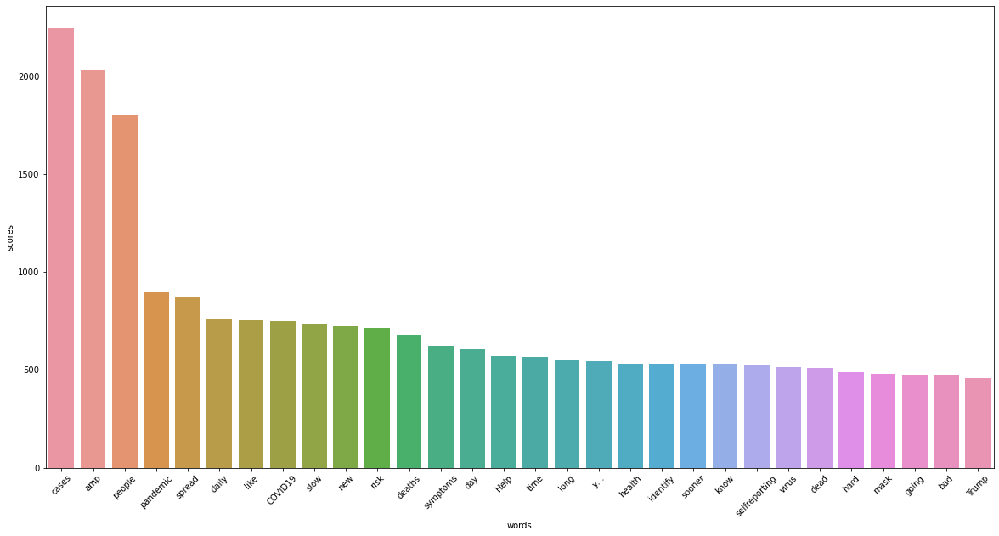

In [94]:


plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=neg_df)
plt.xticks(rotation=45)
plt.show()



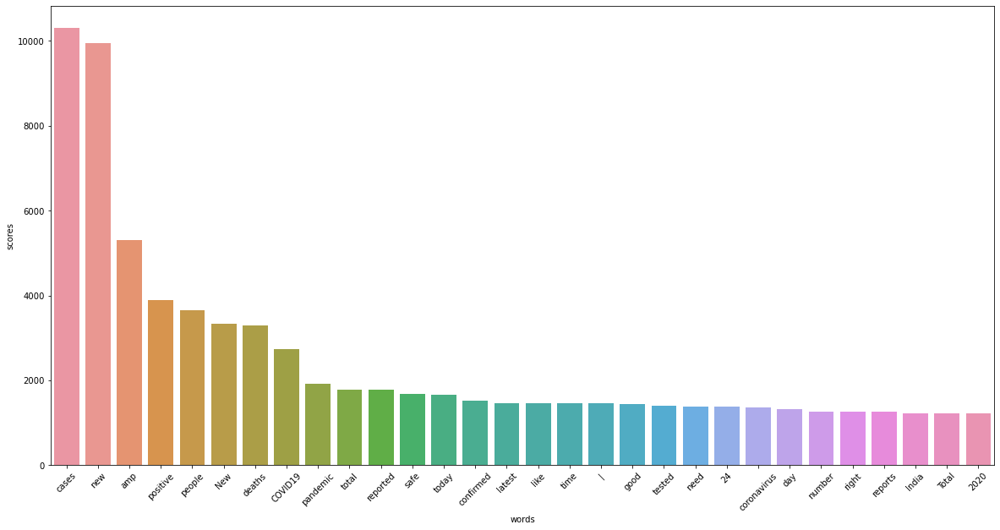

In [95]:
# Plot with seaborn
pos_df = pd.DataFrame(most_common_pos_words.items(),columns=['words','scores'])
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=pos_df)
plt.xticks(rotation=45)
plt.show()

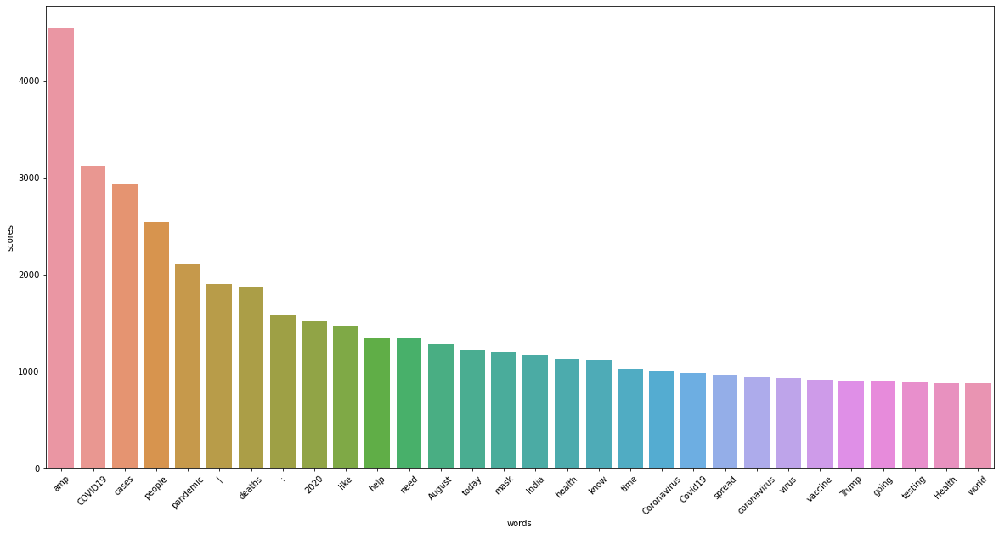

In [96]:
# Plot with seaborn
neut_df = pd.DataFrame(most_common_neut_words.items(),columns=['words','scores'])
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=neut_df)
plt.xticks(rotation=45)
plt.show()

In [99]:
pip install wordcloud

     |████████████████████████████████| 371 kB 886 kB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [100]:
### Word Cloud
from wordcloud import WordCloud

In [105]:
def plot_wordcloud(docx):
    plt.figure(figsize=(20,10))
    mywordcloud = WordCloud().generate(docx)
    plt.imshow(mywordcloud,interpolation='bilinear')
    plt.axis('off')
    plt.show()

In [106]:
pos_docx = ' '.join(pos_tokens)
neg_docx = ' '.join(neg_tokens)
neu_docx = ' '.join(neut_tokens)

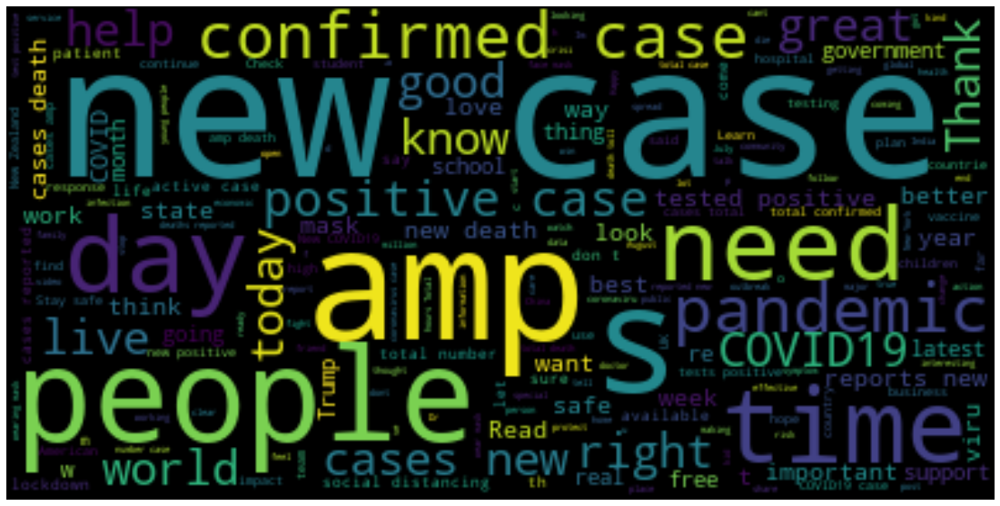

In [107]:
plot_wordcloud(pos_docx)

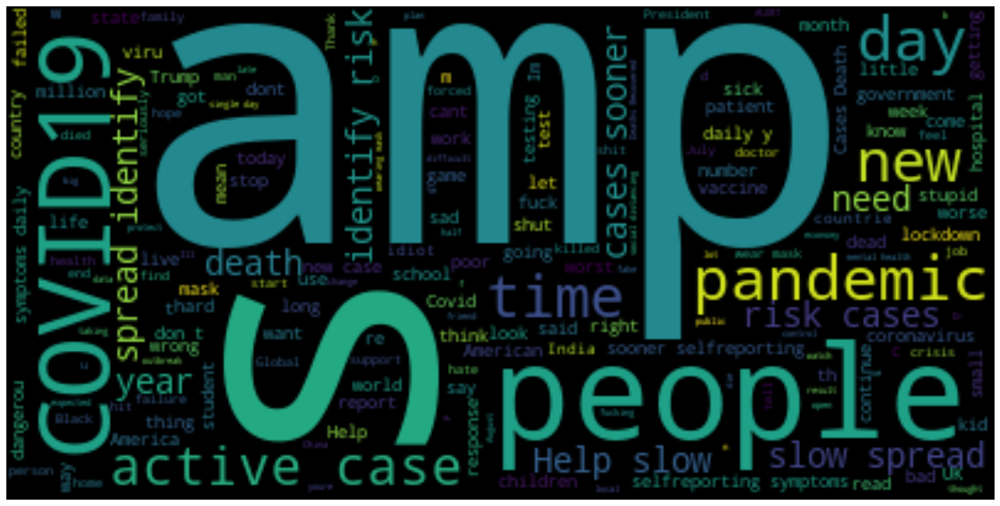

In [108]:
plot_wordcloud(neg_docx)

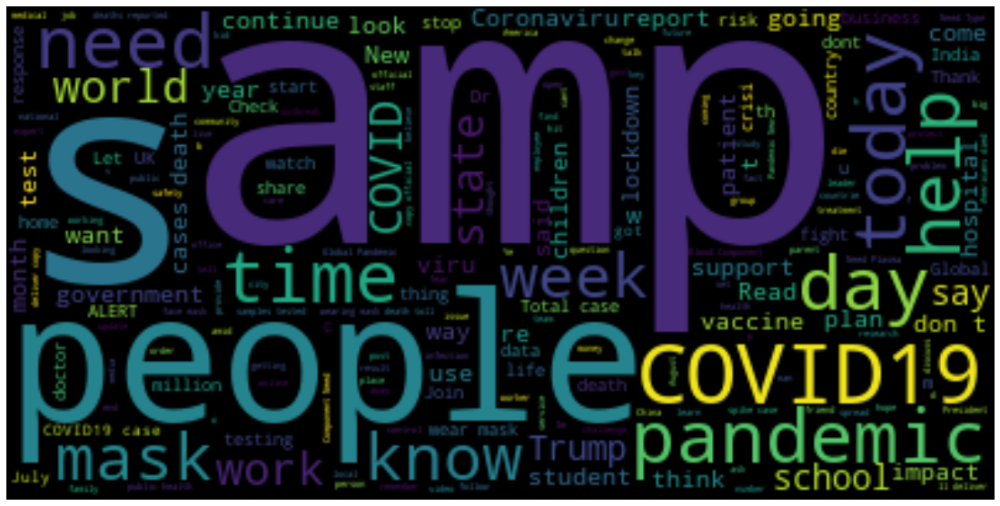

In [109]:
plot_wordcloud(neu_docx)

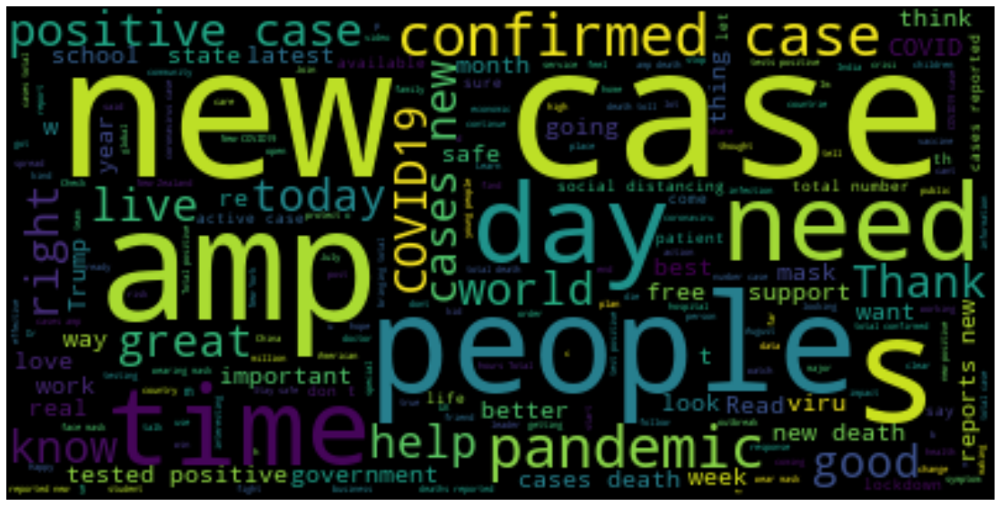

In [110]:
plot_wordcloud(pos_docx)

In [ ]:
### Thanks for your time, MUSKAN GUPTA, M.sc DS